In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import numpy as np
import pandas as pd
import cv2
import matplotlib
import matplotlib.pyplot as plt

In [3]:
import display
import dataloader
from dataloader import ThermalData
import clustering
import anomaly_detection

In [4]:
import module_extraction
#from module_extraction import Filters, Modules
from module_extraction_ortho import Filters, Modules

In [5]:
input_img_path = "./images/ortho/1466.tif"

In [6]:
input_dir_path = "./outputs/"+input_img_path.split("/")[-1][:-4]
print(input_dir_path)

./outputs/1466


画像データの取得

In [7]:
thermal_img_files = dataloader.get_img_files(dir_path=input_dir_path+"/modules",gray=False)
#thermal_img_files_gray = dataloader.get_img_files(dir_path=input_dir_path+"/modules",gray=True)

In [8]:
type(thermal_img_files), len(thermal_img_files)

(dict, 5216)

In [9]:
img_org = cv2.imread(input_img_path, 0)

モジュール情報の取得

In [10]:
import pickle
with open(input_dir_path+'/module_contours.pkl', 'rb') as pkl:
    module_contours = pickle.load(pkl)
#with open(input_dir_path+'/module_labels.pkl', 'rb') as pkl:
with open(input_dir_path+'/module_labels_split.pkl', 'rb') as pkl:
    module_labels = pickle.load(pkl)

温度分布の確認

In [148]:
data = ThermalData(thermal_img_files, scale_type="individual")

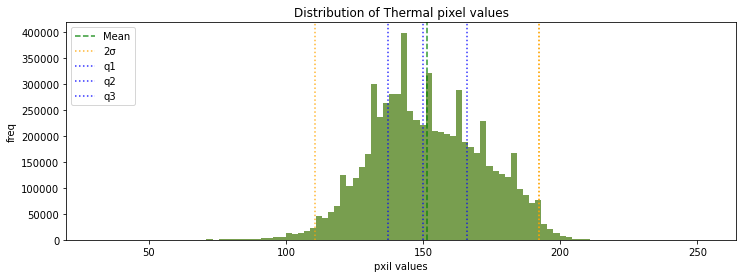

In [149]:
display.display_distributions(data.all_temperature, 
                              filepath = "hist_all_temperature.jpg")

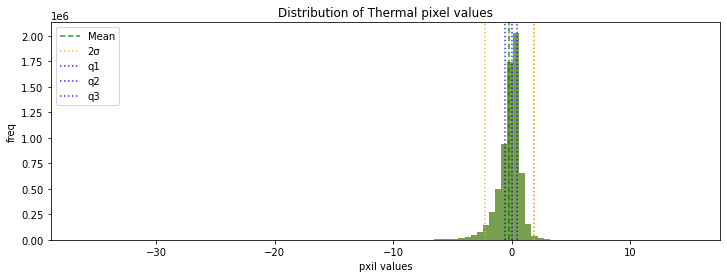

In [150]:
display.display_distributions(data.scaled_all_temperature,
                              filepath = "hist_scaled_all_temperature.jpg")

In [151]:
np.median(data.all_temperature)

150.0

In [209]:
def gamma_correction(x, gamma=1):
    return np.clip(pow(x / 255.0, gamma) * 255.0, 0, 255)

In [223]:
#X = preprocessing.PowerTransformer().fit_transform(data.all_temperature)
X1 = np.log(data.all_temperature)
X2 = np.log(data.all_temperature/ np.median(data.all_temperature))
X3 = gamma_correction(data.all_temperature, gamma=3.0)

/Users/tnozawa/.pyenv/versions/anaconda3-2020.11/lib/python3.8/site-packages/numpy/core/_methods.py:192: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True)


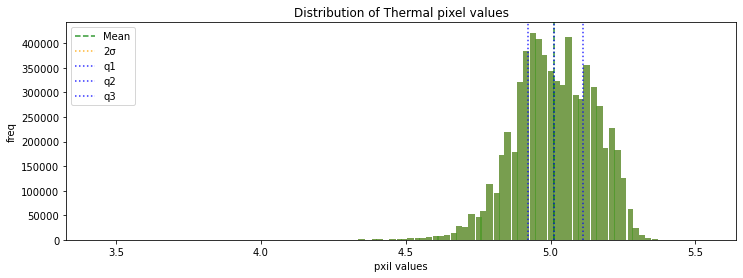

In [224]:
display.display_distributions(X1, 
                              filepath = "hist_all_temperature.jpg")

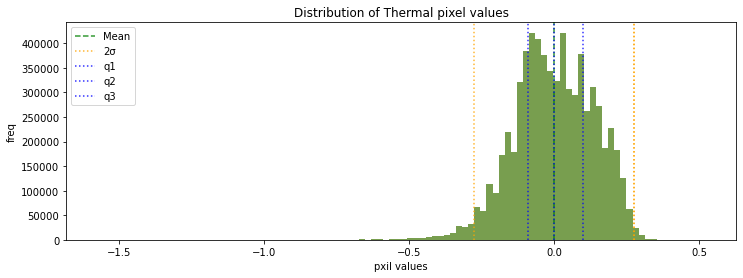

In [225]:
display.display_distributions(X2, 
                              filepath = "hist_all_temperature.jpg")

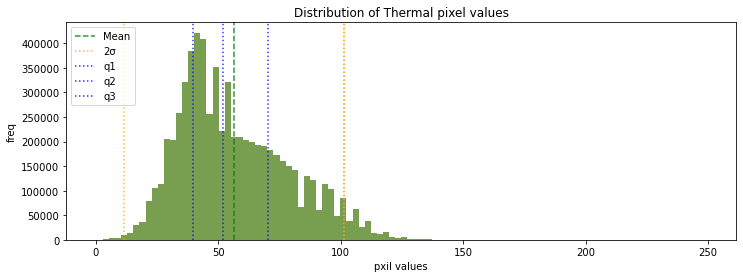

In [226]:
display.display_distributions(X3, 
                              filepath = "hist_all_temperature.jpg")

温度分布の確認（アレイごと）

In [14]:
from sklearn import preprocessing

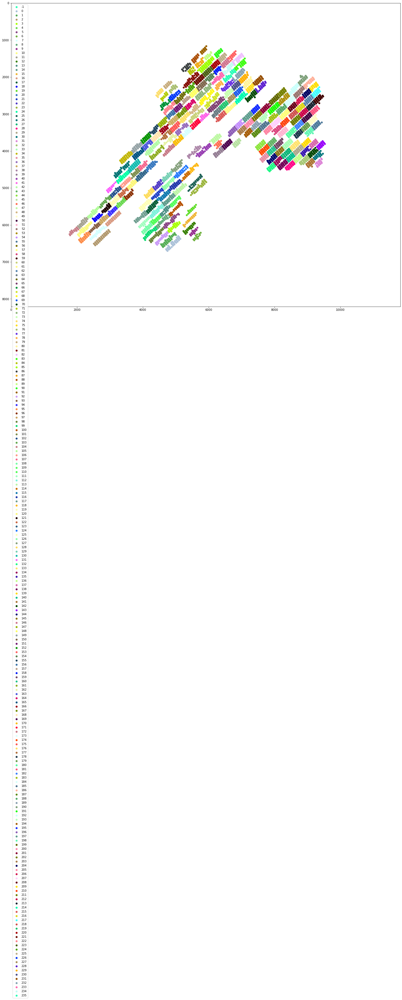

In [15]:
fig, ax = plt.subplots(facecolor="w", figsize=(25,20))
#cmap = plt.get_cmap("tab20")
colors = list(matplotlib.colors.XKCD_COLORS.items())[:max(module_labels)+1]
module_centers = np.array( [c.mean(axis=0) for c in module_contours] )
for i in range(-1,max(module_labels)+1):
    centers = module_centers[module_labels == i]
    plt.scatter(centers[:, 0], centers[:, 1], color=colors[i][1], label=str(i))
#plt.scatter(module_centers[:, 0], module_centers[:, 1], color=cmap(module_labels+1), label=)
ax.legend(loc='upper left')
ax.set_xlim([0, img_org.shape[1]])
ax.set_ylim([img_org.shape[0], 0])
plt.show()

In [120]:
from sklearn.neighbors import LocalOutlierFactor
from sklearn.ensemble import IsolationForest
from sklearn.svm import OneClassSVM

In [17]:
# This will be implemented in ThermalData class
data_array = {}; array_zscaler= {}; 
for c in range(0,max(module_labels)+1):
    indices = np.where(module_labels==c)
    np.where(module_labels==c)
    target_thermal_img_files = pd.Series(thermal_img_files).iloc[indices]
    data_array[c] = ThermalData(target_thermal_img_files, scale_type="individual")
    rscaler = preprocessing.RobustScaler()
    array_zscaler[c] = rscaler.fit(data_array[c].all_temperature)

In [18]:
clustering_method="kmeans"
#clustering_method="xmeans" # not stable
#clustering_method="dbscan"

In [44]:
# clusters temperature 
array_clusters_temperature = {}
for c in range(0,max(module_labels)+1):
    tmp = []
    print("array:", c)
    print("--> generate clusters temperature")
    # -- clustering --
    for k, v in data_array[c].scaled_temperature_with_index.items():
        clusters = clustering.TemperatureClusters(v, method=clustering_method)  
        sliced_data = clusters.get_clusters_data(data_array[c].temperature[k])   
        original_clusters_temperature = np.stack([np.uint8(t.mean(axis=0)) for t in sliced_data])
        tmp.append(original_clusters_temperature)
    array_clusters_temperature[c] = np.vstack(tmp)

array: 0
--> generate clusters temperature
array: 1
--> generate clusters temperature
array: 2
--> generate clusters temperature
array: 3
--> generate clusters temperature
array: 4
--> generate clusters temperature
array: 5
--> generate clusters temperature
array: 6
--> generate clusters temperature
array: 7
--> generate clusters temperature
array: 8
--> generate clusters temperature
array: 9
--> generate clusters temperature
array: 10
--> generate clusters temperature
array: 11
--> generate clusters temperature
array: 12
--> generate clusters temperature
array: 13
--> generate clusters temperature
array: 14
--> generate clusters temperature
array: 15
--> generate clusters temperature
array: 16
--> generate clusters temperature
array: 17
--> generate clusters temperature
array: 18
--> generate clusters temperature
array: 19
--> generate clusters temperature
array: 20
--> generate clusters temperature
array: 21
--> generate clusters temperature
array: 22
--> generate clusters temperatur

array: 185
--> generate clusters temperature
array: 186
--> generate clusters temperature
array: 187
--> generate clusters temperature
array: 188
--> generate clusters temperature
array: 189
--> generate clusters temperature
array: 190
--> generate clusters temperature
array: 191
--> generate clusters temperature
array: 192
--> generate clusters temperature
array: 193
--> generate clusters temperature
array: 194
--> generate clusters temperature
array: 195
--> generate clusters temperature
array: 196
--> generate clusters temperature
array: 197
--> generate clusters temperature
array: 198
--> generate clusters temperature
array: 199
--> generate clusters temperature
array: 200
--> generate clusters temperature
array: 201
--> generate clusters temperature
array: 202
--> generate clusters temperature
array: 203
--> generate clusters temperature
array: 204
--> generate clusters temperature
array: 205
--> generate clusters temperature
array: 206
--> generate clusters temperature
array: 207

In [267]:
# clf models
gamma = 5.0
array_zscaler_cluster = {}; 
array_lof = {}; array_lof_gamma = {}; 
array_isof = {}; array_isof_gamma = {};
for c in range(0,max(module_labels)+1):
    print("array:", c)
    n_modules = len(data_array[c].temperature)
    # -- Zscaler -- 
    rscaler = preprocessing.RobustScaler()
    array_zscaler_cluster[c] = rscaler.fit(array_clusters_temperature[c])
    # -- LocalOutlierFactor --
    lof1 = LocalOutlierFactor(n_neighbors=n_modules, contamination="auto", novelty=True)
    lof2 = LocalOutlierFactor(n_neighbors=n_modules, contamination="auto", novelty=True)
    array_lof[c] = lof1.fit(
        array_clusters_temperature[c])
    array_lof[c].offset_ = -1.55 # default: -1.5
    #array_lof[c] = lof.fit(np.log(array_clusters_temperature[c]))
    #array_lof[c] = lof.fit(np.log(array_clusters_temperature[c] / np.median(array_clusters_temperature[c] ) ))
    array_lof_gamma[c] = lof2.fit(
        gamma_correction(array_clusters_temperature[c], gamma=gamma))
    array_lof_gamma[c].offset_ = -1.55 # default: -1.5
    # -- IsolationForest --
    isof1 = IsolationForest(contamination="auto")
    isof2 = IsolationForest(contamination="auto")
    array_isof[c] = isof1.fit(
        array_clusters_temperature[c])
    array_isof[c].offset_ = -0.65 # default: -0.5
    #array_isof[c] = isof.fit(np.log(array_clusters_temperature[c]))
    array_isof_gamma[c] = isof2.fit(
        gamma_correction(array_clusters_temperature[c], gamma=gamma))                
    array_isof_gamma[c].offset_ = -0.65 # default: -0.5

array: 0
array: 1
array: 2
array: 3
array: 4
array: 5
array: 6
array: 7
array: 8
array: 9
array: 10
array: 11
array: 12
array: 13
array: 14
array: 15
array: 16
array: 17
array: 18
array: 19
array: 20
array: 21
array: 22
array: 23
array: 24
array: 25
array: 26
array: 27
array: 28
array: 29
array: 30
array: 31
array: 32
array: 33
array: 34
array: 35
array: 36
array: 37
array: 38
array: 39
array: 40
array: 41
array: 42
array: 43
array: 44
array: 45
array: 46
array: 47
array: 48
array: 49
array: 50
array: 51
array: 52
array: 53
array: 54
array: 55
array: 56
array: 57
array: 58
array: 59
array: 60
array: 61
array: 62
array: 63
array: 64
array: 65
array: 66
array: 67
array: 68
array: 69
array: 70
array: 71
array: 72
array: 73
array: 74
array: 75
array: 76
array: 77
array: 78
array: 79
array: 80
array: 81
array: 82
array: 83
array: 84
array: 85
array: 86
array: 87
array: 88
array: 89
array: 90
array: 91
array: 92
array: 93
array: 94
array: 95
array: 96
array: 97
array: 98
array: 99
array: 100

In [268]:
def check_outliers(models1, models2):
    cmap = plt.get_cmap("tab20")
    for c in range(0,max(module_labels)+1):
        print("array:", c)
        fig = plt.figure(facecolor="w", figsize=(12,4))
        ax1 = fig.add_subplot(1, 2, 1)
        ax2 = fig.add_subplot(1, 2, 2)
        X1 = array_clusters_temperature[c]
        X2 = gamma_correction(array_clusters_temperature[c], gamma=gamma)
        #X = np.log(array_clusters_temperature[c])
        #X = np.log(array_clusters_temperature[c]  / np.median(array_clusters_temperature[c]))
        pred1 = models1[c].predict(X1)
        pred2 = models2[c].predict(X2)
        ax1.scatter(X1[:, 0], X1[:, 1], color=cmap(pred1+1))
        ax2.scatter(X2[:, 0], X2[:, 1], color=cmap(pred2+1))
        #ax.legend(loc='upper left')
        plt.show()

array: 0


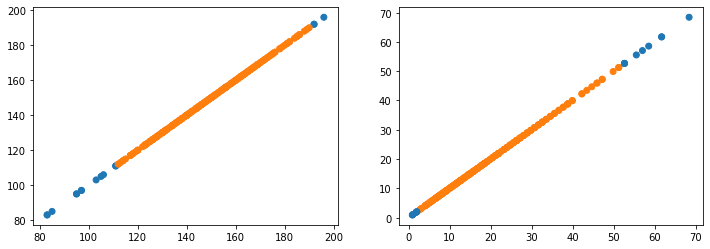

array: 1


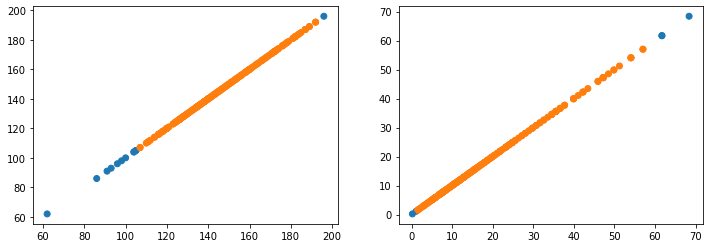

array: 2


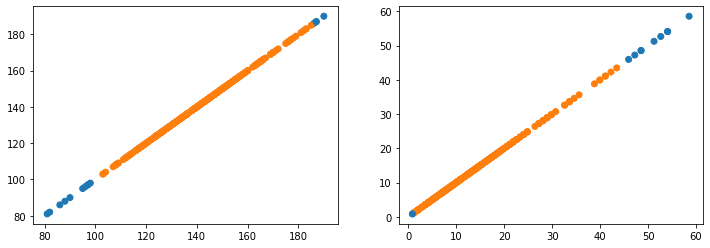

array: 3


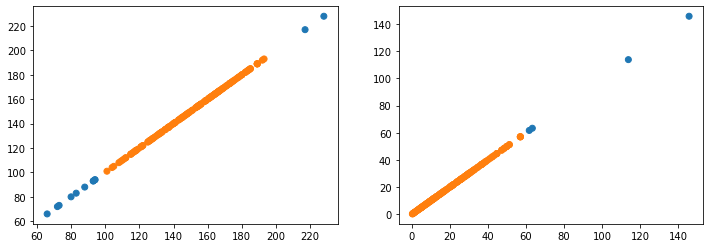

array: 4


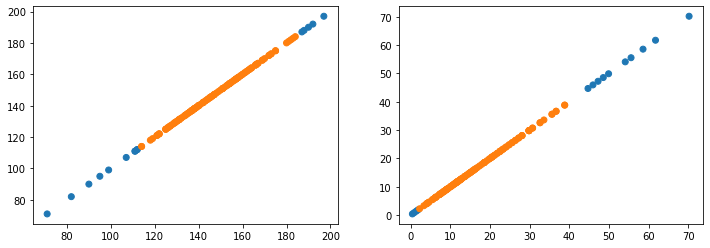

array: 5


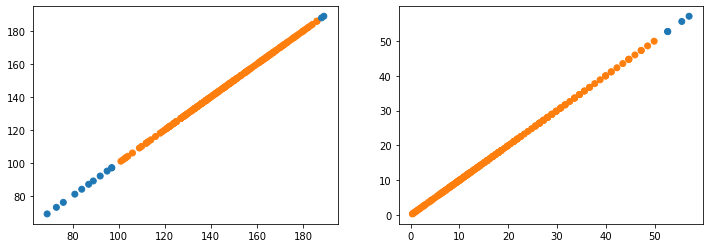

array: 6


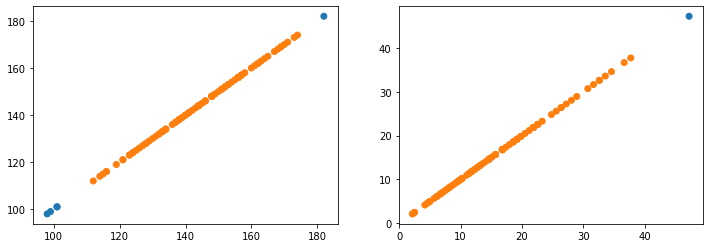

array: 7


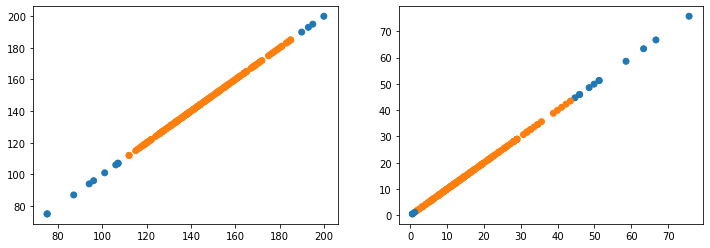

array: 8


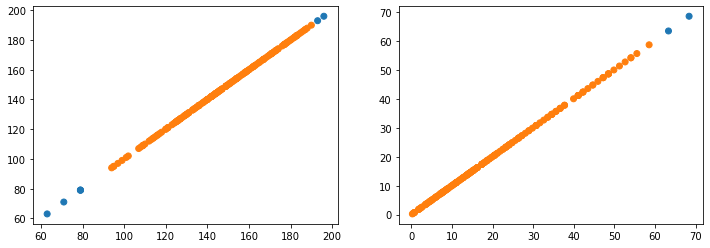

array: 9


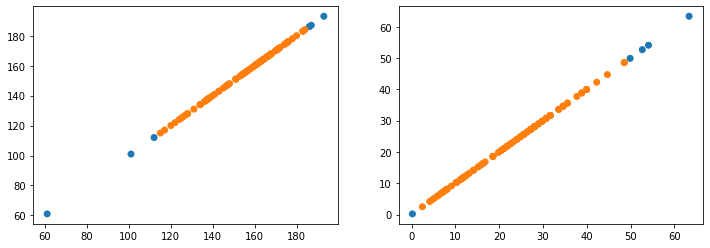

array: 10


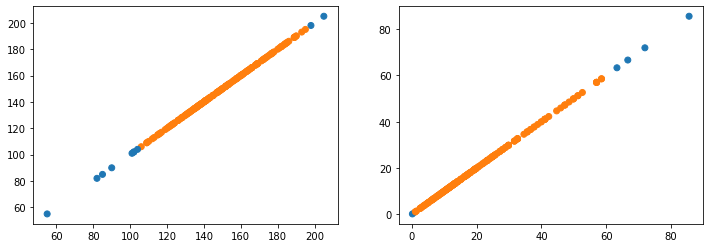

array: 11


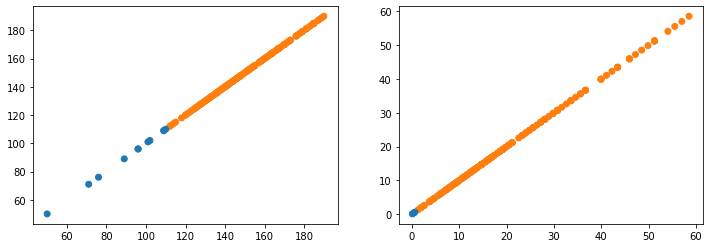

array: 12


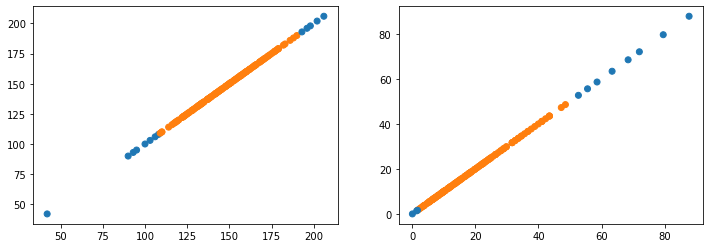

array: 13


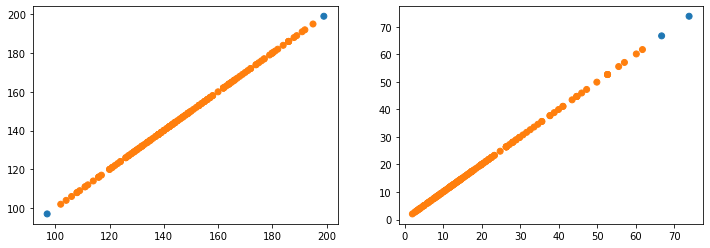

array: 14


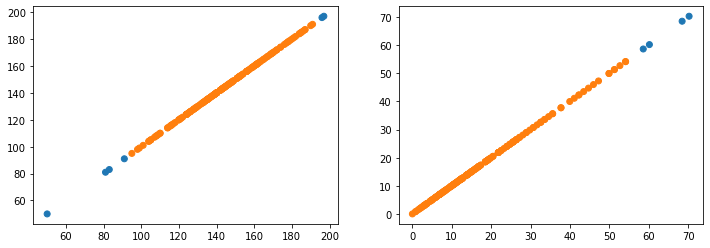

array: 15


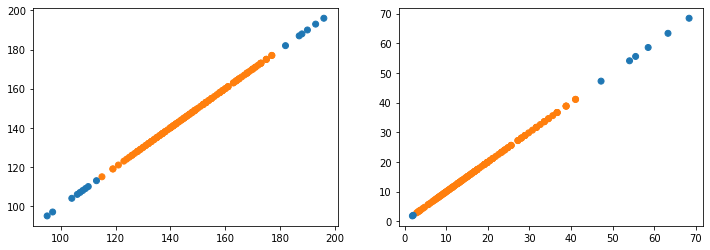

array: 16


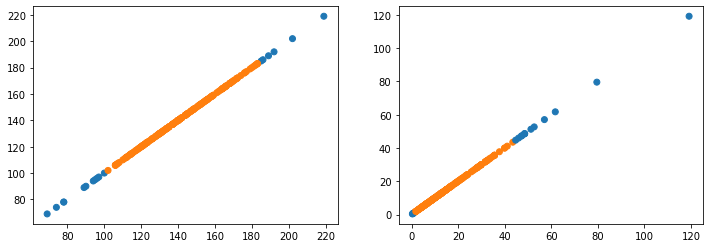

array: 17


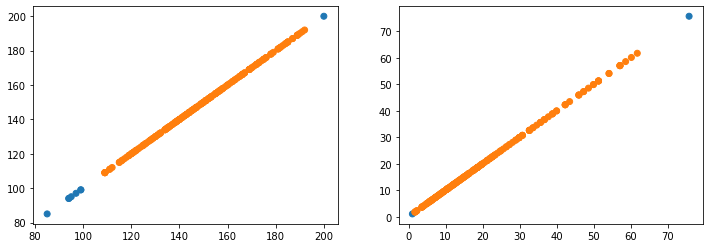

array: 18


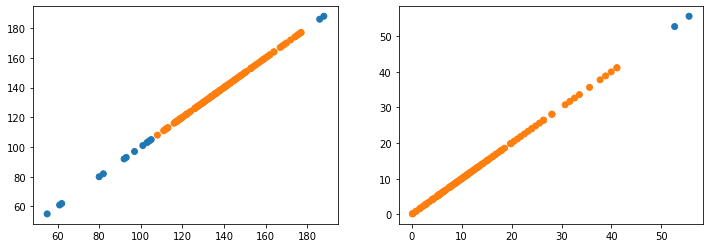

array: 19


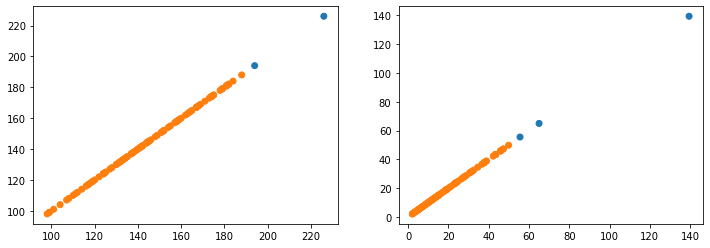

array: 20


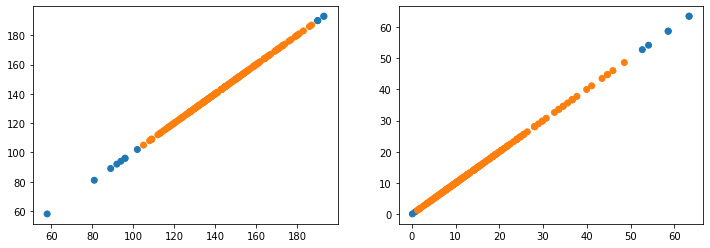

array: 21


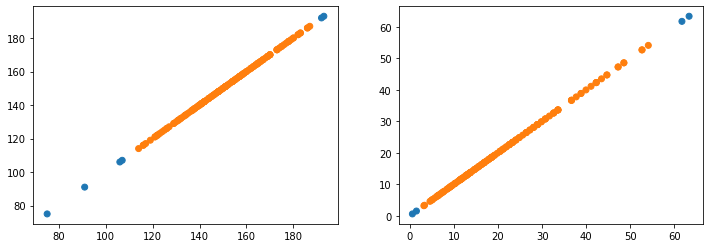

array: 22


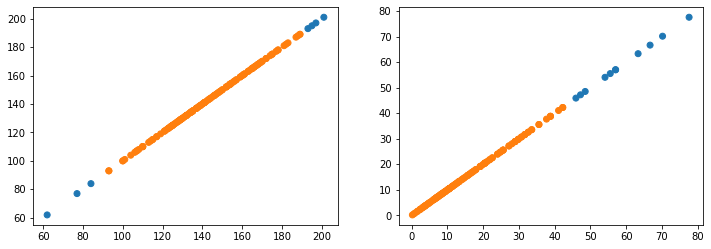

array: 23


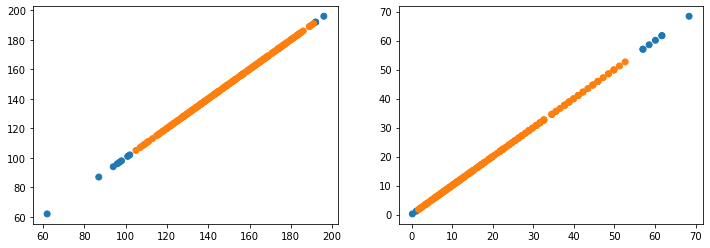

array: 24


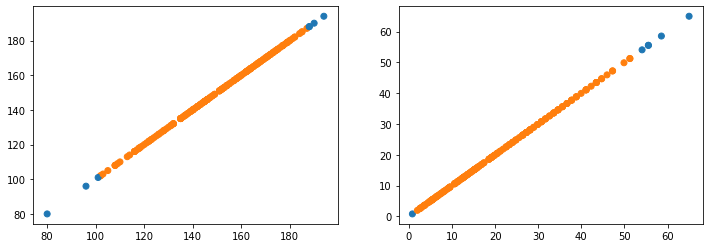

array: 25


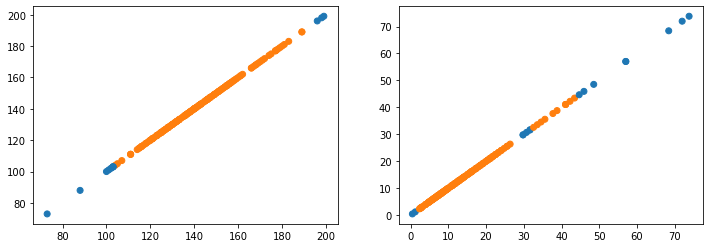

array: 26


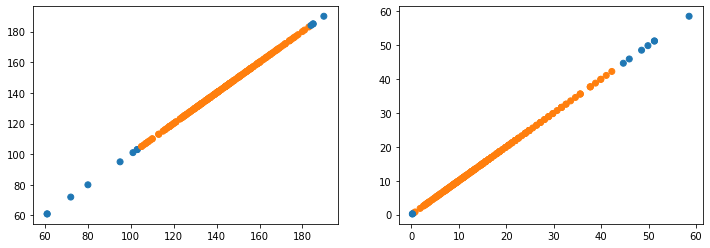

array: 27


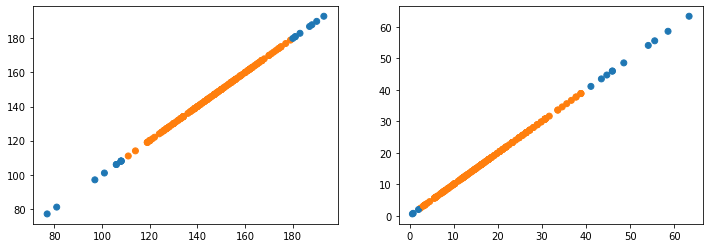

array: 28


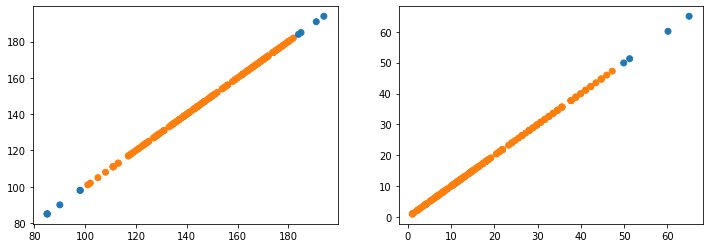

array: 29


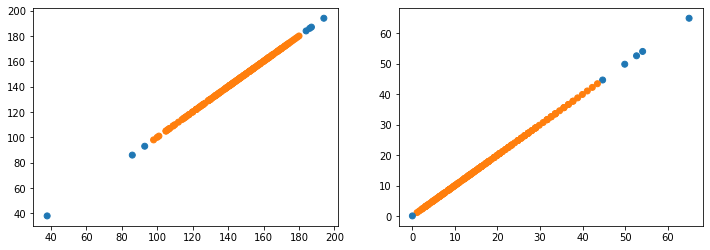

array: 30


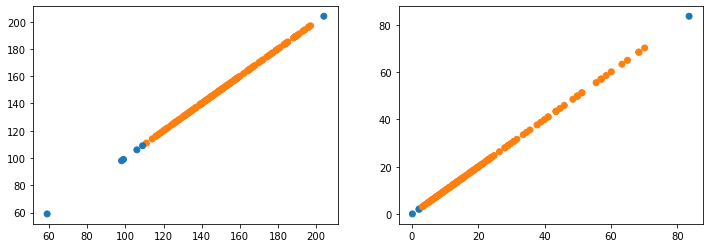

array: 31


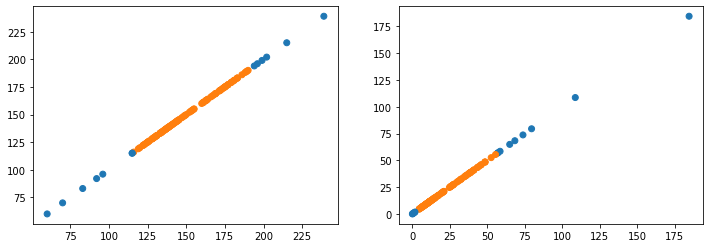

array: 32


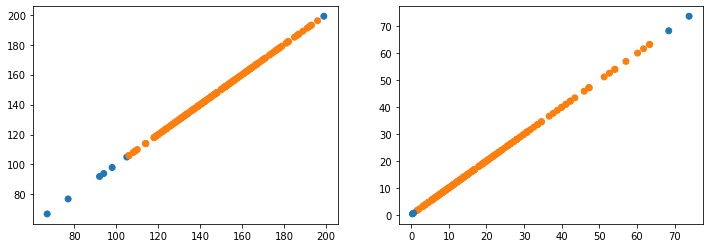

array: 33


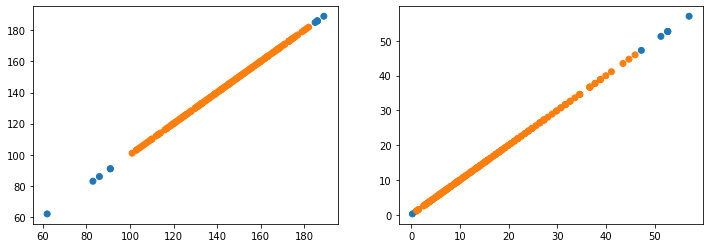

array: 34


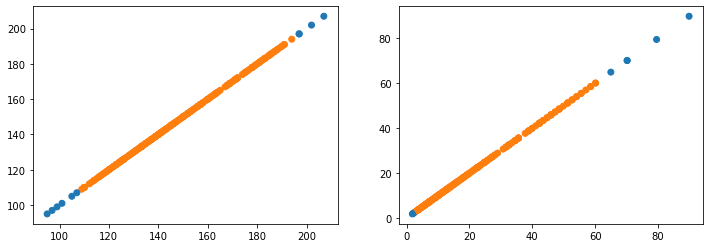

array: 35


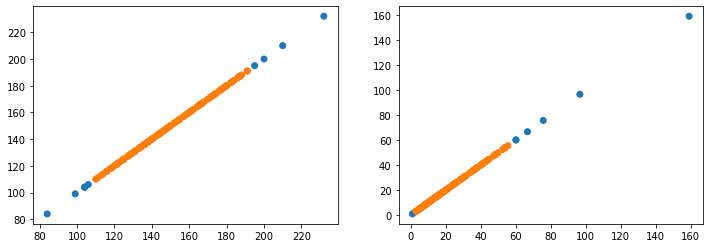

array: 36


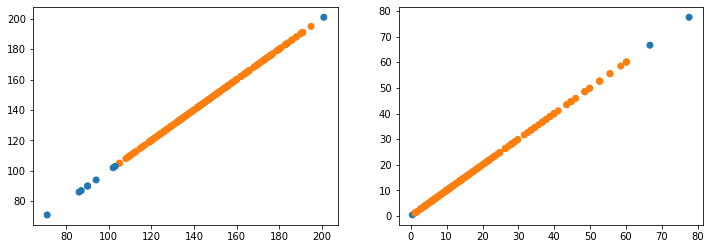

array: 37


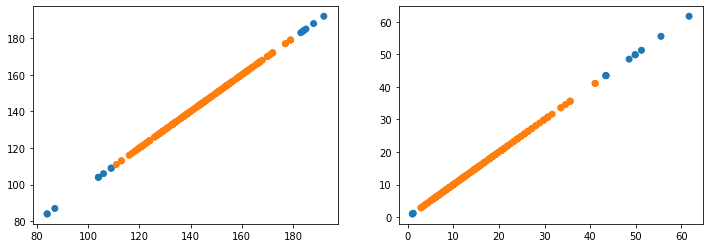

array: 38


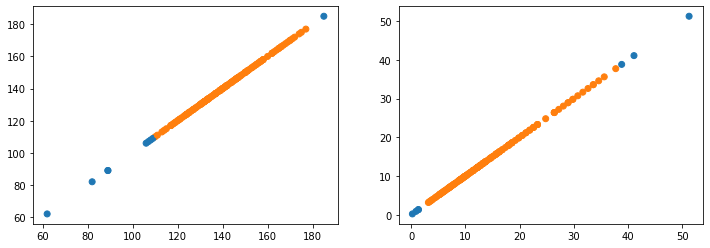

array: 39


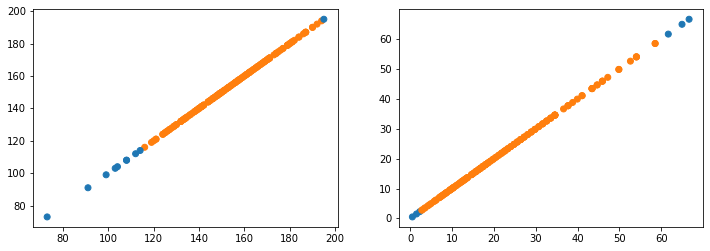

array: 40


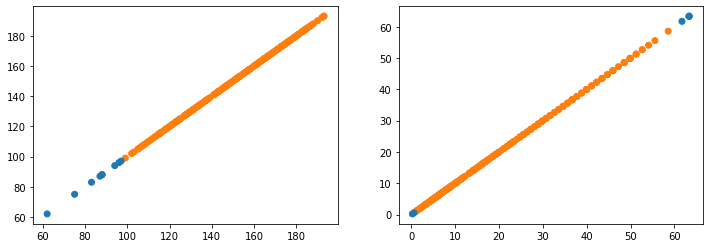

array: 41


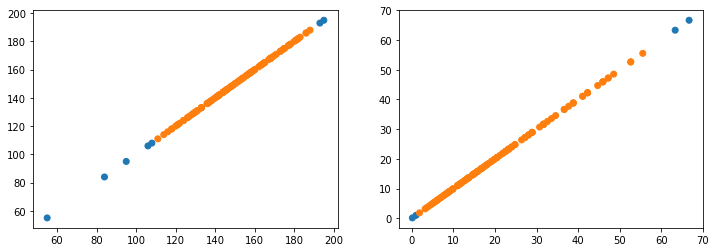

array: 42


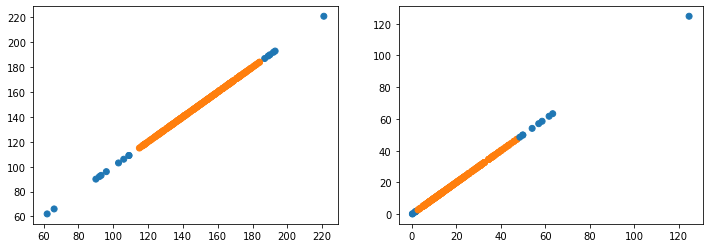

array: 43


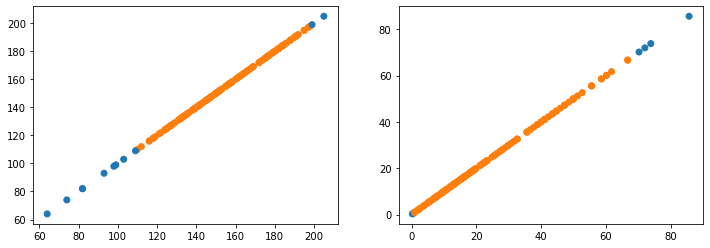

array: 44


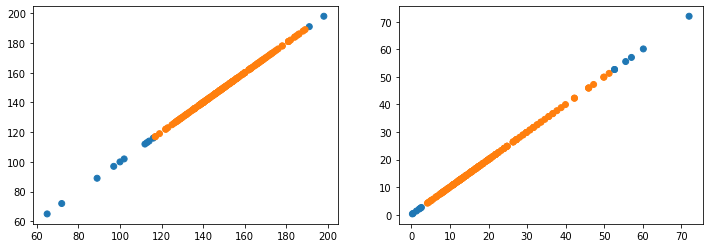

array: 45


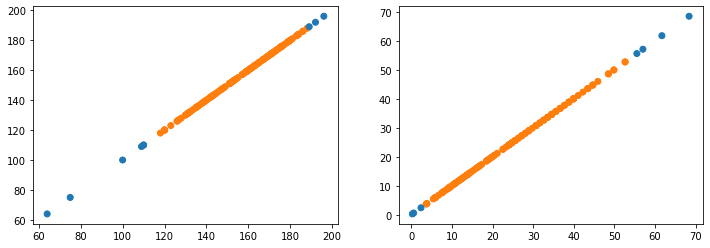

array: 46


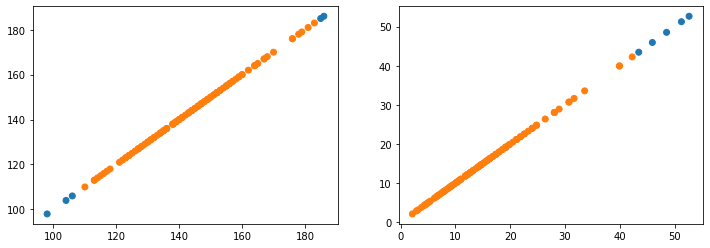

array: 47


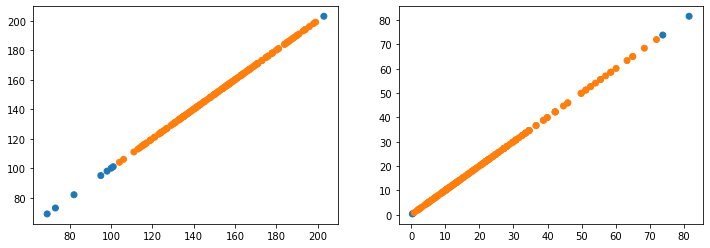

array: 48


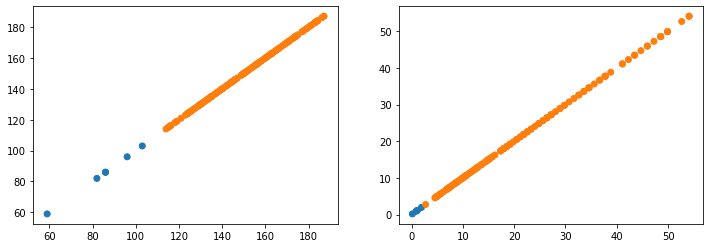

array: 49


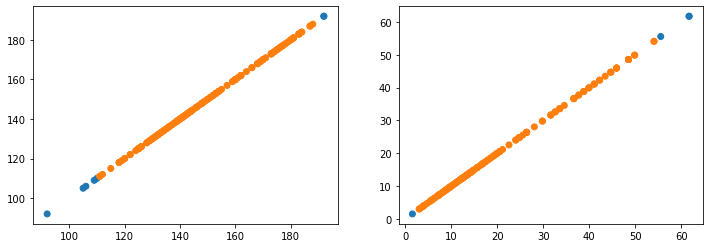

array: 50


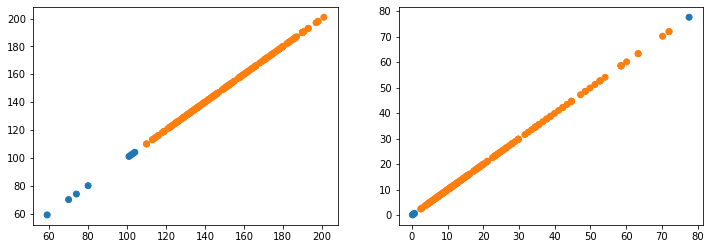

array: 51


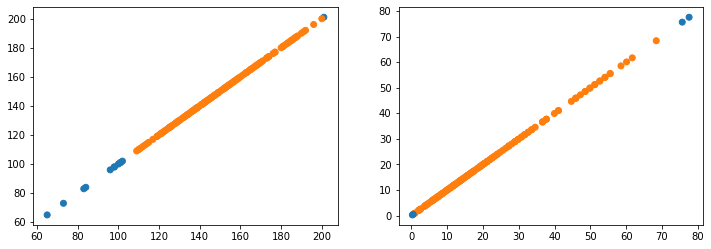

array: 52


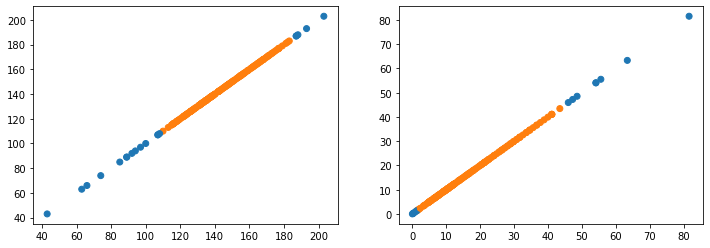

array: 53


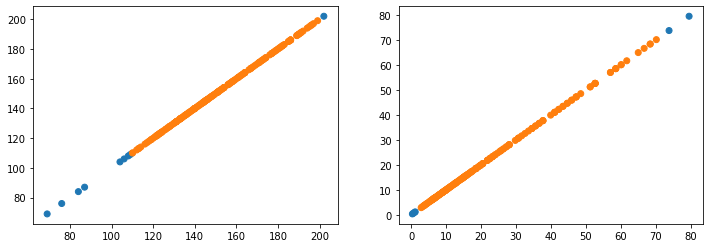

array: 54


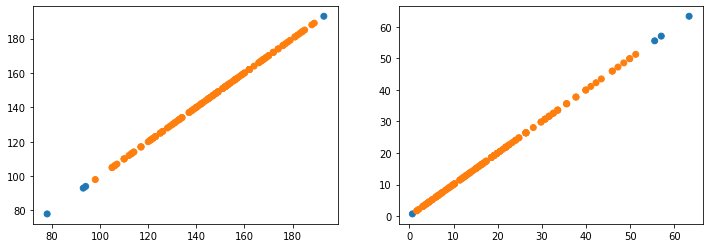

array: 55


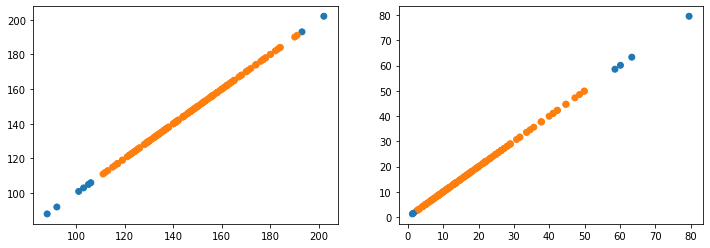

array: 56


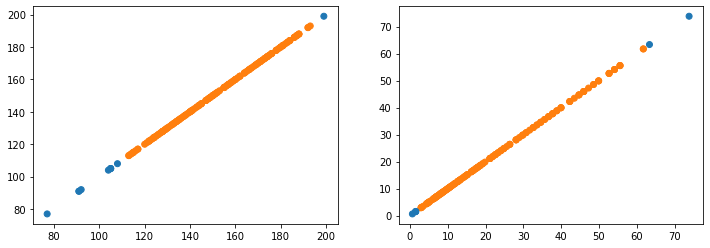

array: 57


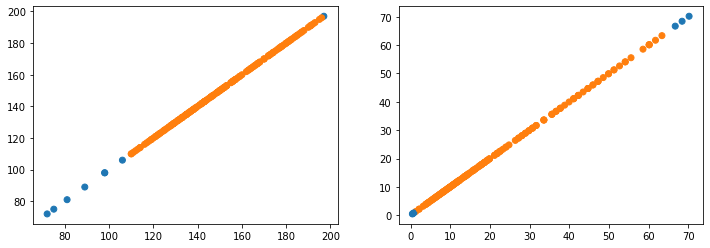

array: 58


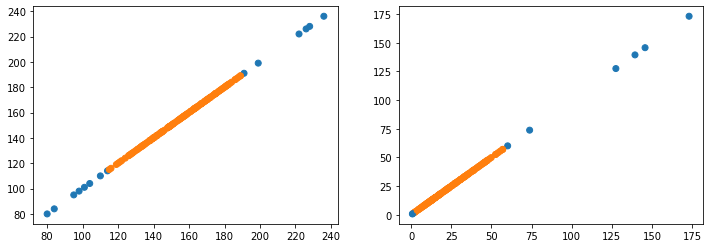

array: 59


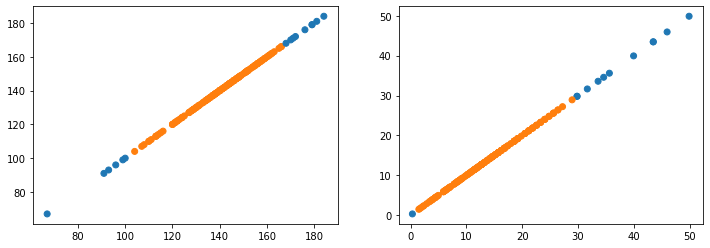

array: 60


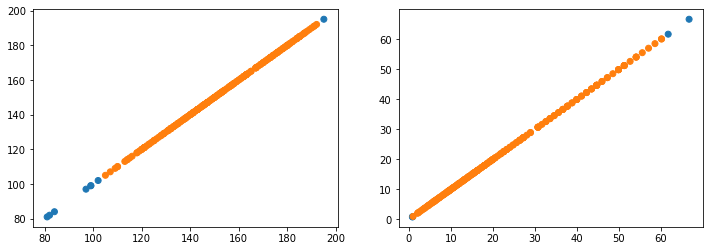

array: 61


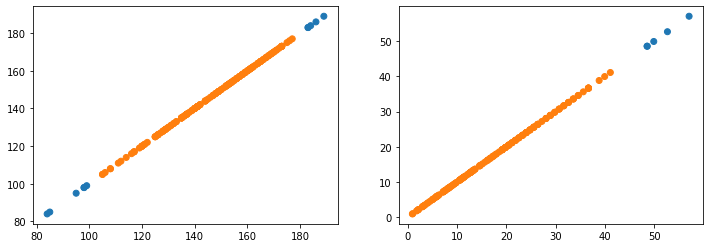

array: 62


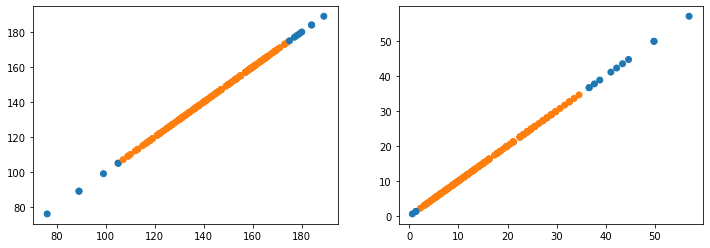

array: 63


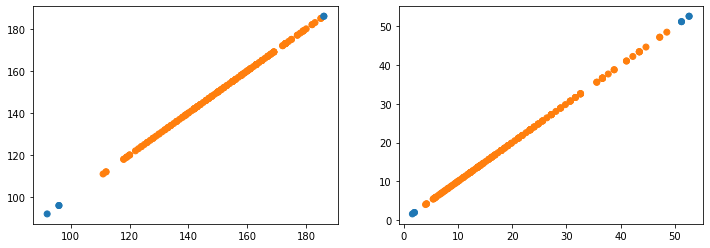

array: 64


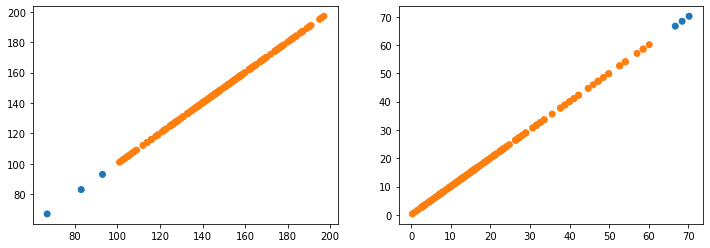

array: 65


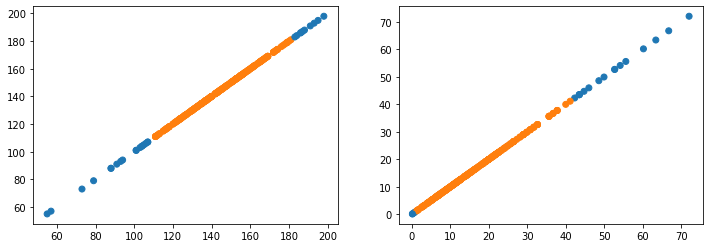

array: 66


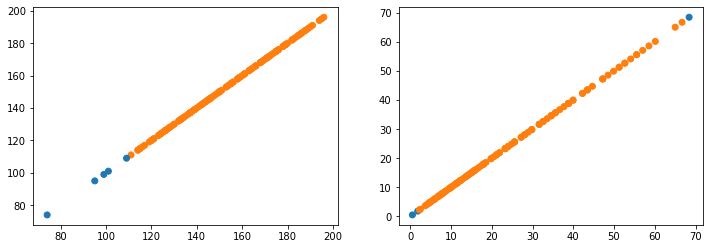

array: 67


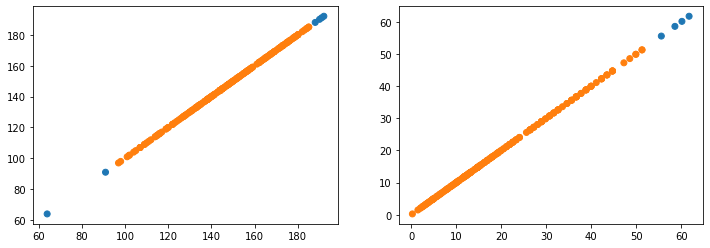

array: 68


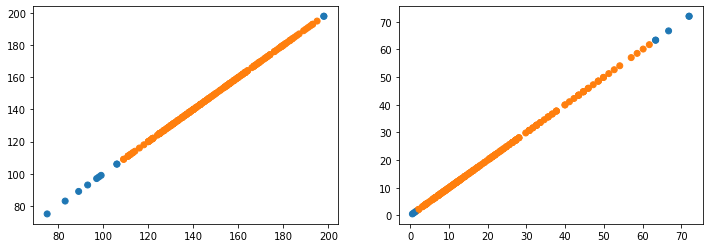

array: 69


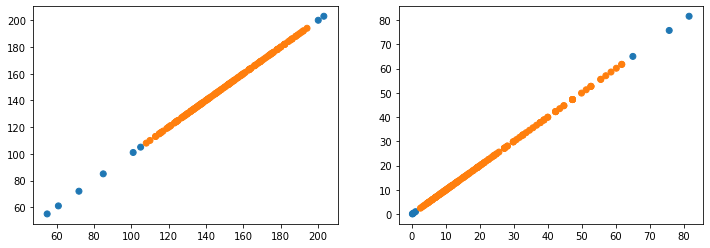

array: 70


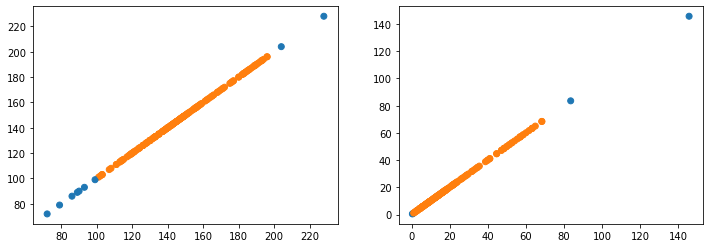

array: 71


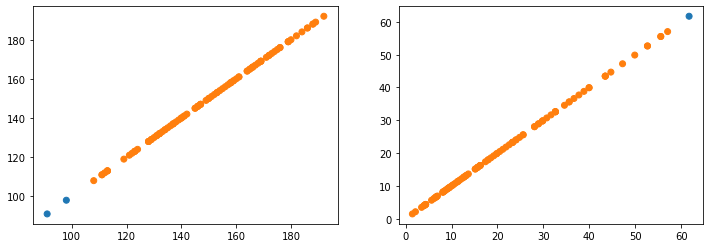

array: 72


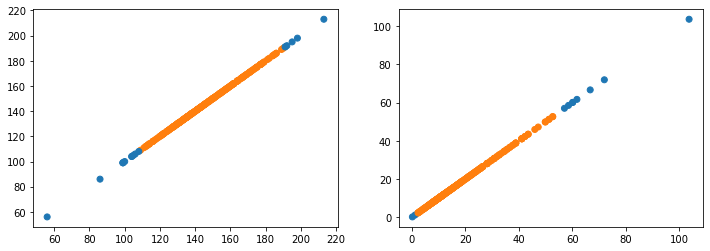

array: 73


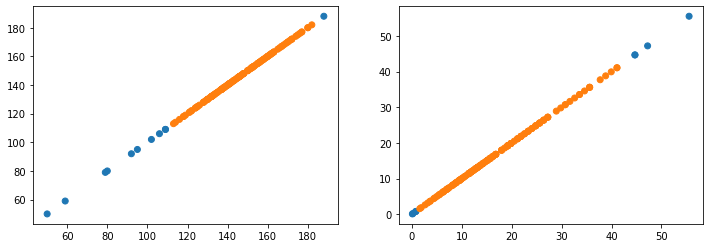

array: 74


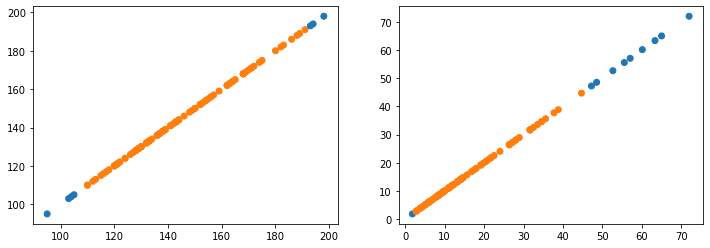

array: 75


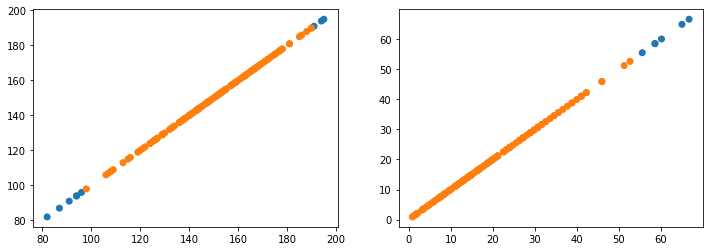

array: 76


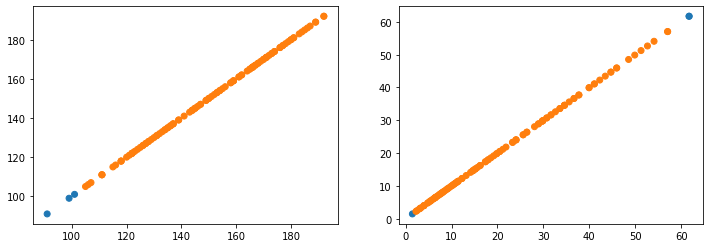

array: 77


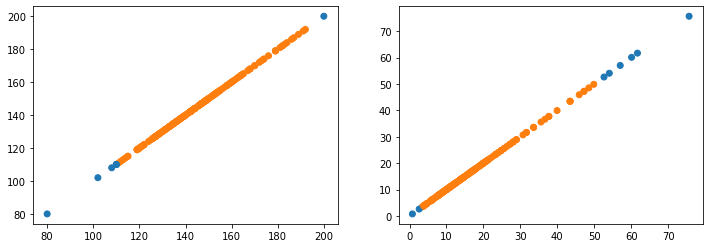

array: 78


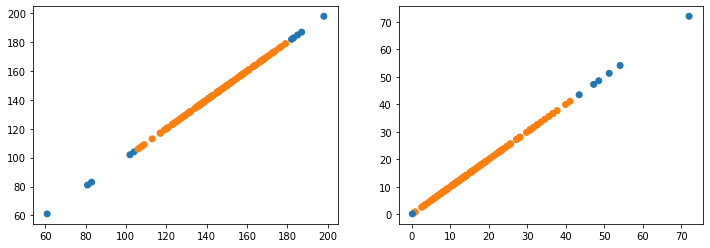

array: 79


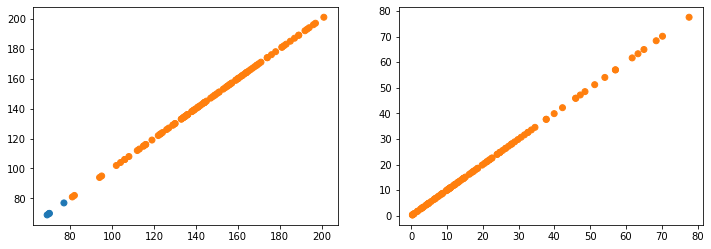

array: 80


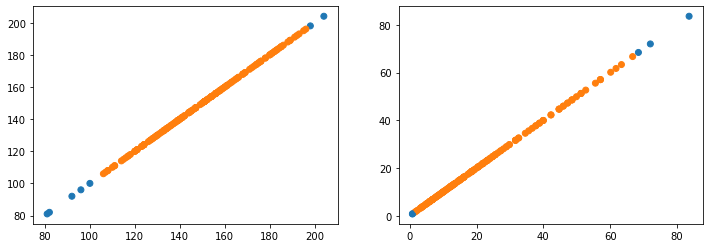

array: 81


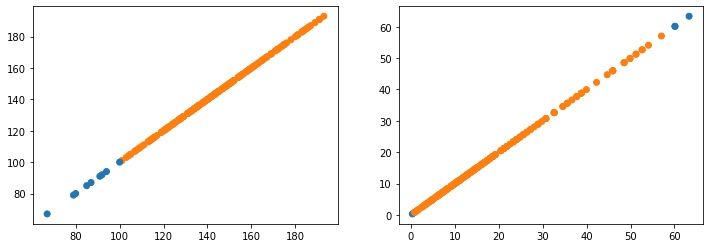

array: 82


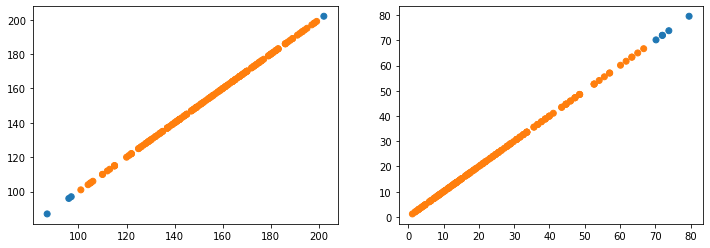

array: 83


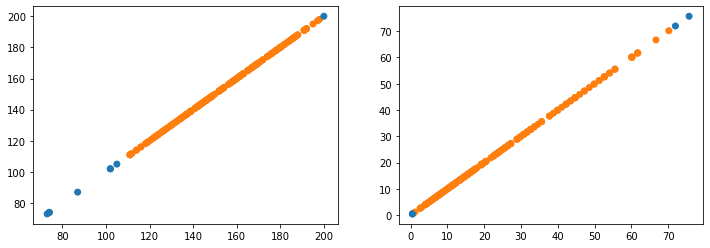

array: 84


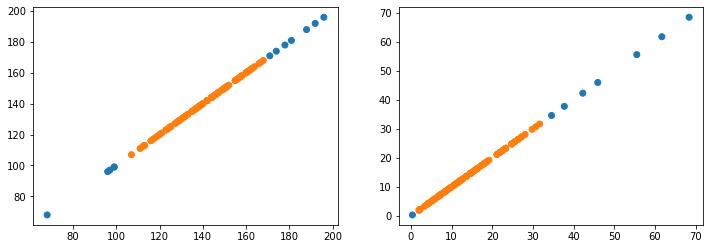

array: 85


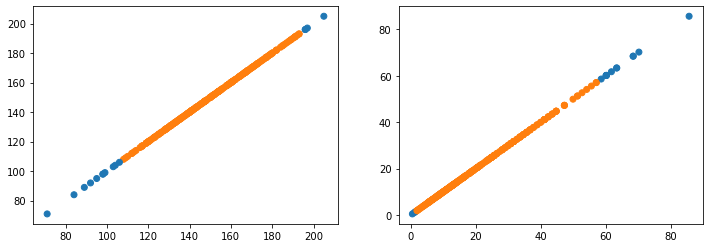

array: 86


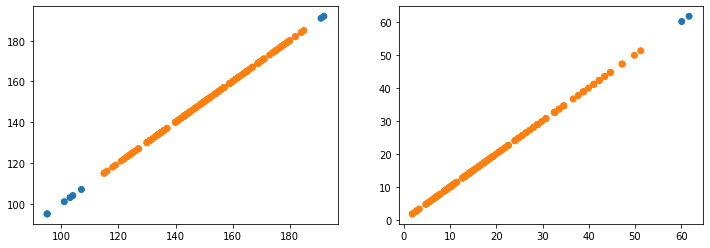

array: 87


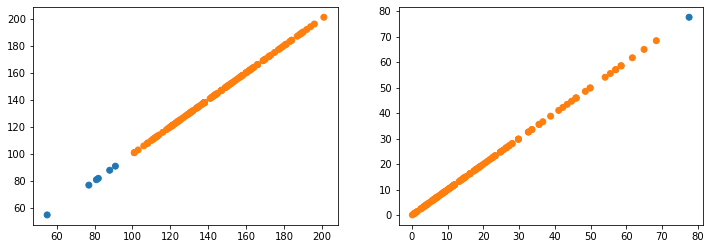

array: 88


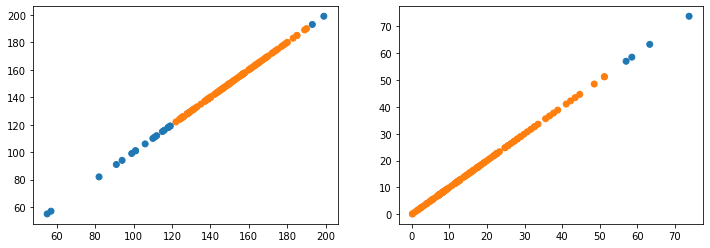

array: 89


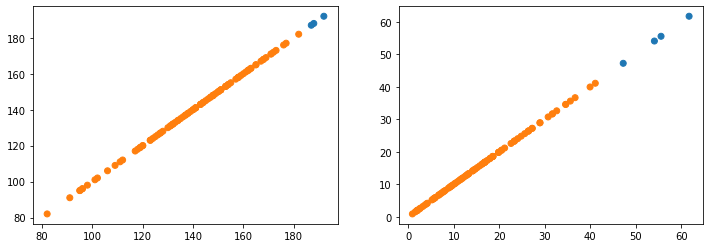

array: 90


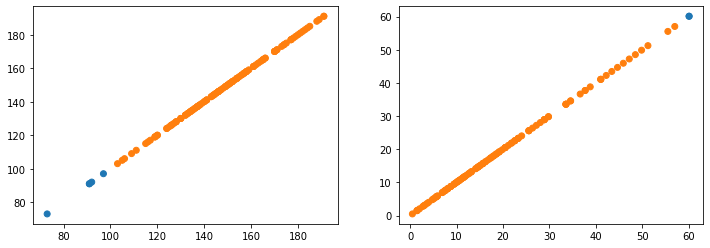

array: 91


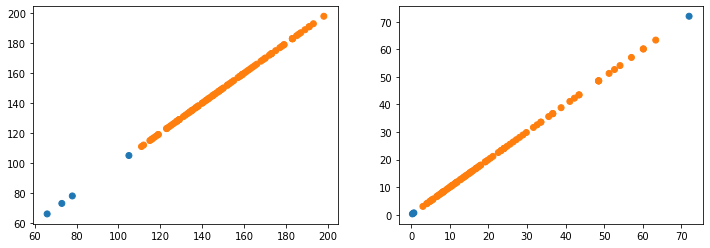

array: 92


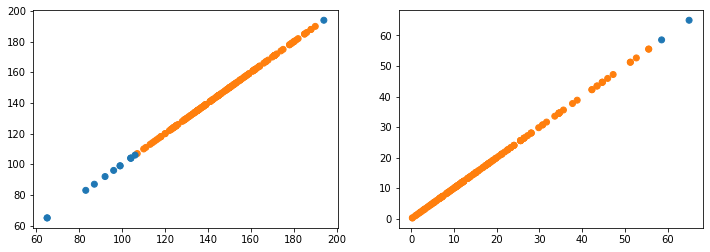

array: 93


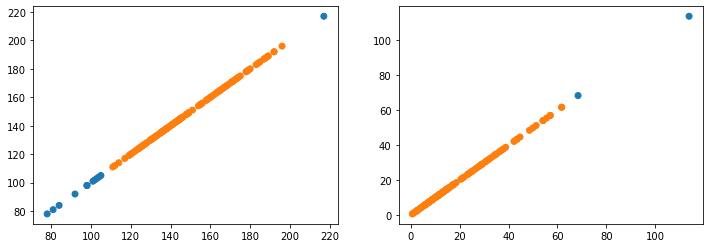

array: 94


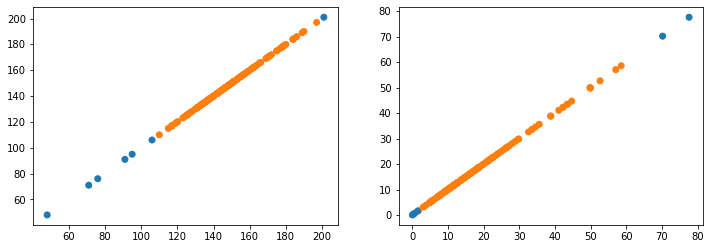

array: 95


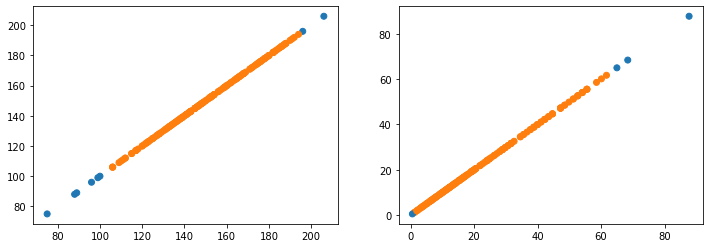

array: 96


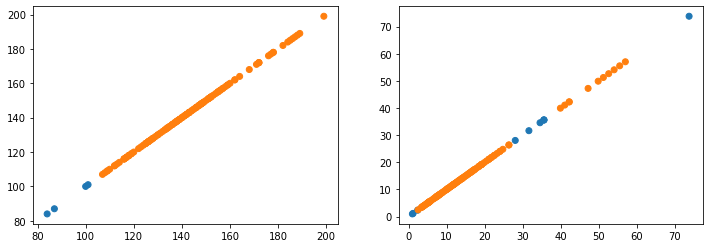

array: 97


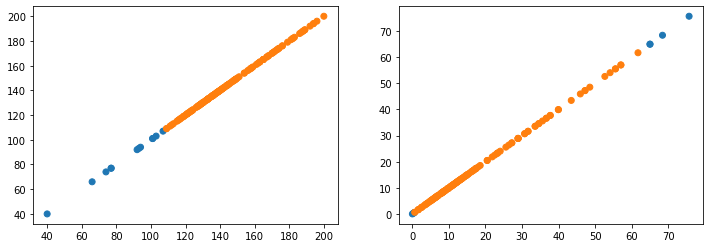

array: 98


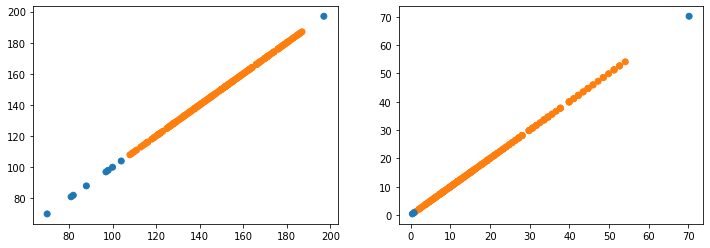

array: 99


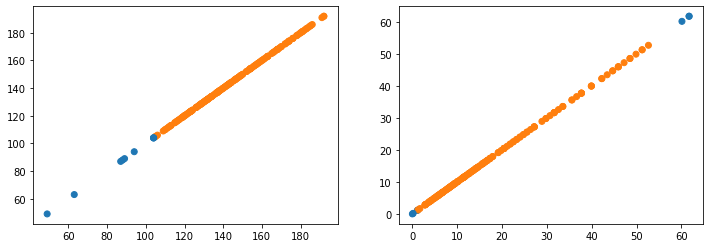

array: 100


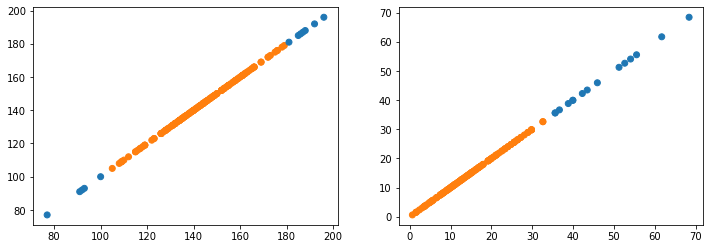

array: 101


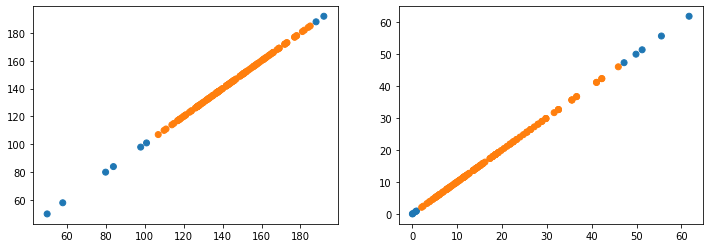

array: 102


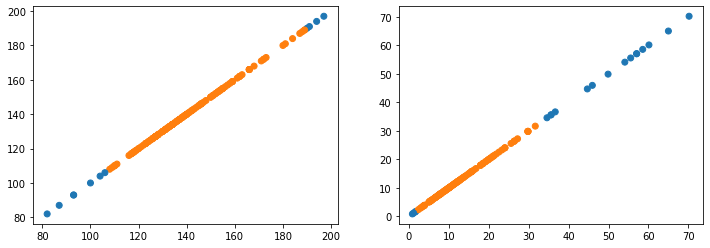

array: 103


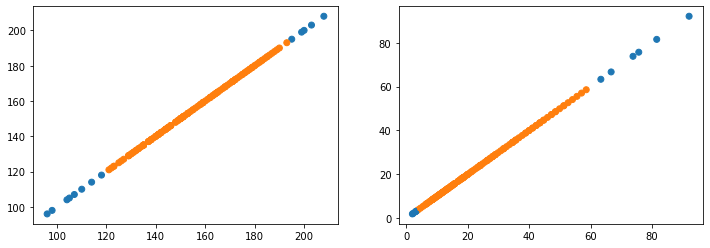

array: 104


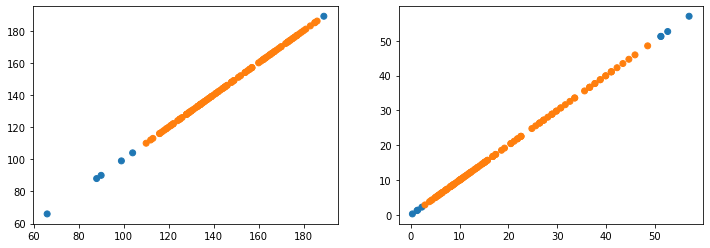

array: 105


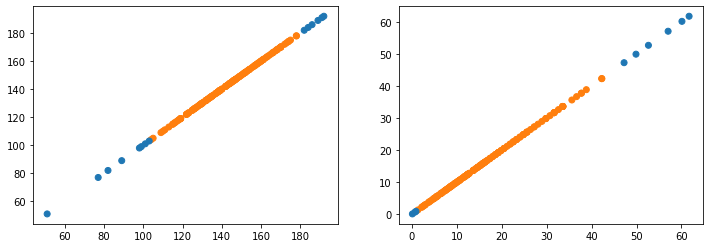

array: 106


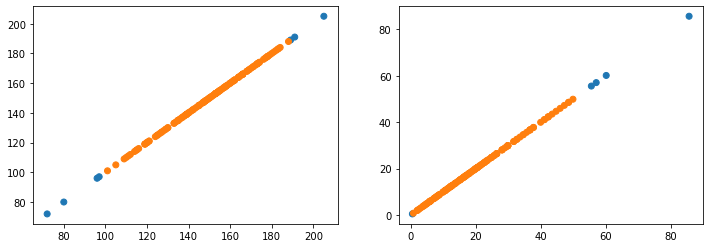

array: 107


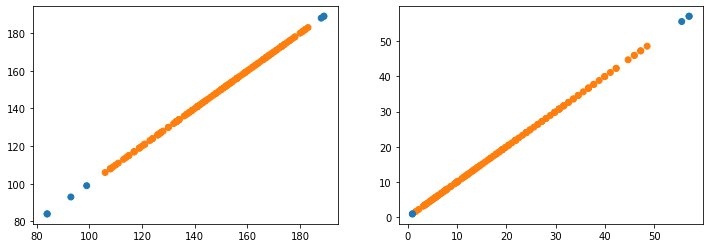

array: 108


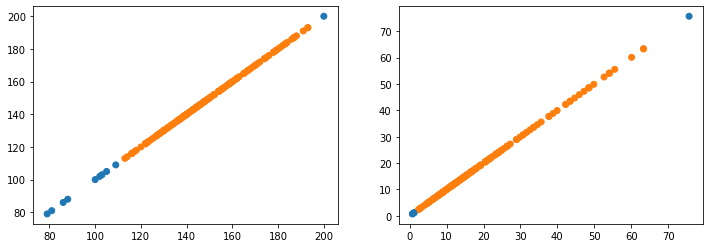

array: 109


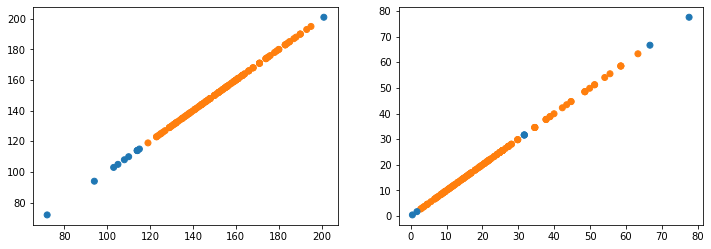

array: 110


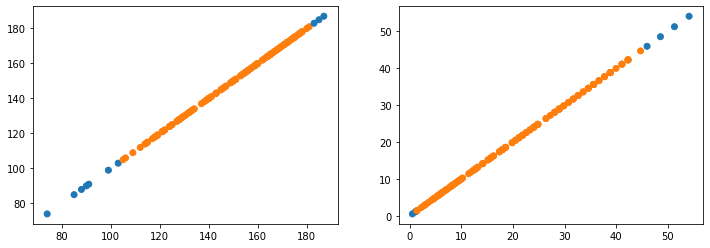

array: 111


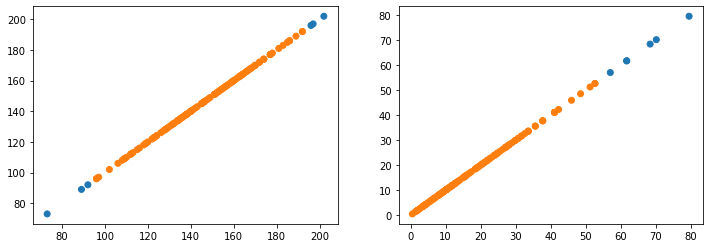

array: 112


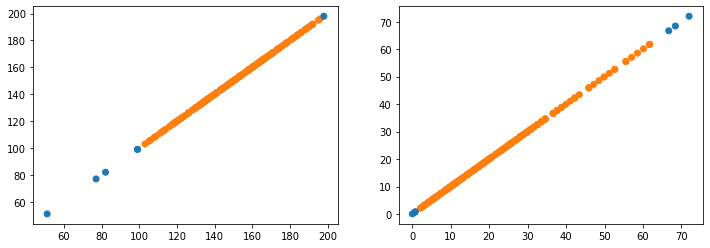

array: 113


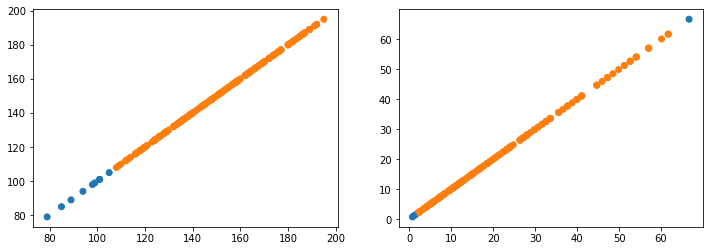

array: 114


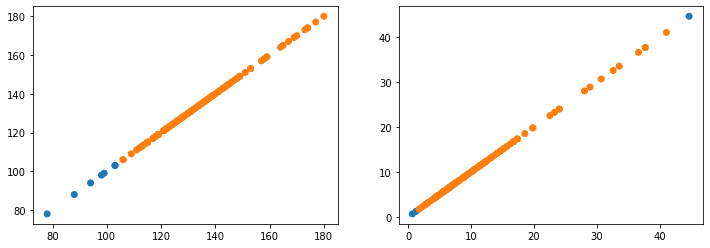

array: 115


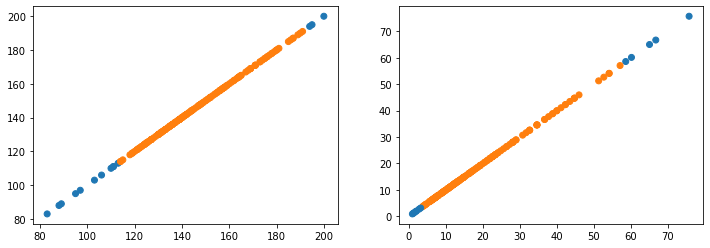

array: 116


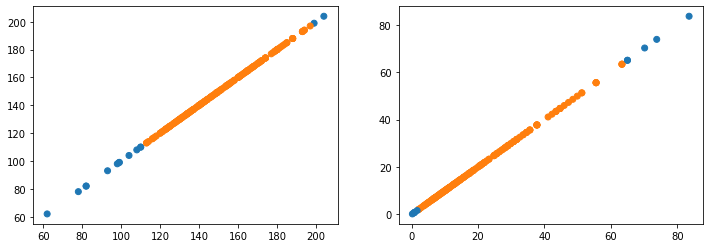

array: 117


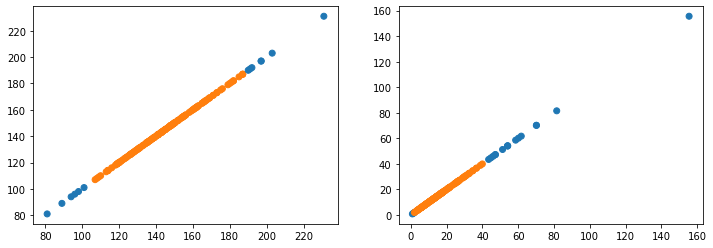

array: 118


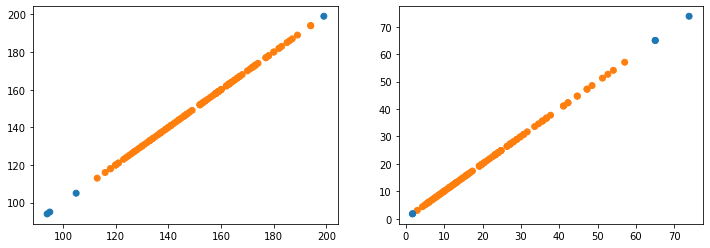

array: 119


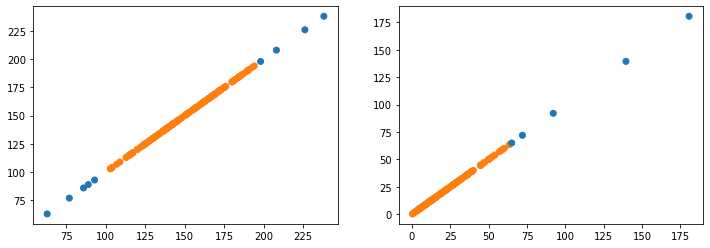

array: 120


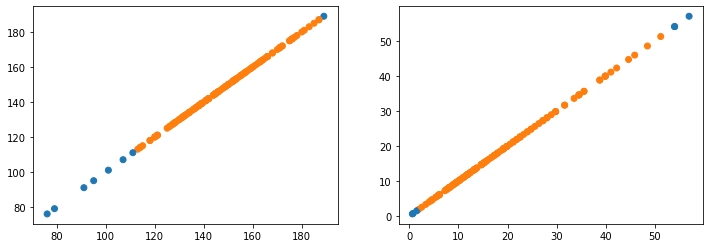

array: 121


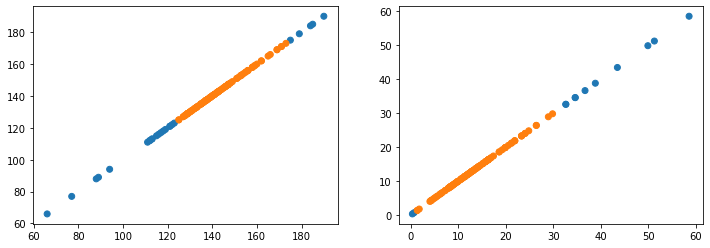

array: 122


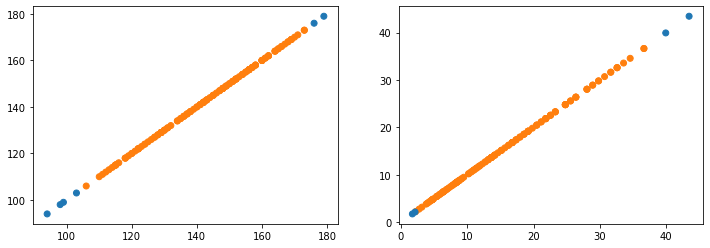

array: 123


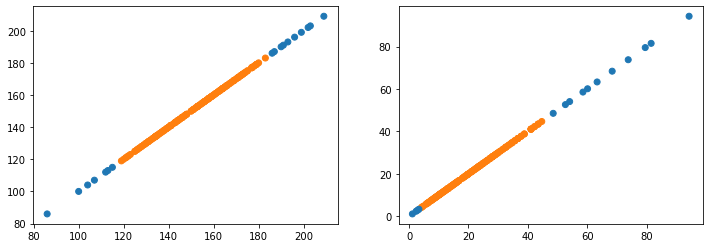

array: 124


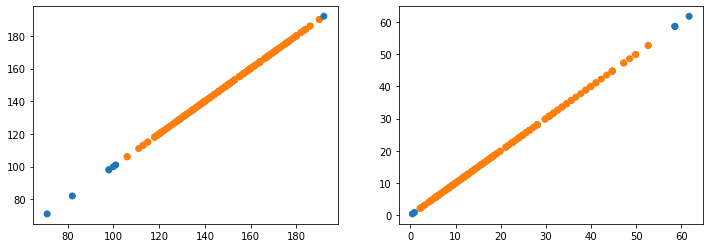

array: 125


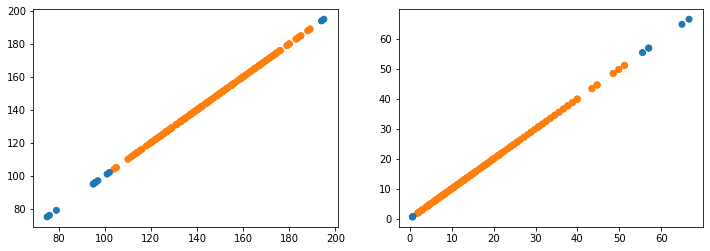

array: 126


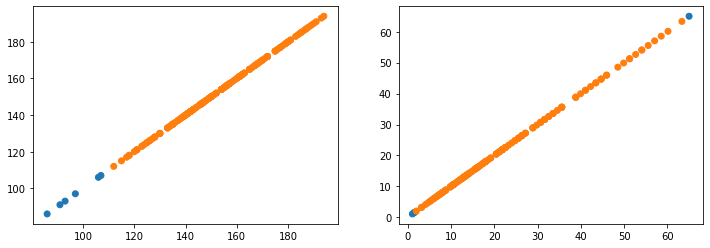

array: 127


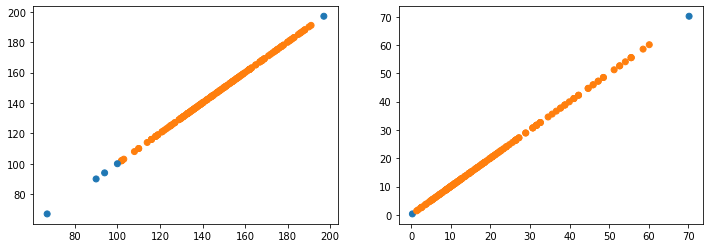

array: 128


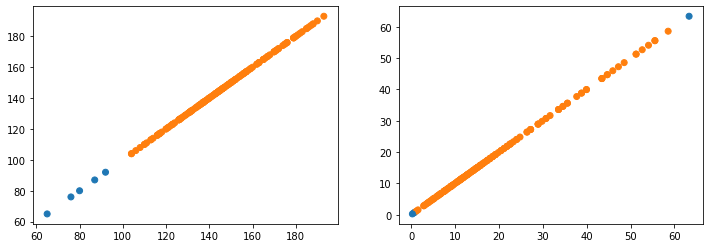

array: 129


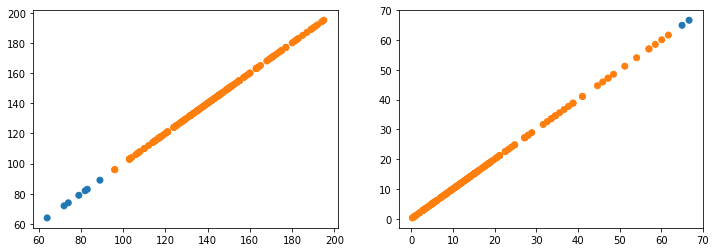

array: 130


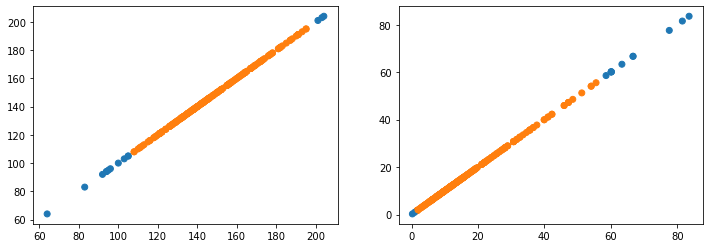

array: 131


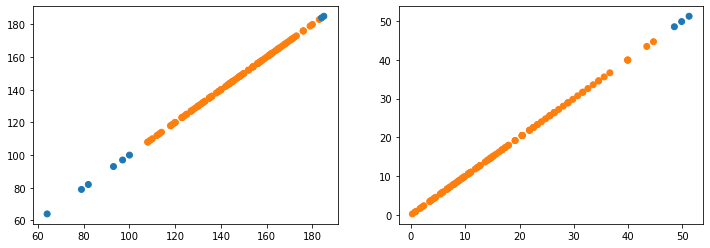

array: 132


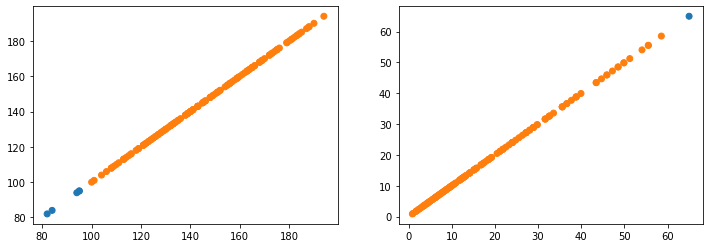

array: 133


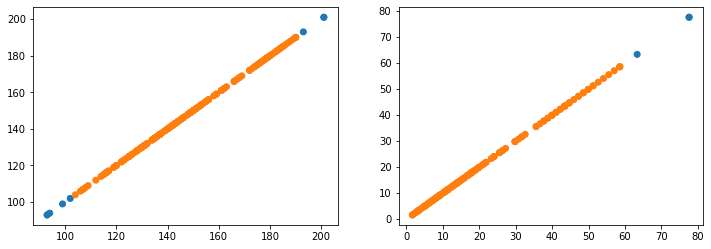

array: 134


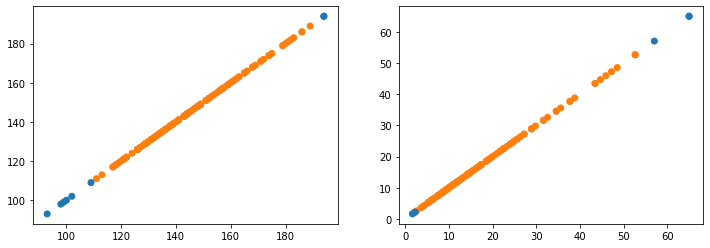

array: 135


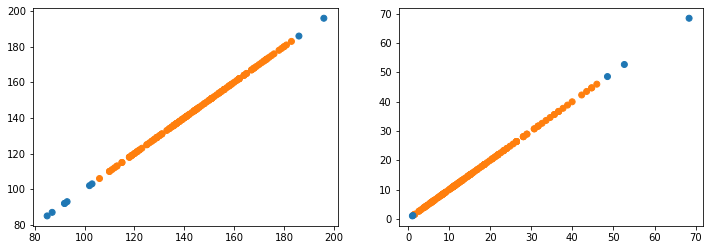

array: 136


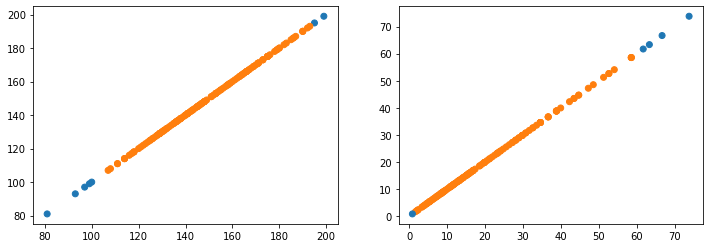

array: 137


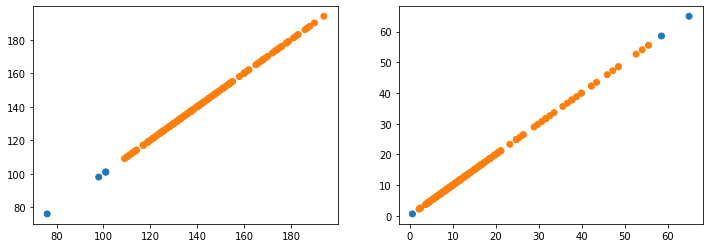

array: 138


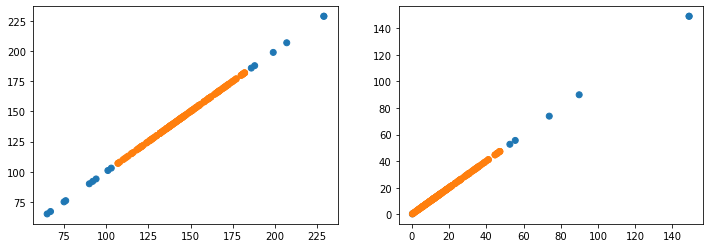

array: 139


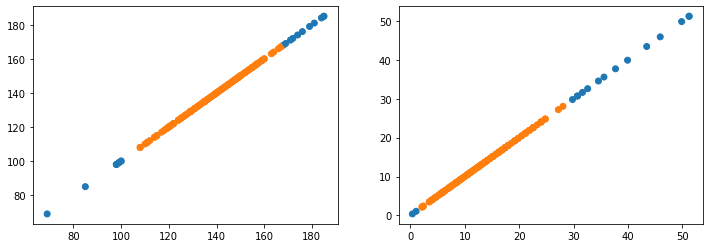

array: 140


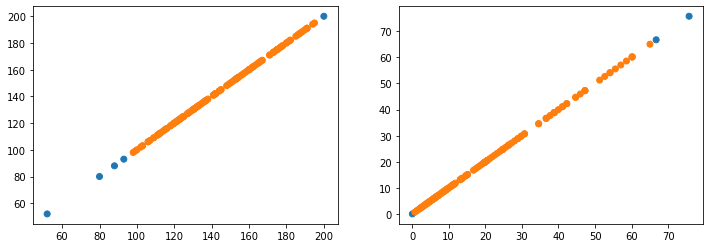

array: 141


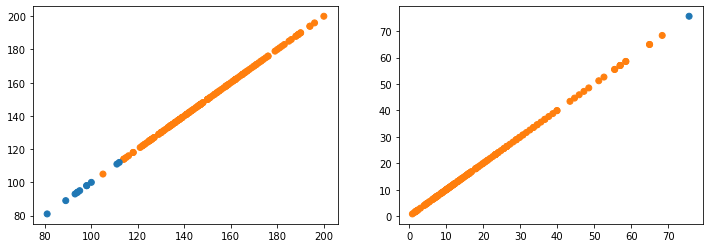

array: 142


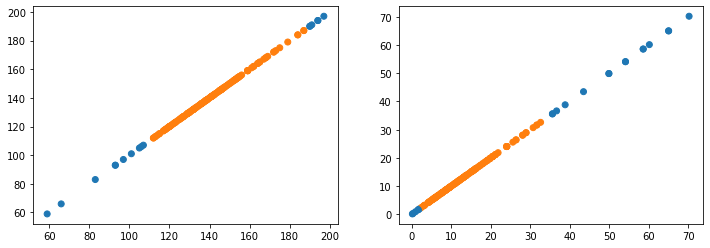

array: 143


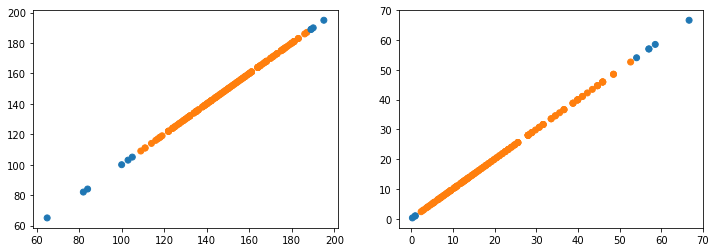

array: 144


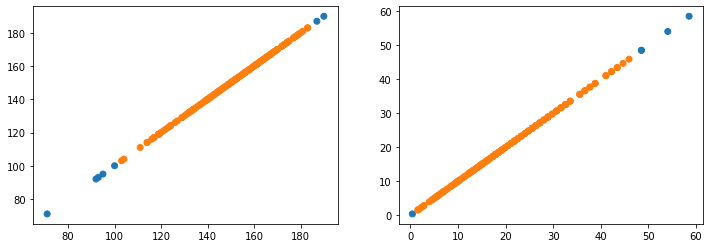

array: 145


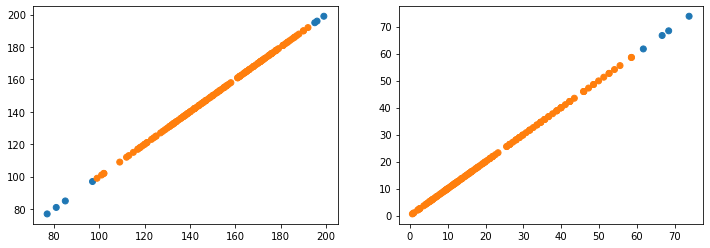

array: 146


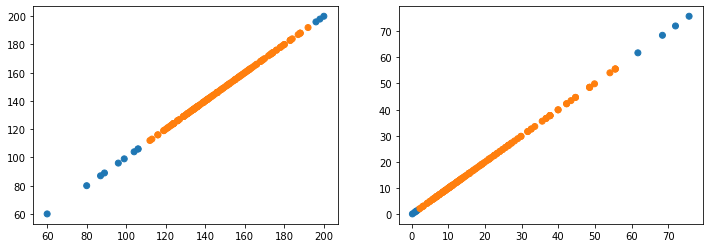

array: 147


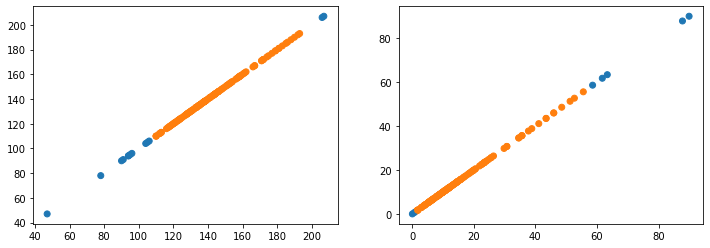

array: 148


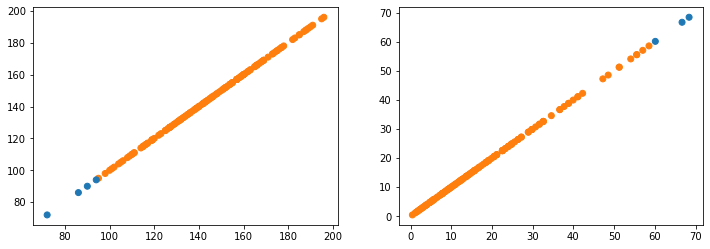

array: 149


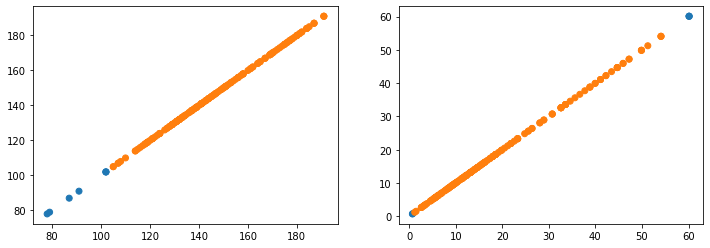

array: 150


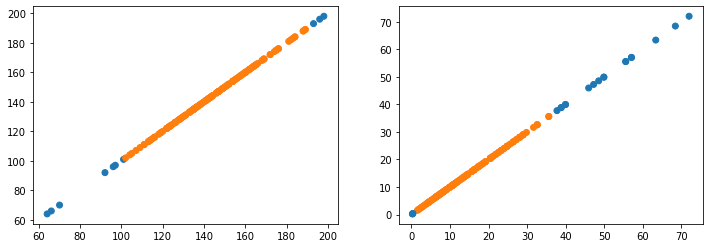

array: 151


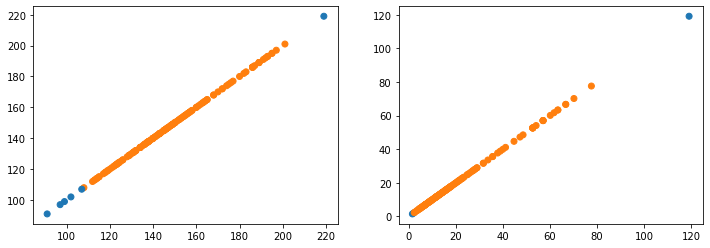

array: 152


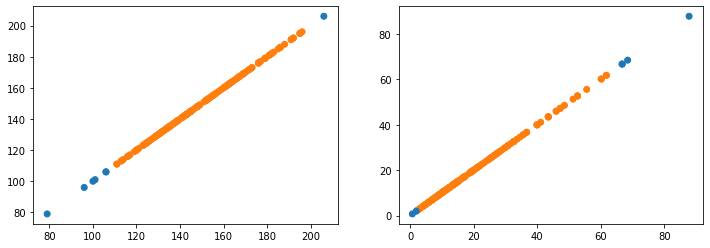

array: 153


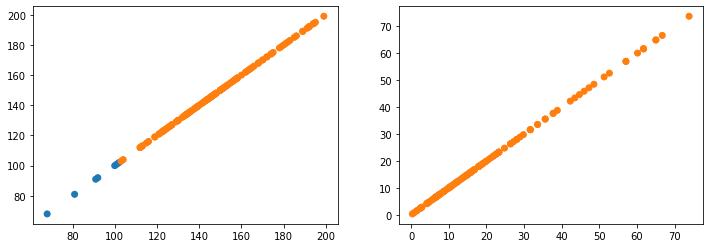

array: 154


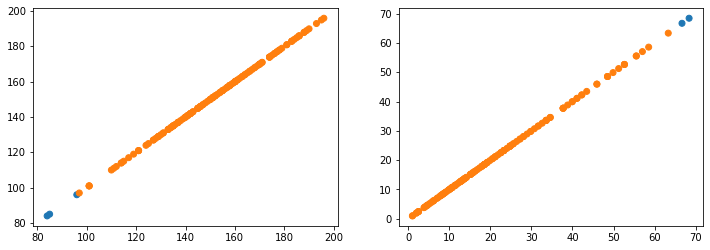

array: 155


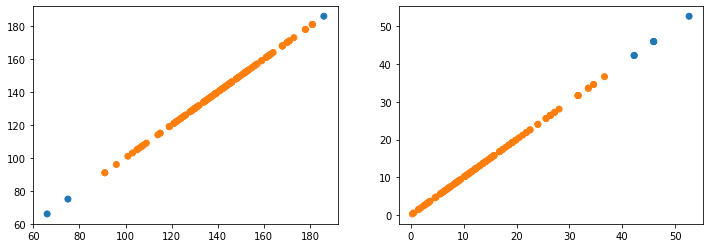

array: 156


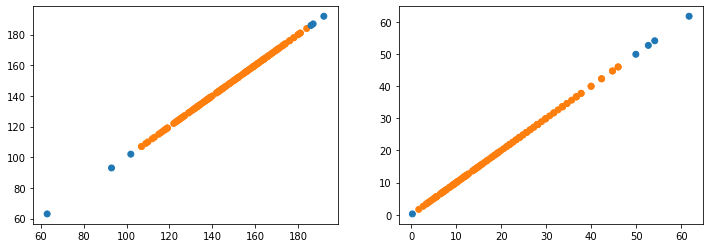

array: 157


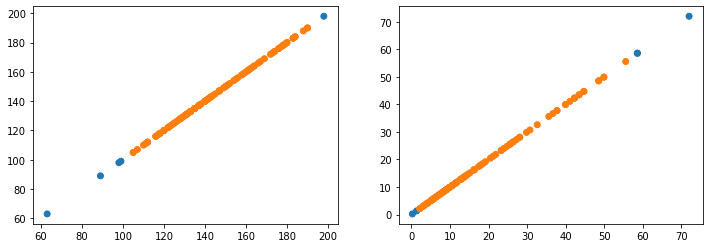

array: 158


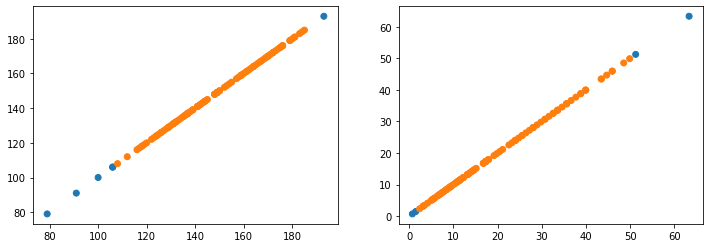

array: 159


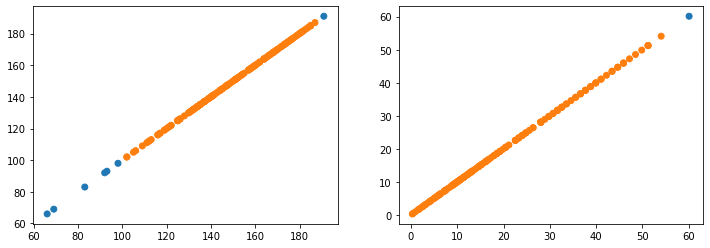

array: 160


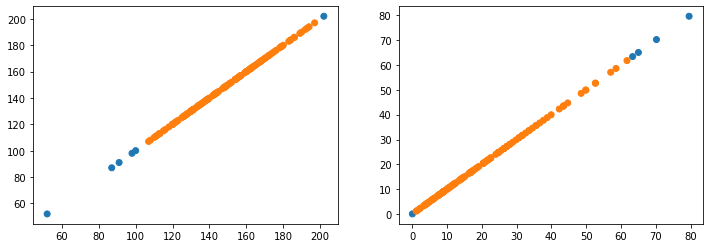

array: 161


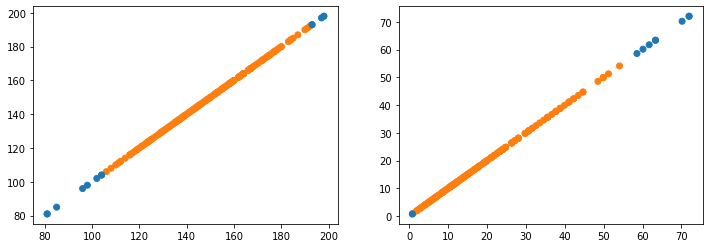

array: 162


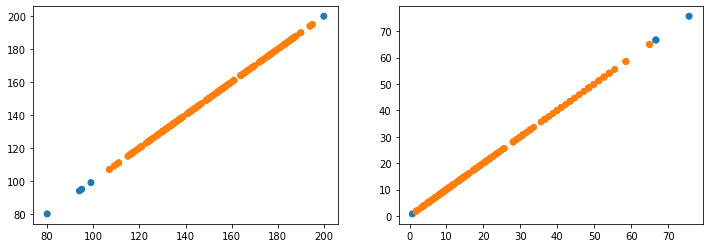

array: 163


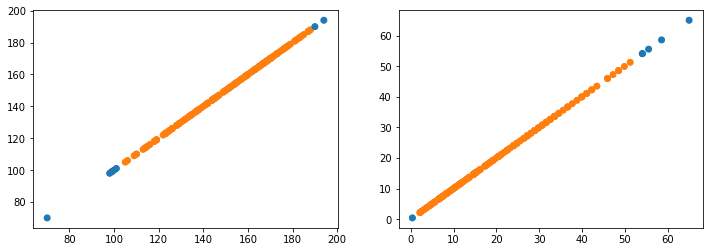

array: 164


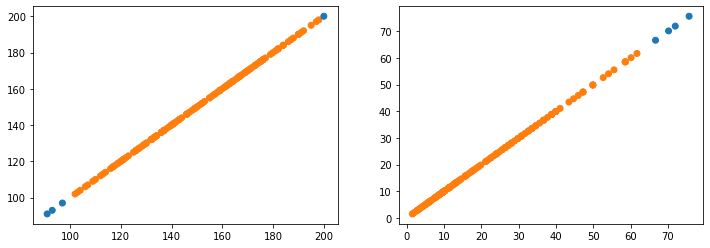

array: 165


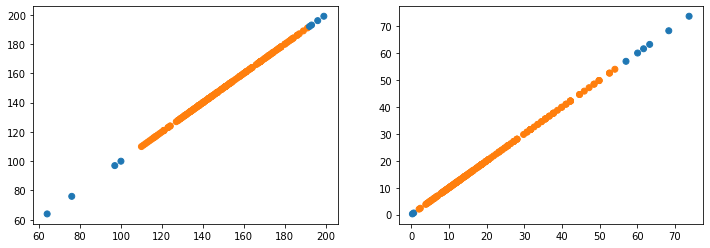

array: 166


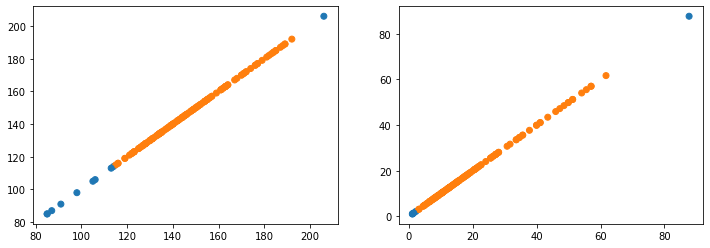

array: 167


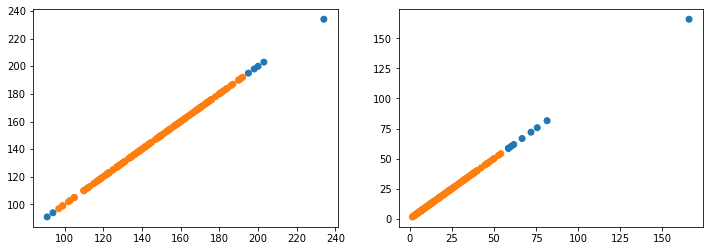

array: 168


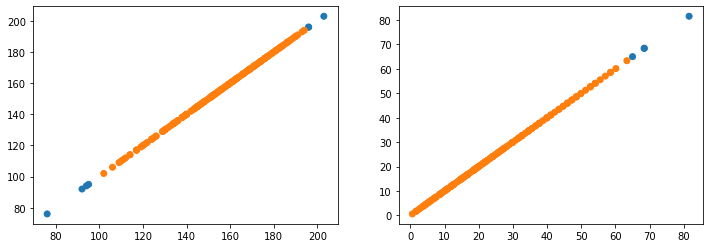

array: 169


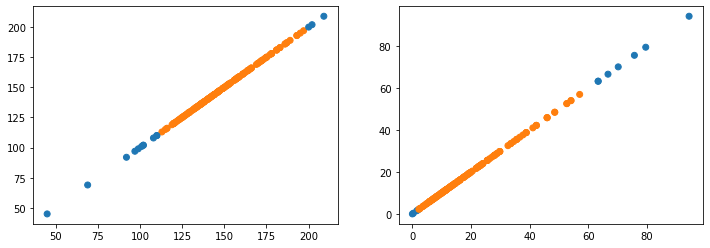

array: 170


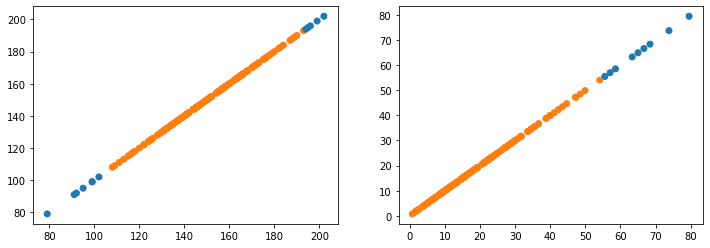

array: 171


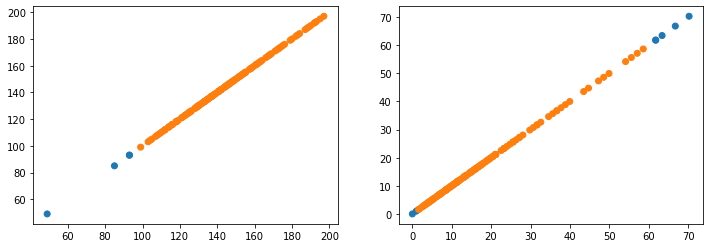

array: 172


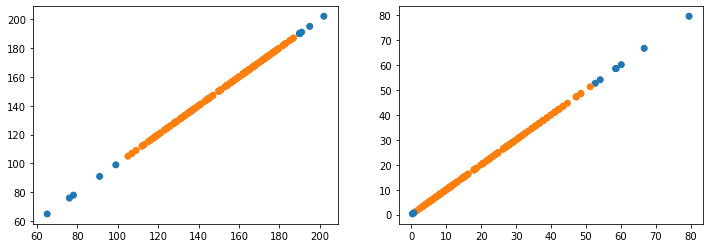

array: 173


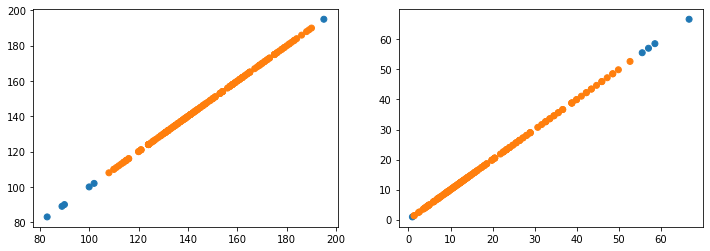

array: 174


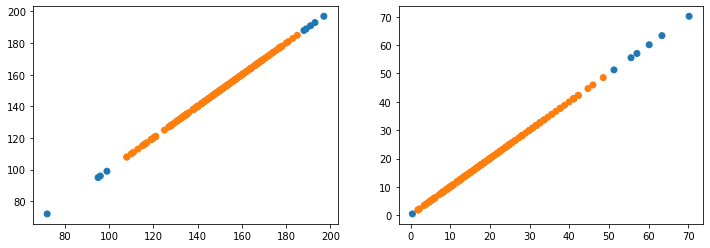

array: 175


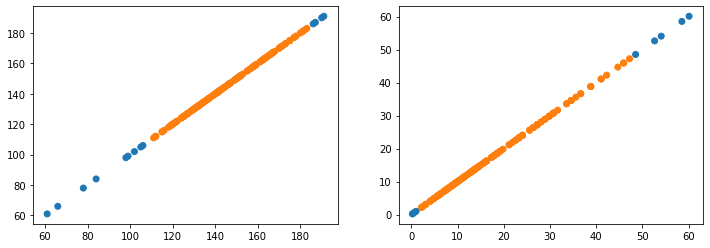

array: 176


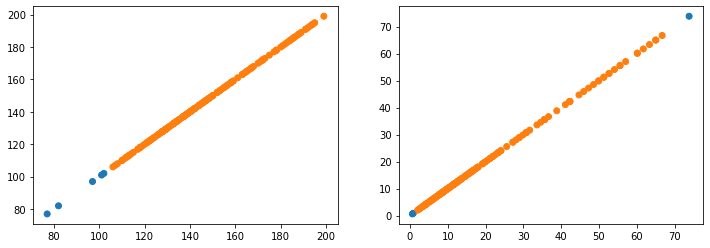

array: 177


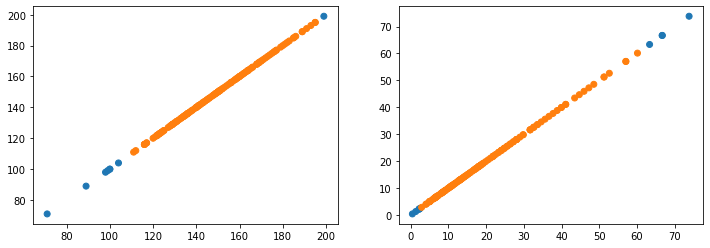

array: 178


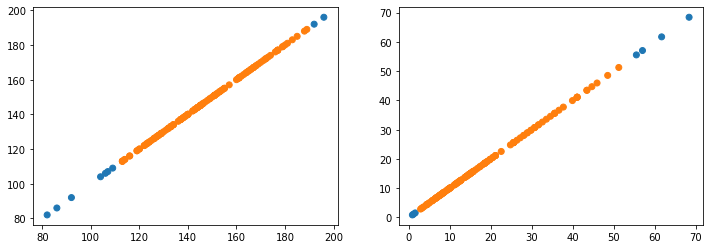

array: 179


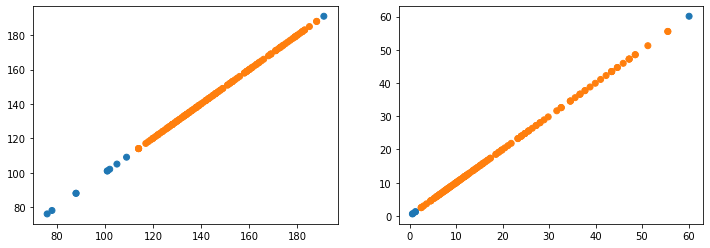

array: 180


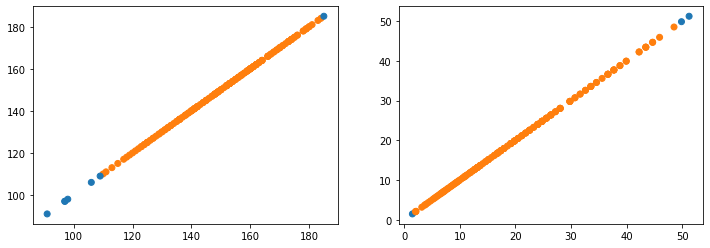

array: 181


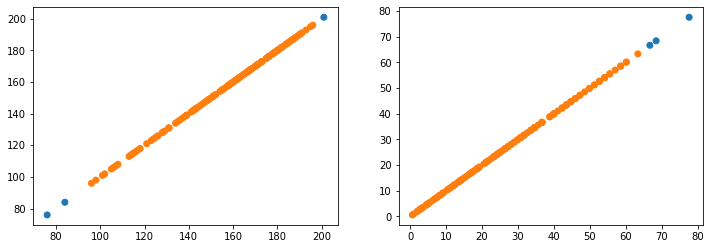

array: 182


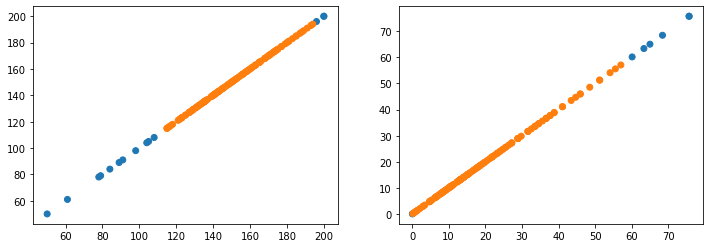

array: 183


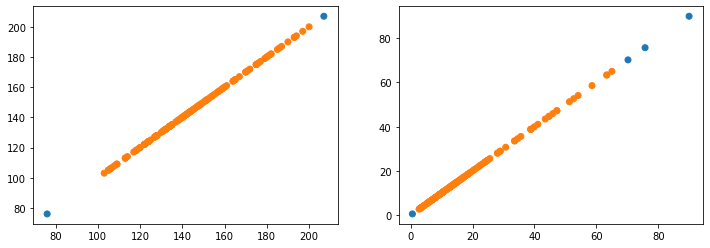

array: 184


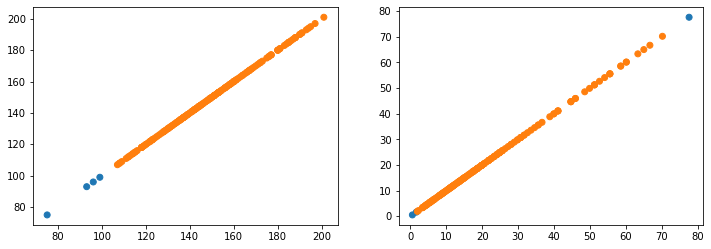

array: 185


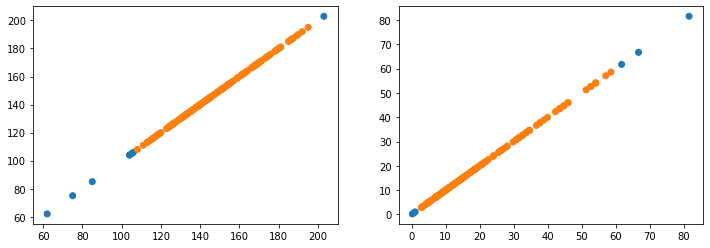

array: 186


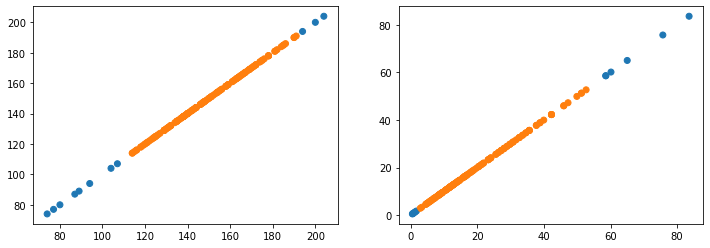

array: 187


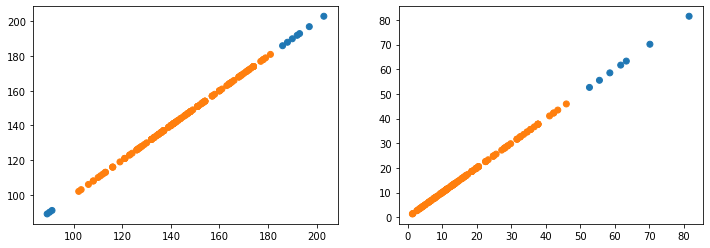

array: 188


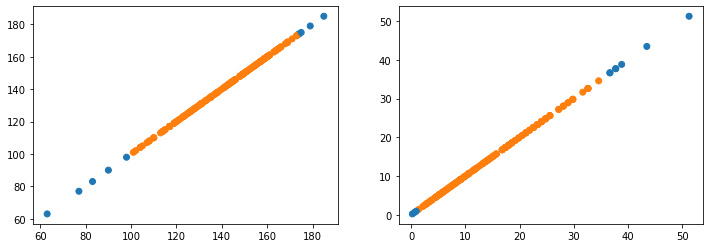

array: 189


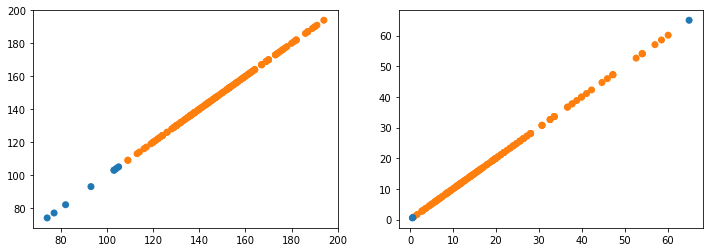

array: 190


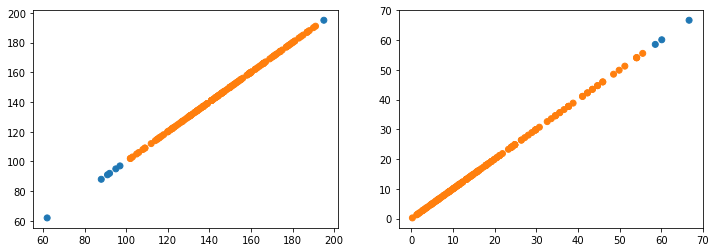

array: 191


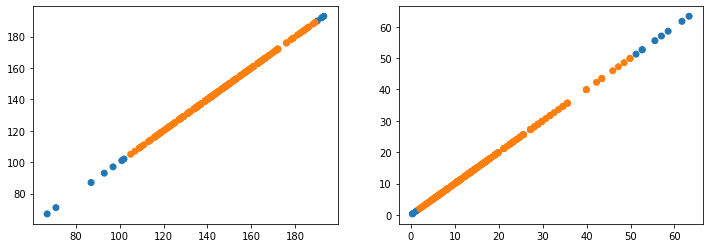

array: 192


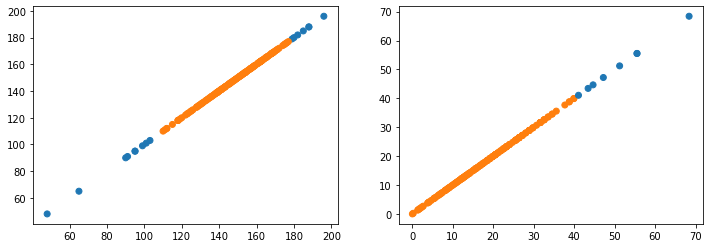

array: 193


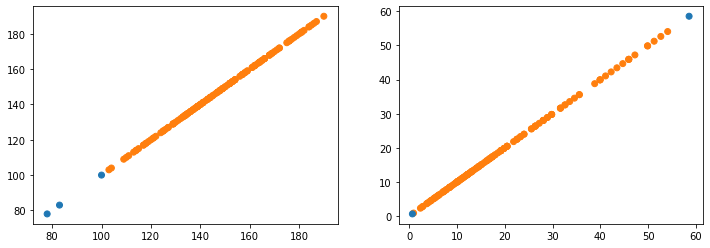

array: 194


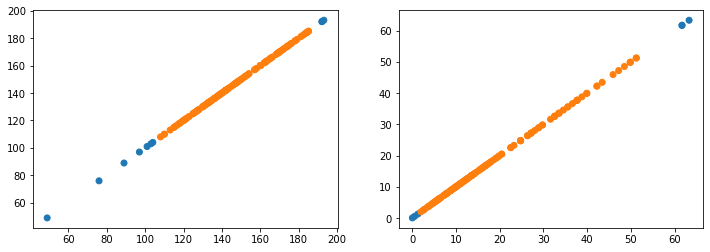

array: 195


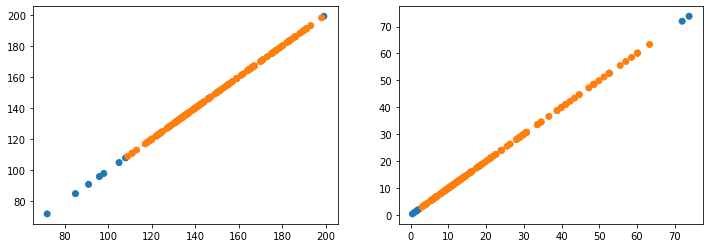

array: 196


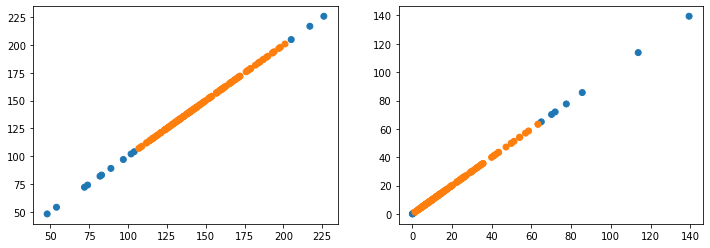

array: 197


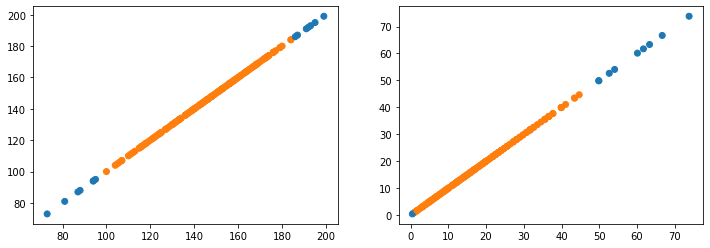

array: 198


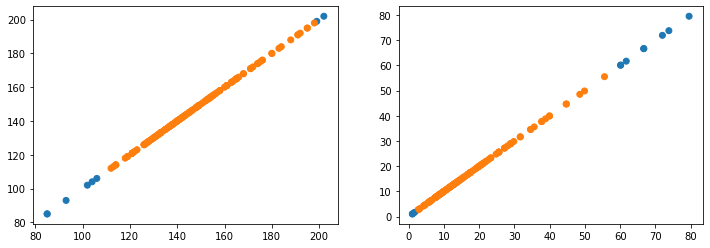

array: 199


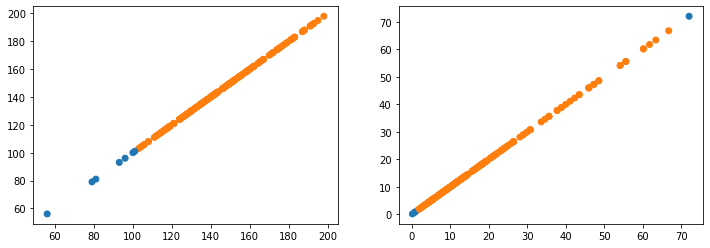

array: 200


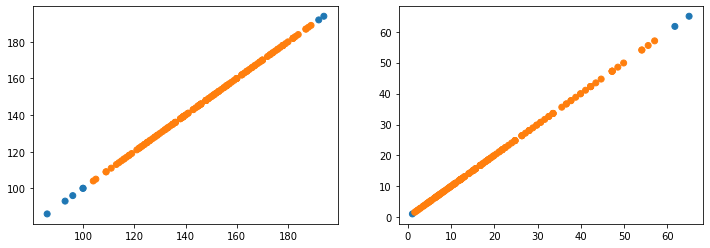

array: 201


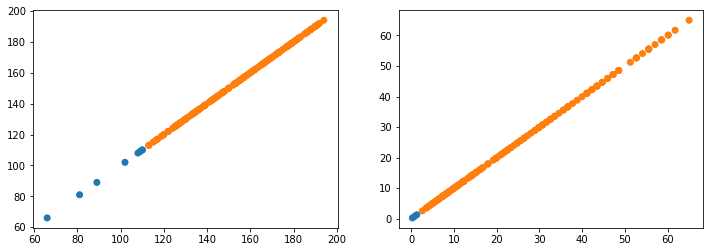

array: 202


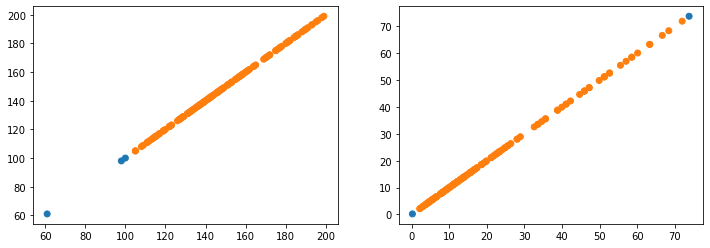

array: 203


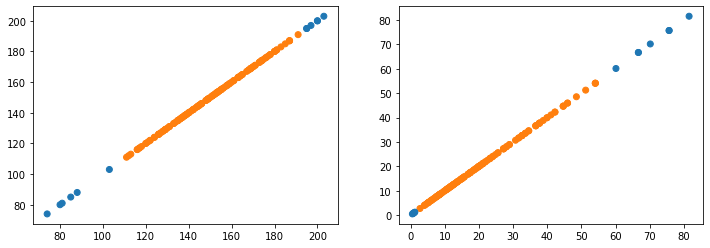

array: 204


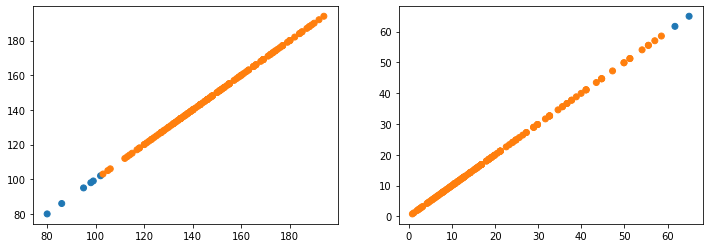

array: 205


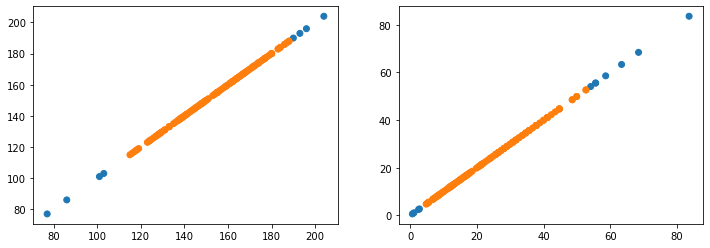

array: 206


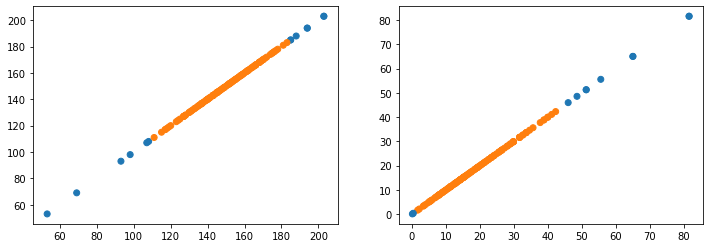

array: 207


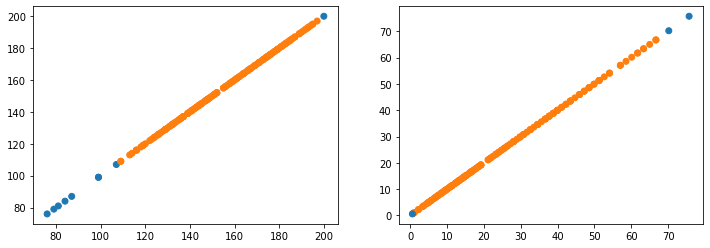

array: 208


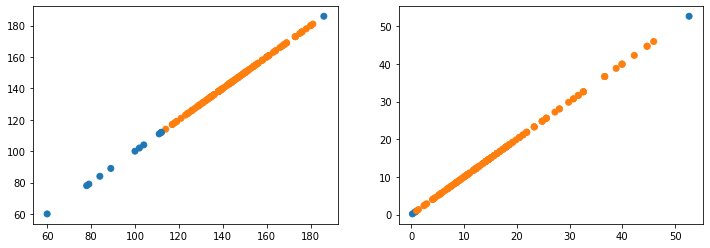

array: 209


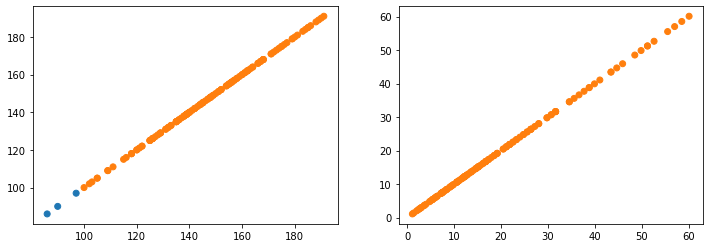

array: 210


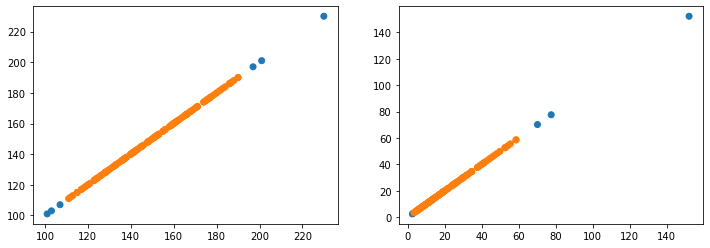

array: 211


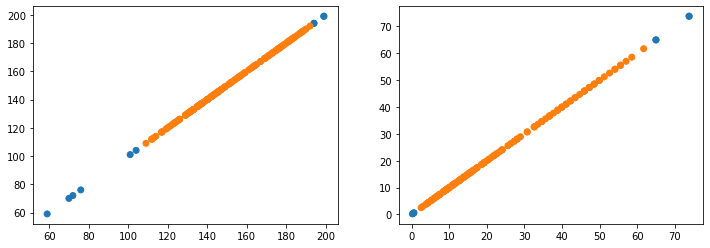

array: 212


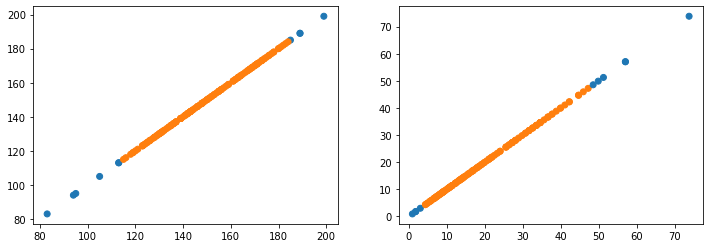

array: 213


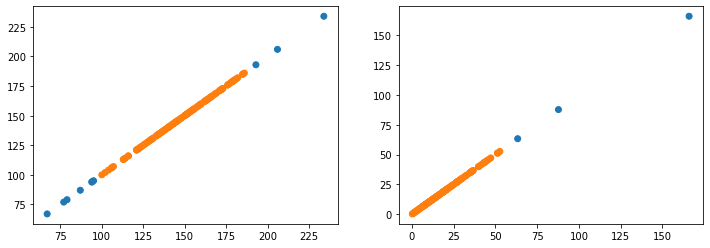

array: 214


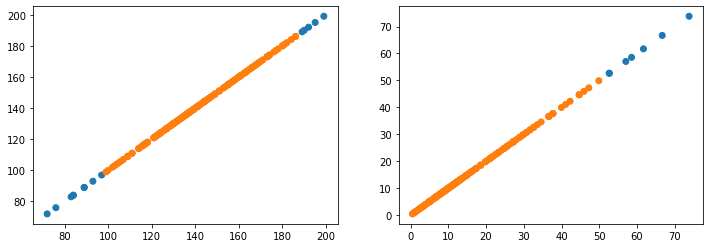

array: 215


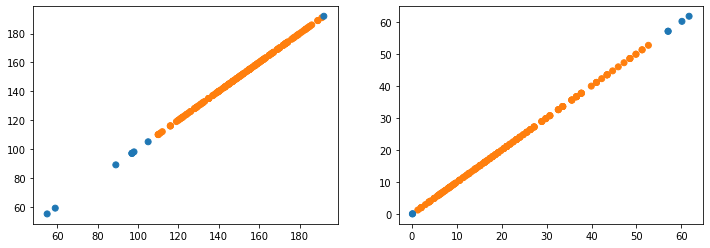

array: 216


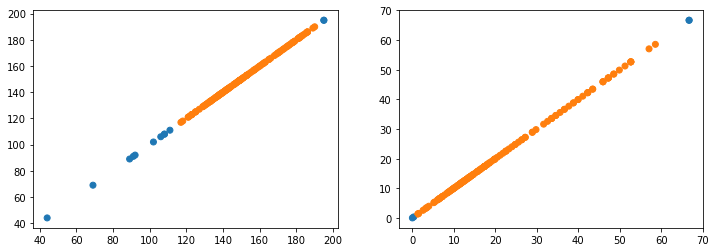

array: 217


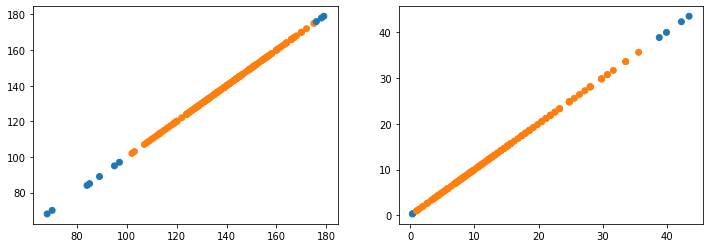

array: 218


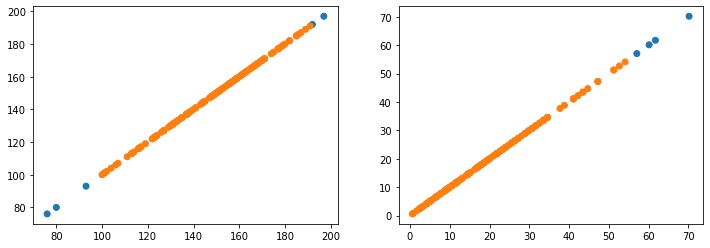

array: 219


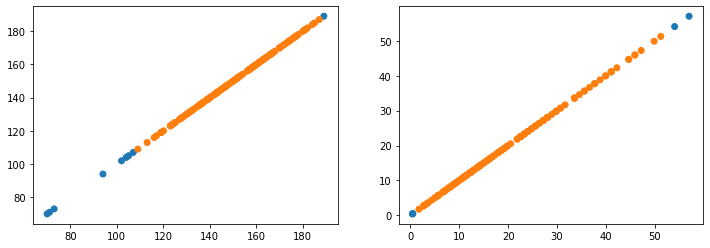

array: 220


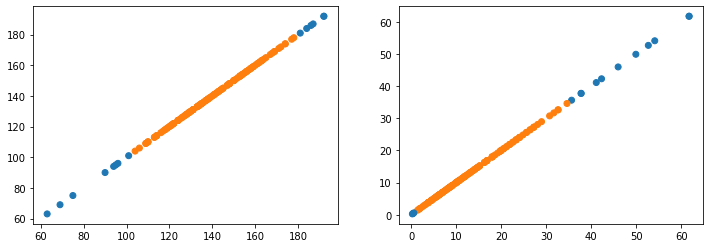

array: 221


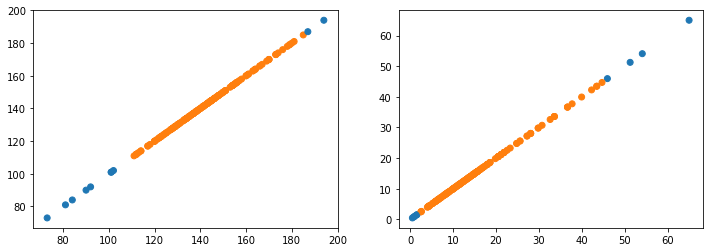

array: 222


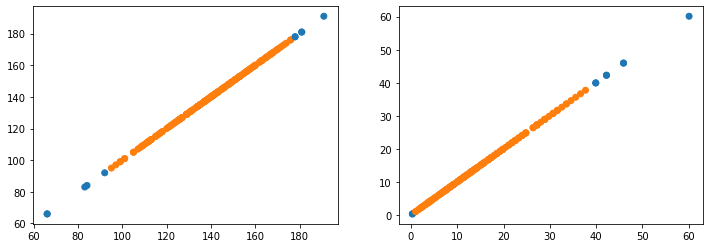

array: 223


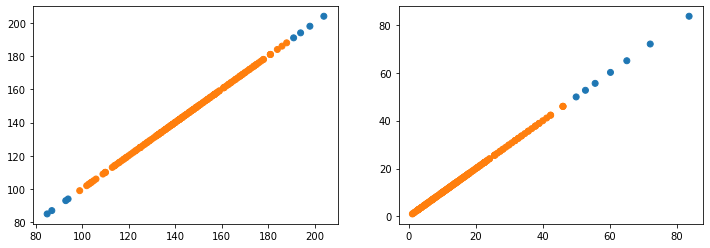

array: 224


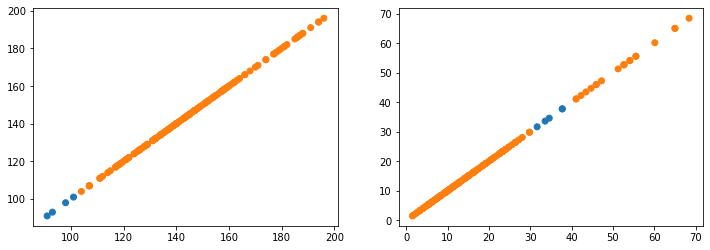

array: 225


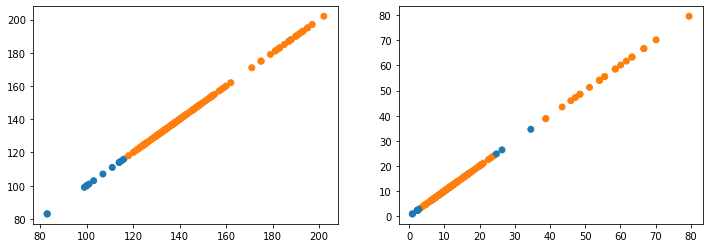

array: 226


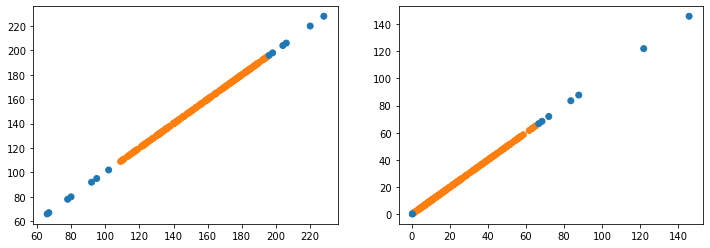

array: 227


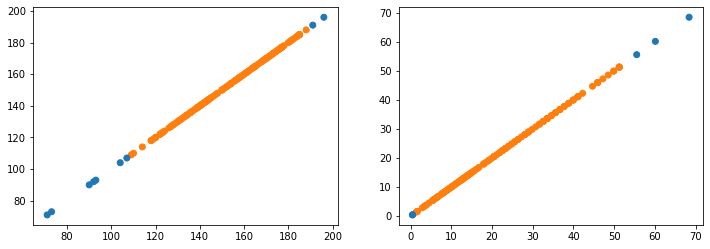

array: 228


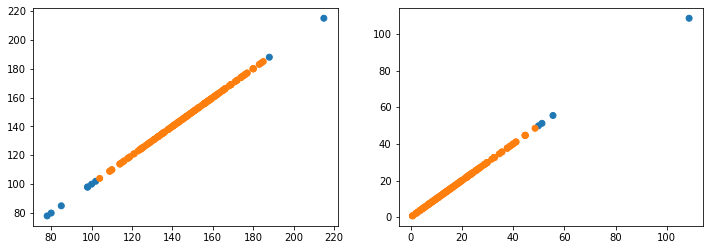

array: 229


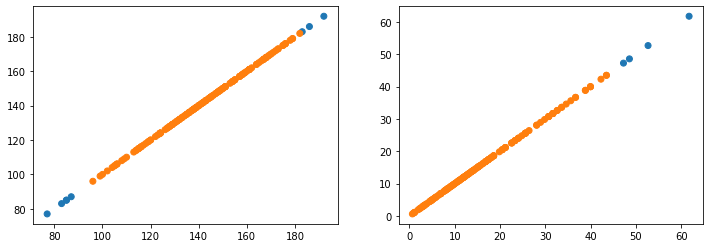

array: 230


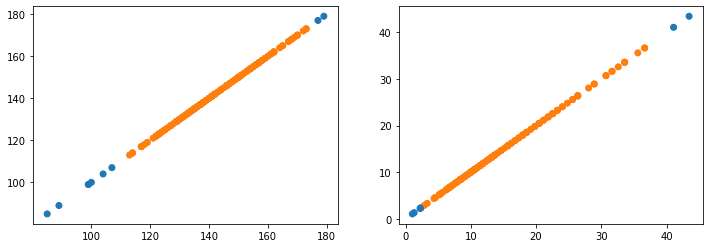

array: 231


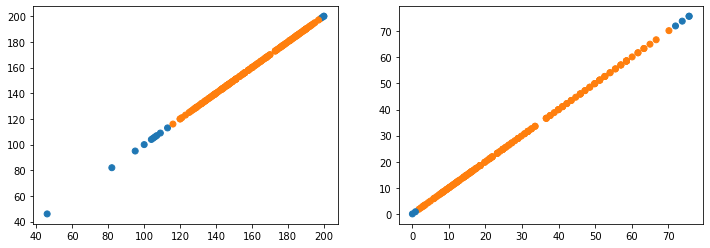

array: 232


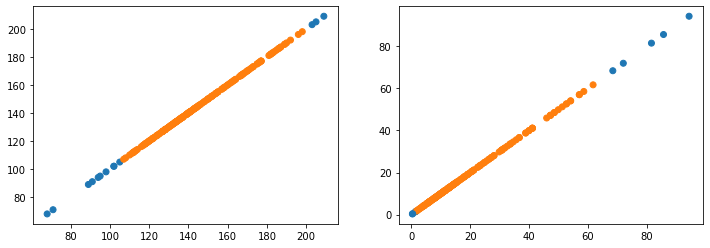

array: 233


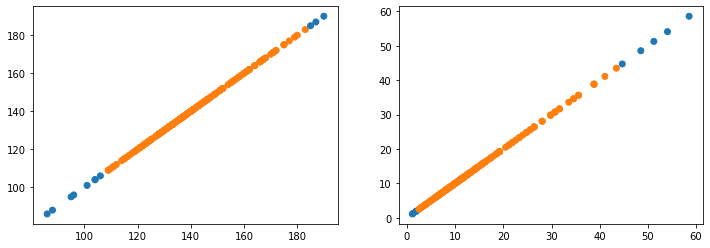

array: 234


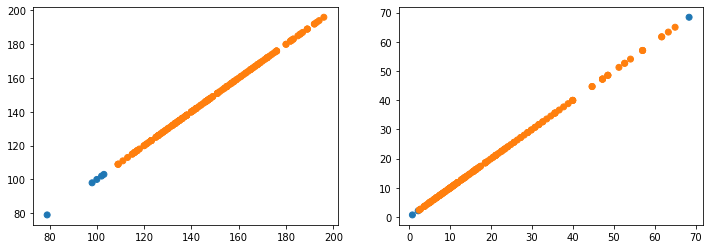

array: 235


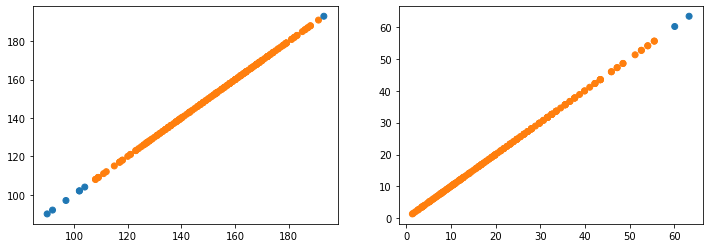

In [269]:
check_outliers(array_lof, array_lof_gamma)

array: 0


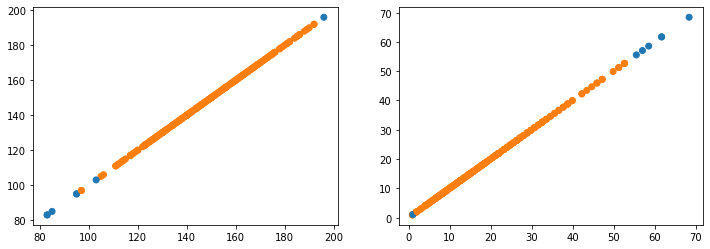

array: 1


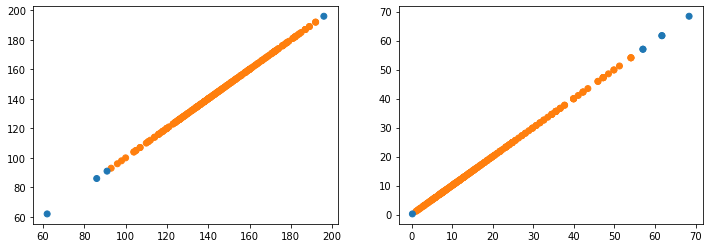

array: 2


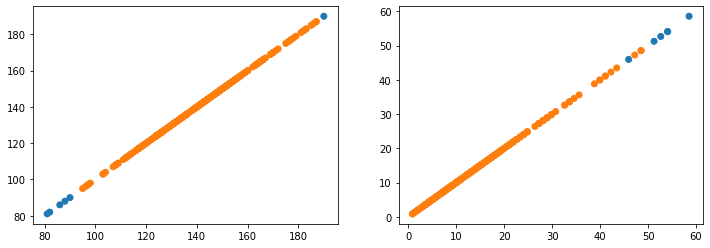

array: 3


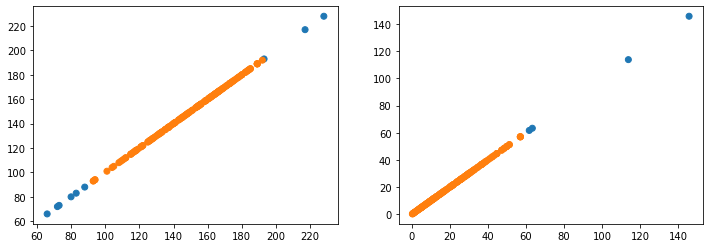

array: 4


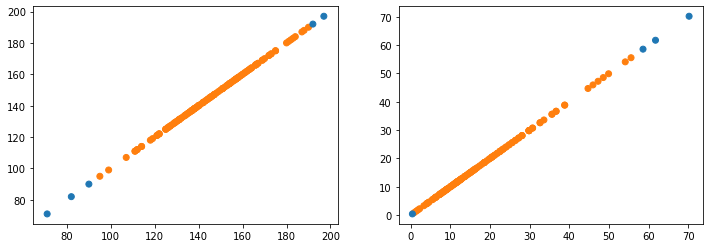

array: 5


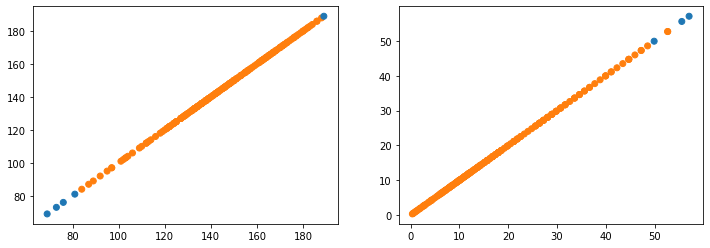

array: 6


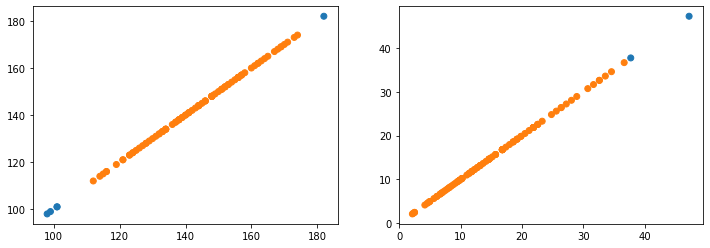

array: 7


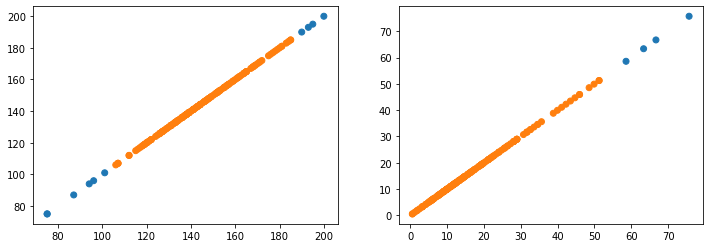

array: 8


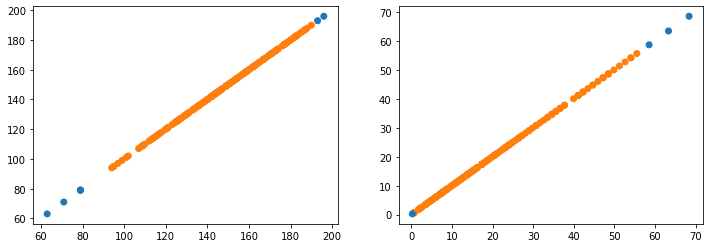

array: 9


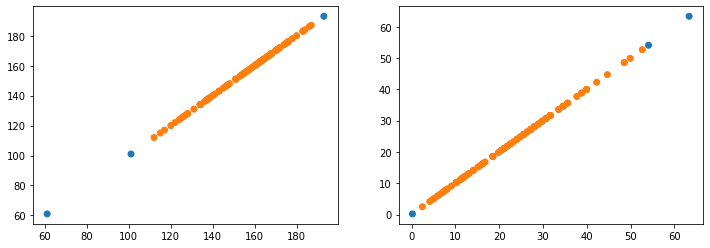

array: 10


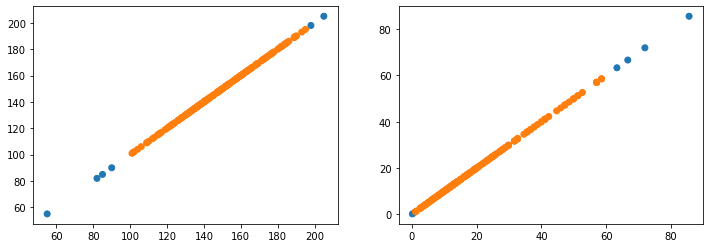

array: 11


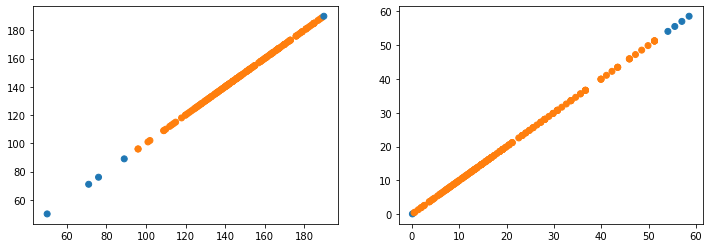

array: 12


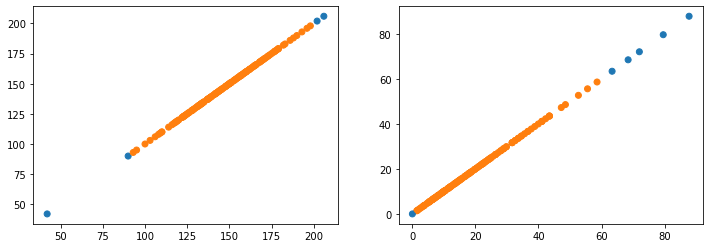

array: 13


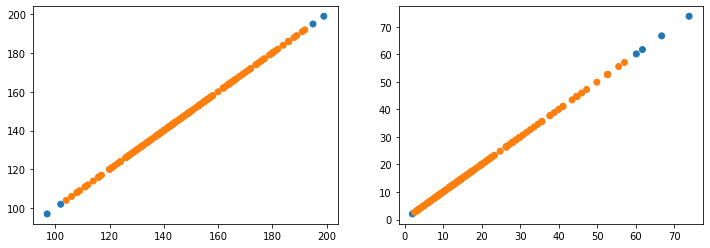

array: 14


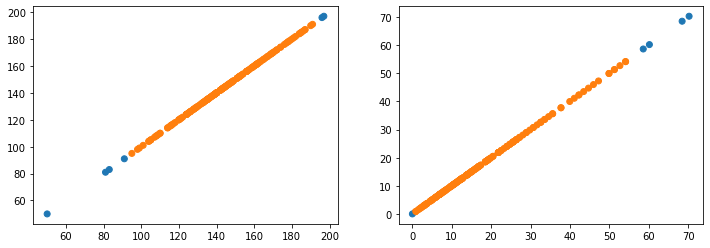

array: 15


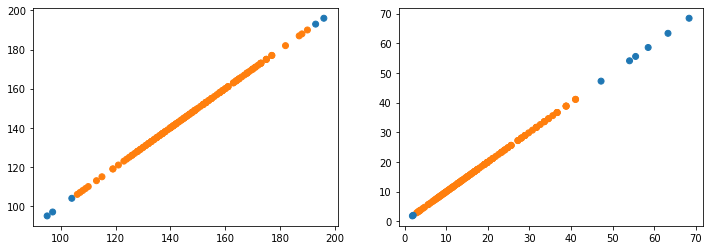

array: 16


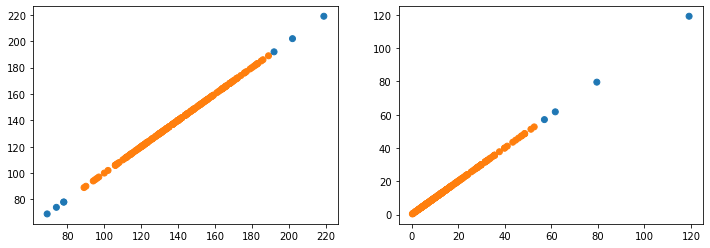

array: 17


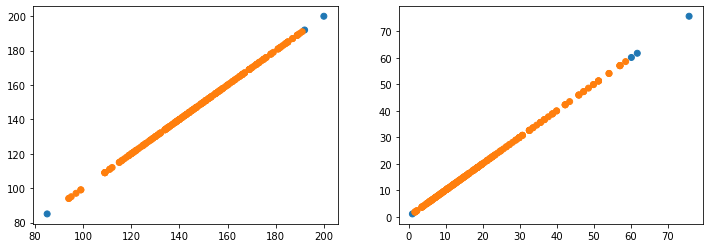

array: 18


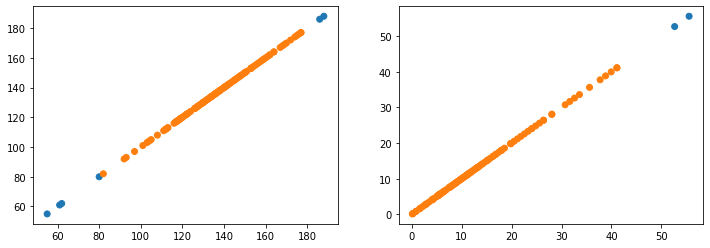

array: 19


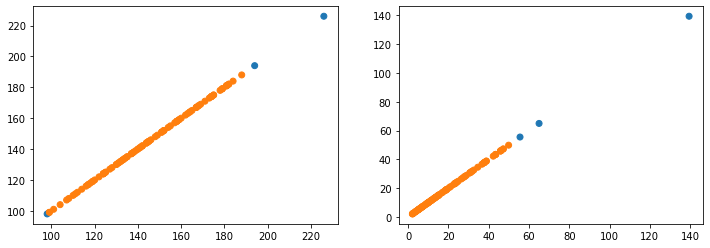

array: 20


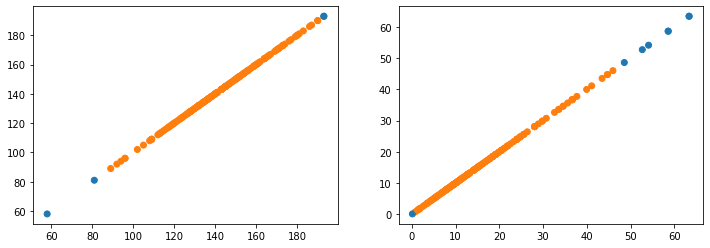

array: 21


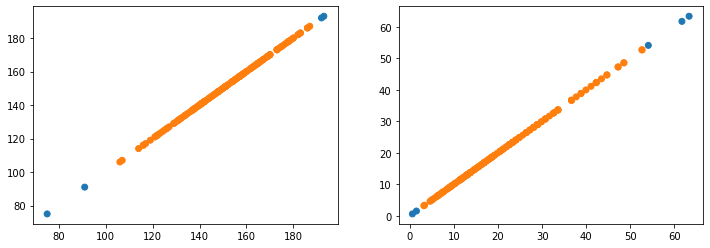

array: 22


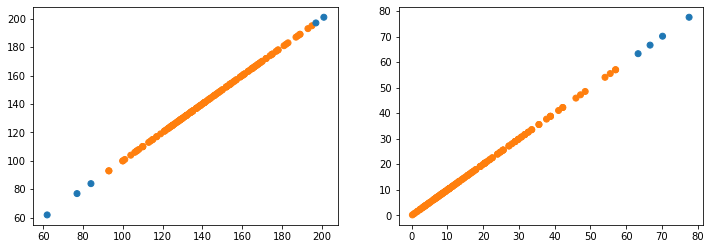

array: 23


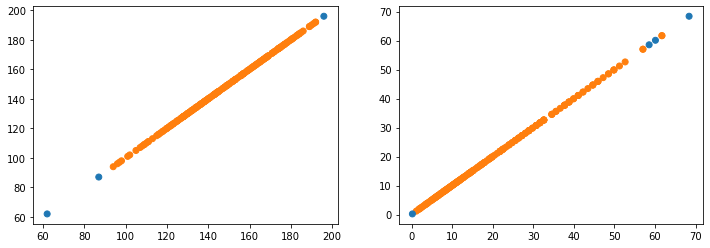

array: 24


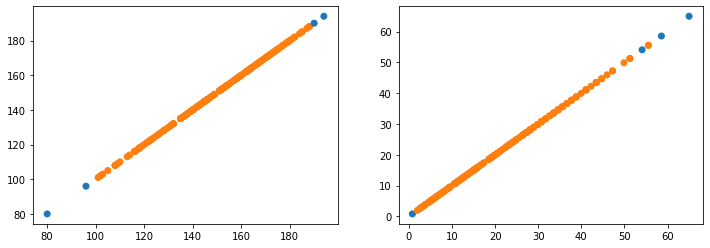

array: 25


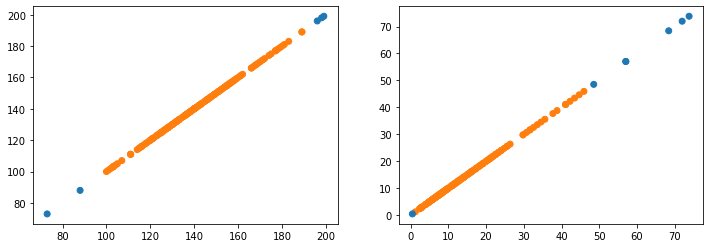

array: 26


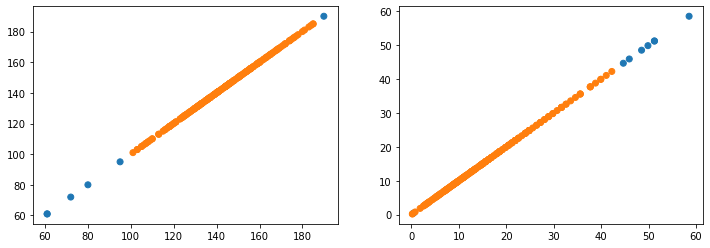

array: 27


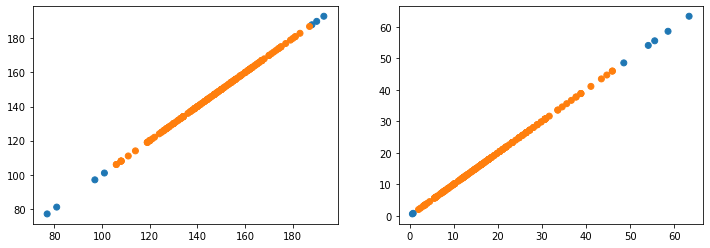

array: 28


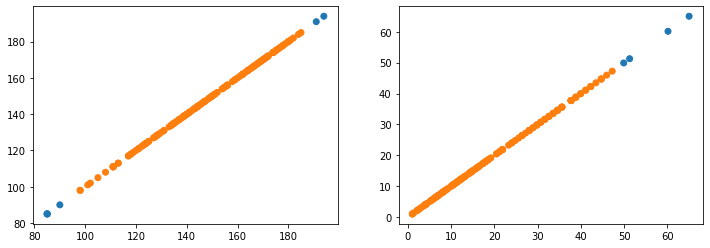

array: 29


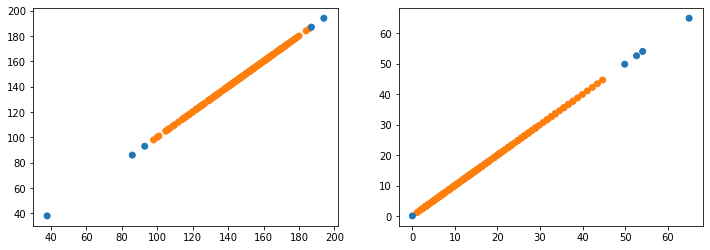

array: 30


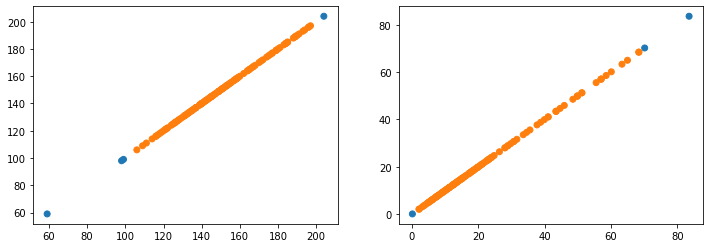

array: 31


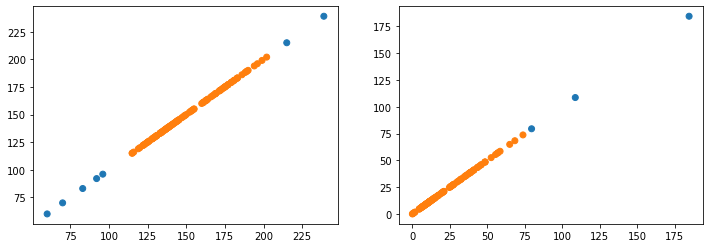

array: 32


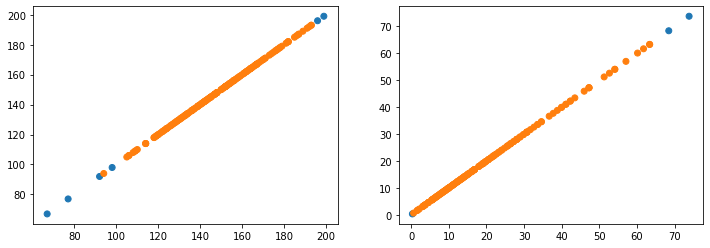

array: 33


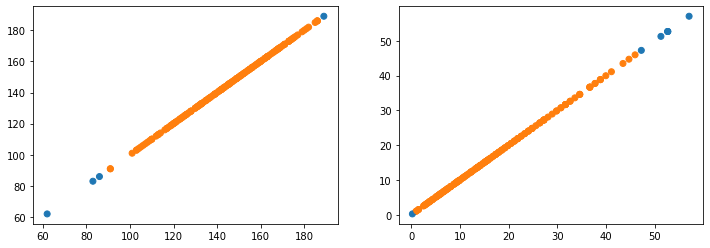

array: 34


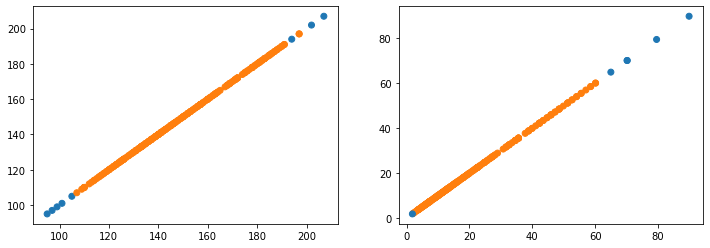

array: 35


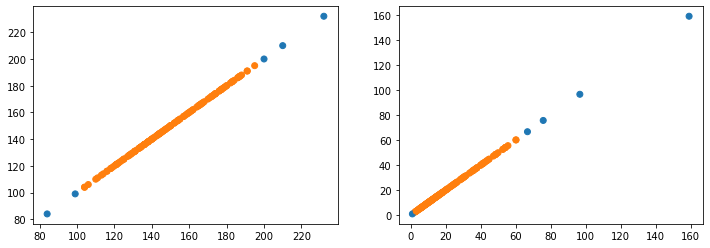

array: 36


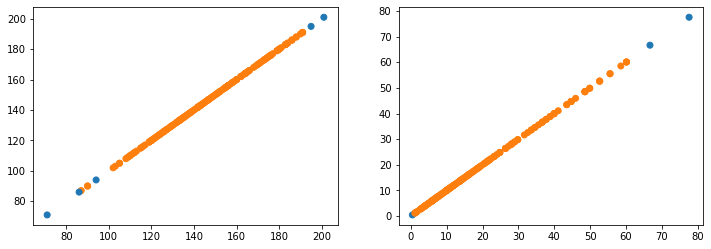

array: 37


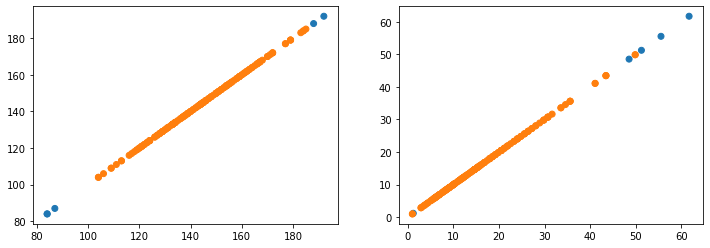

array: 38


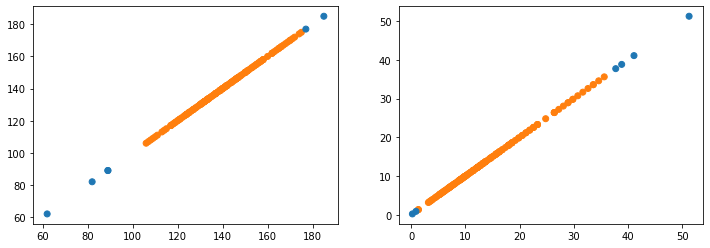

array: 39


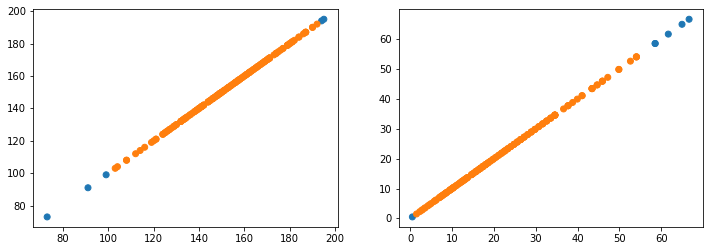

array: 40


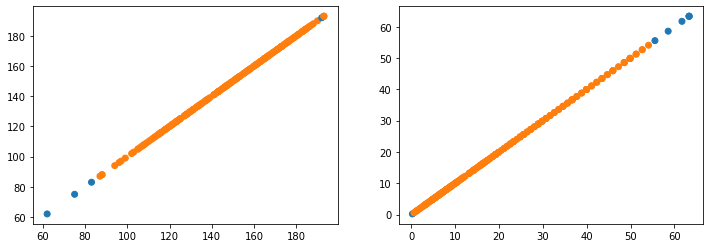

array: 41


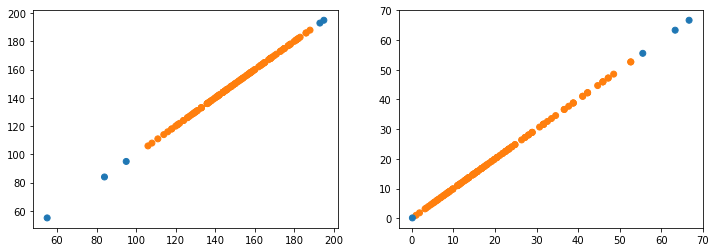

array: 42


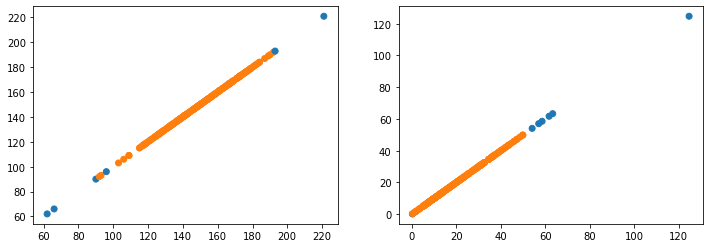

array: 43


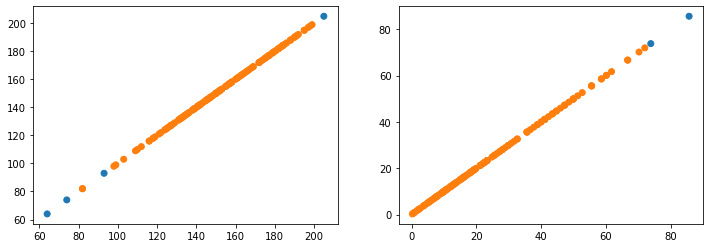

array: 44


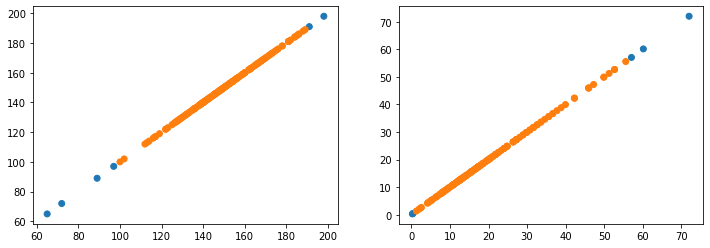

array: 45


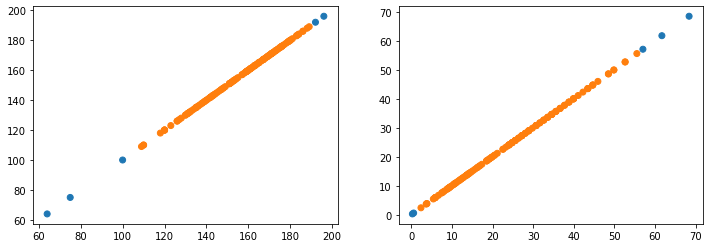

array: 46


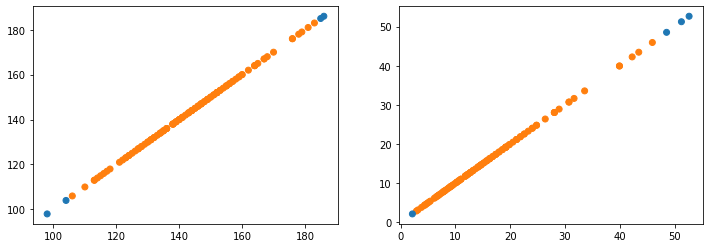

array: 47


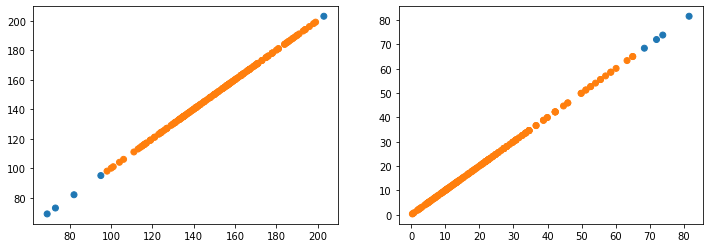

array: 48


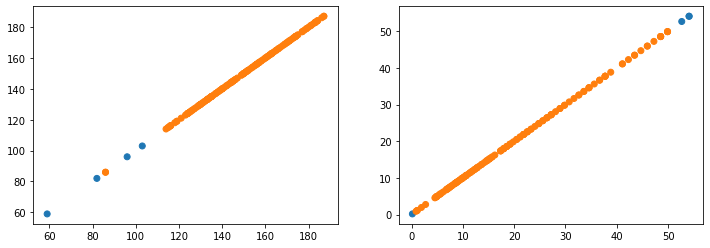

array: 49


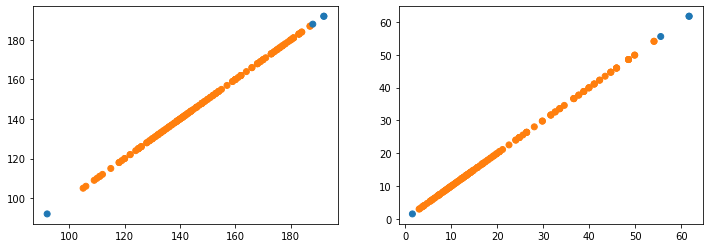

array: 50


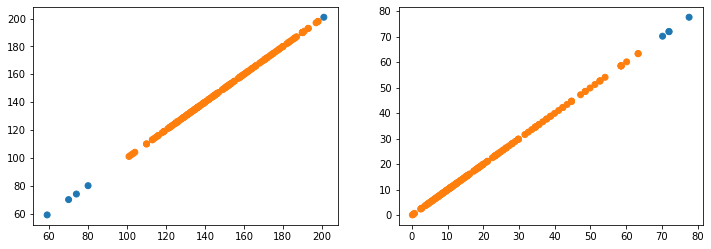

array: 51


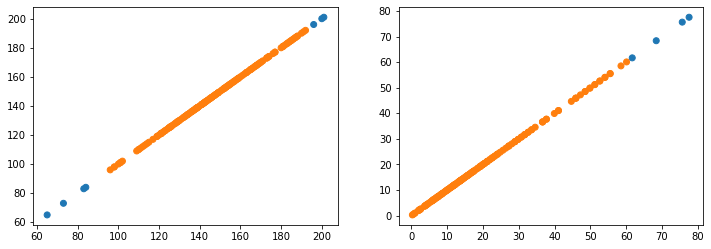

array: 52


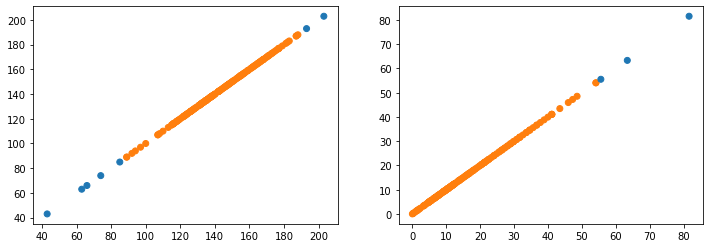

array: 53


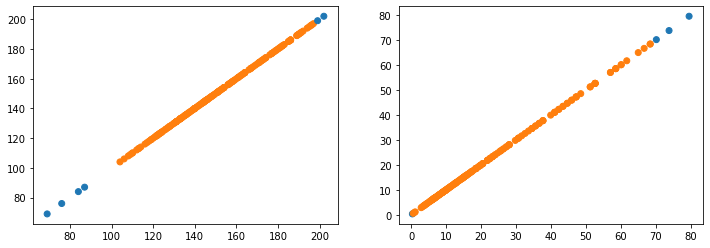

array: 54


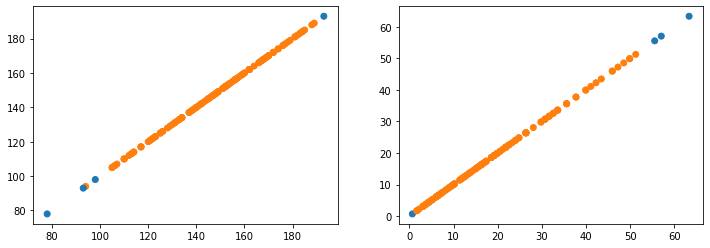

array: 55


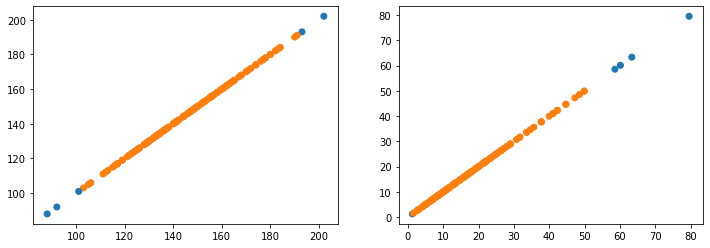

array: 56


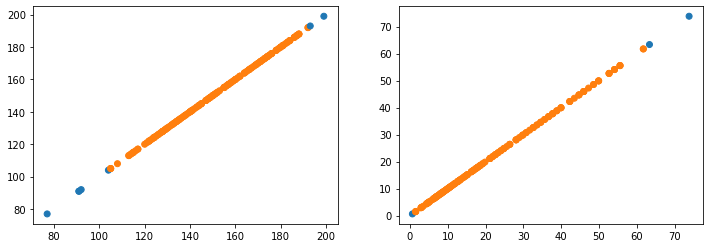

array: 57


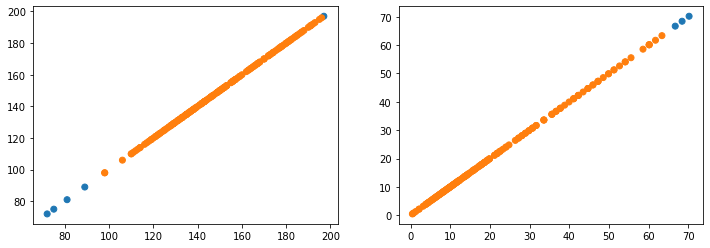

array: 58


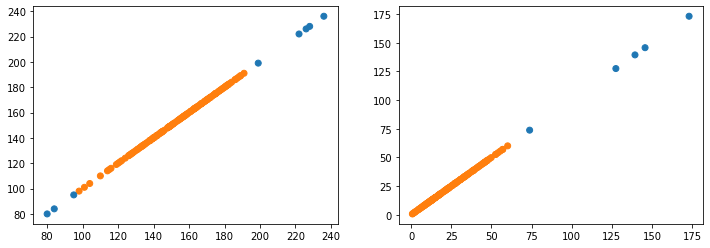

array: 59


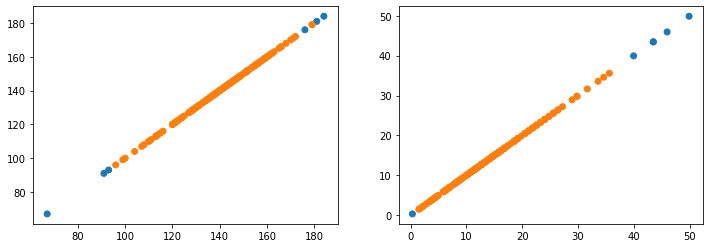

array: 60


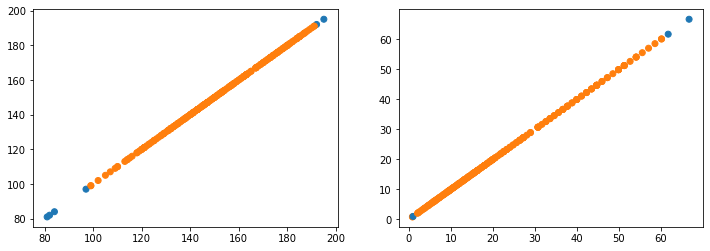

array: 61


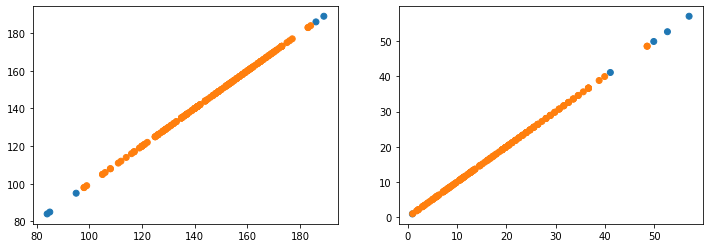

array: 62


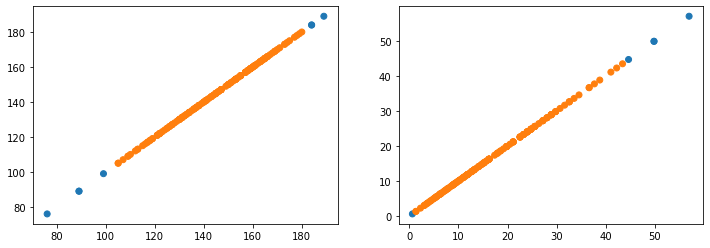

array: 63


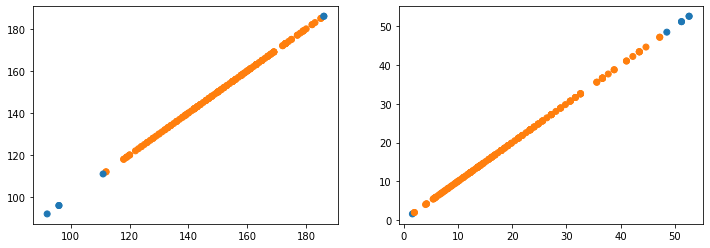

array: 64


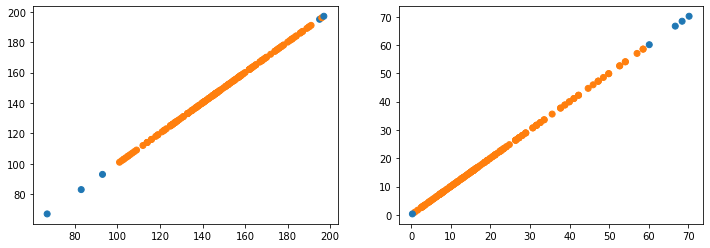

array: 65


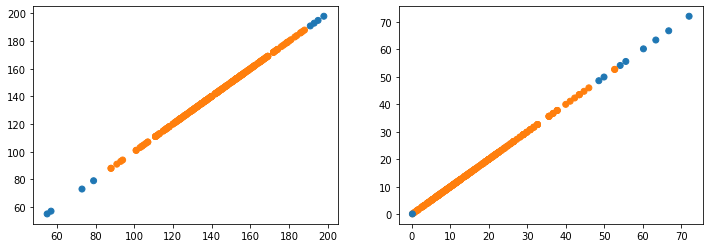

array: 66


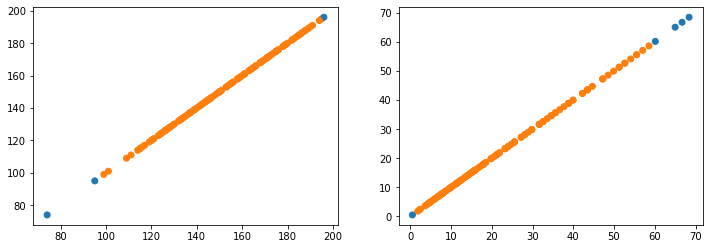

array: 67


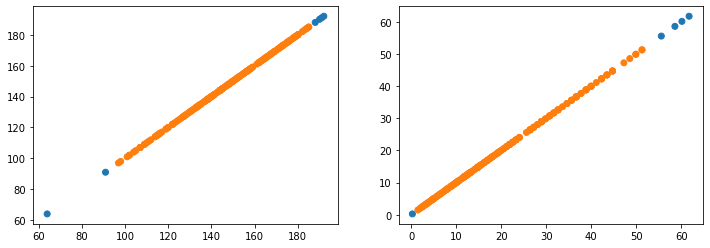

array: 68


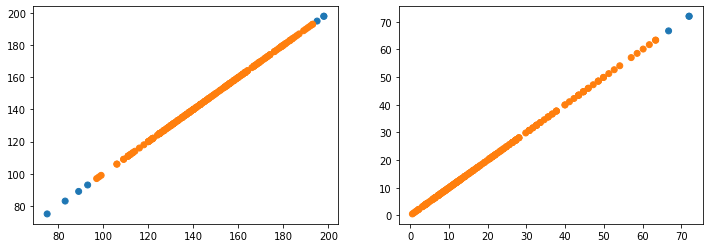

array: 69


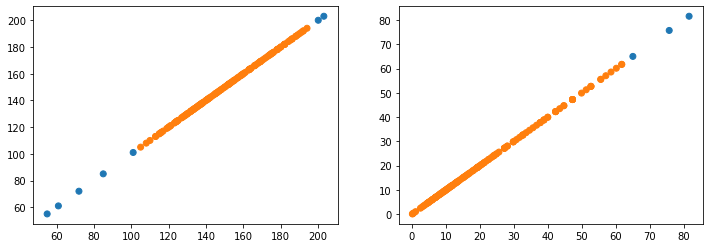

array: 70


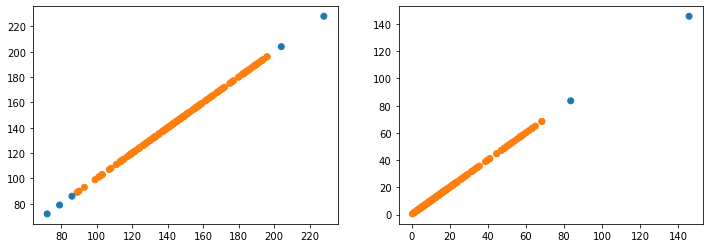

array: 71


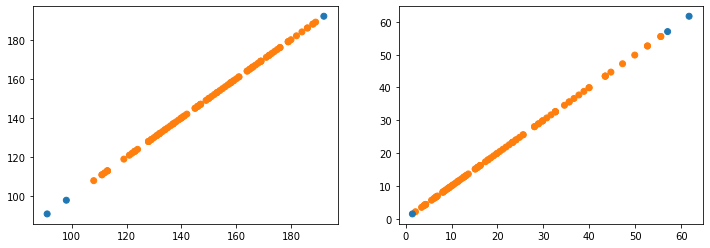

array: 72


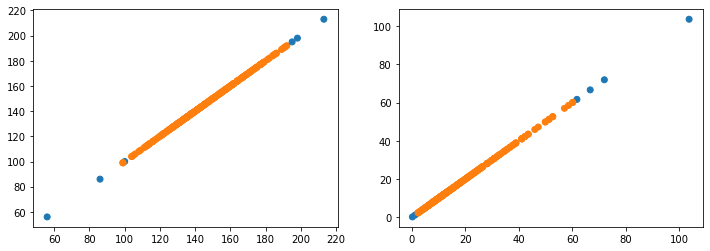

array: 73


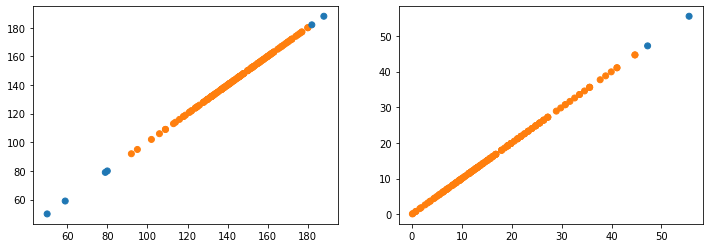

array: 74


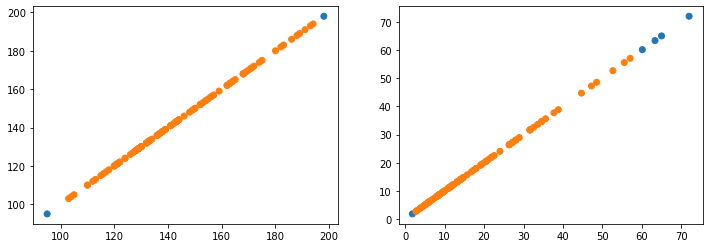

array: 75


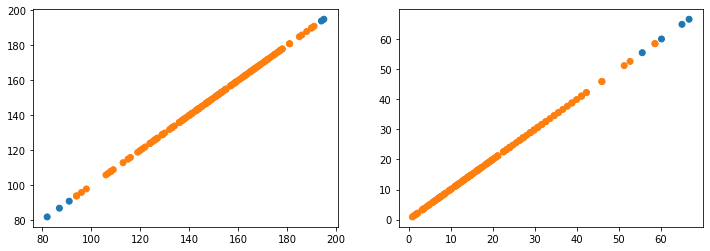

array: 76


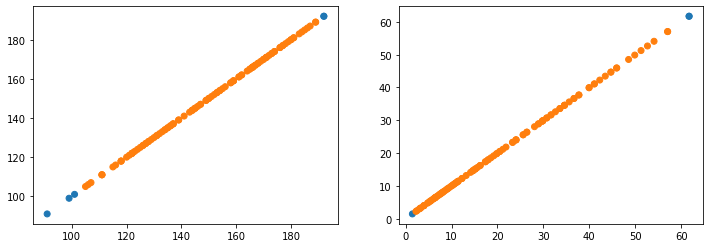

array: 77


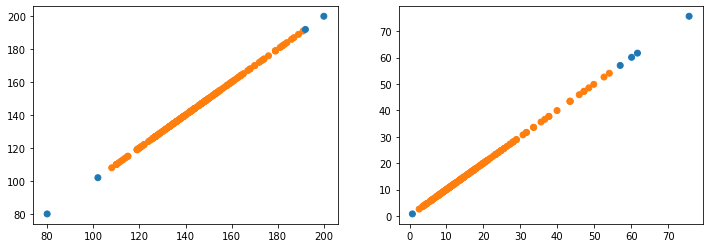

array: 78


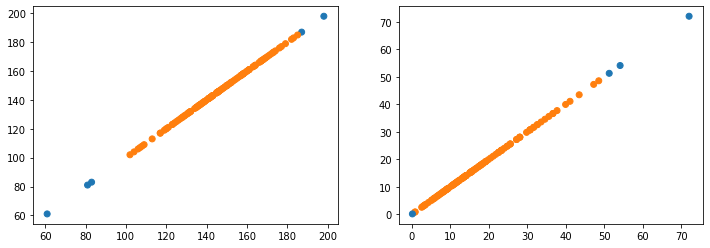

array: 79


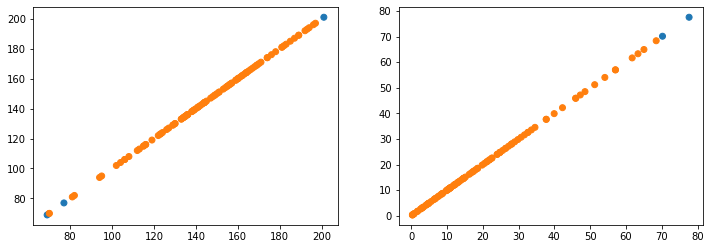

array: 80


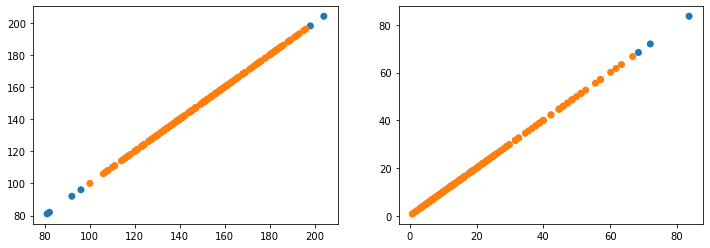

array: 81


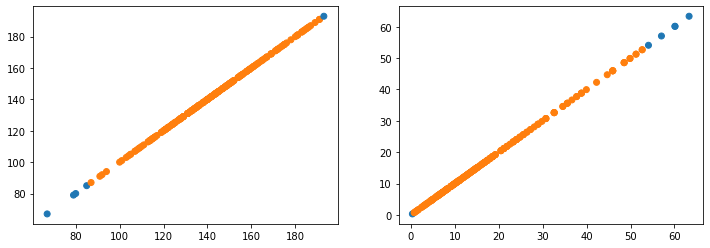

array: 82


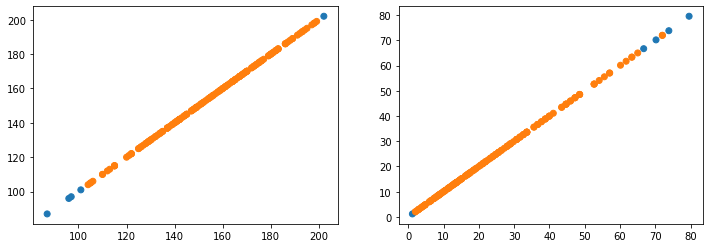

array: 83


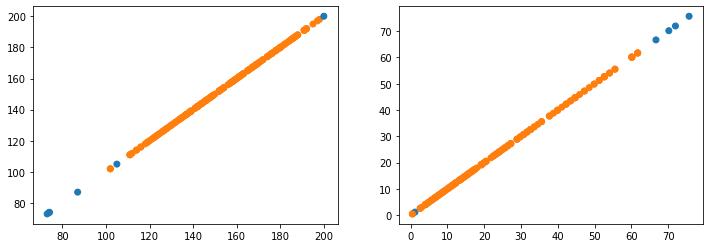

array: 84


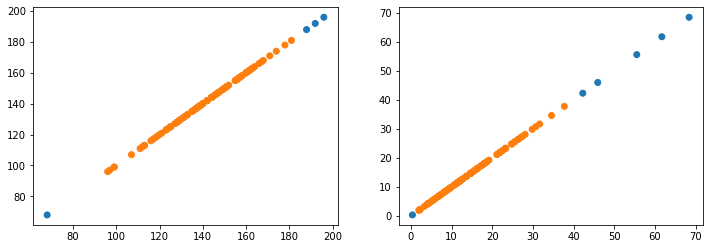

array: 85


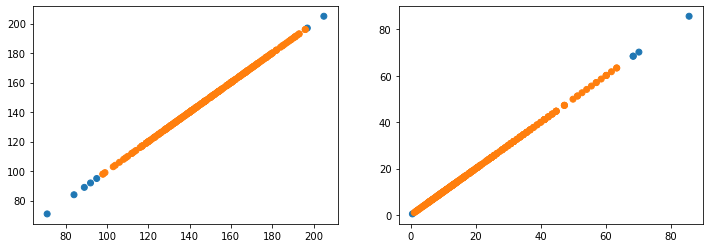

array: 86


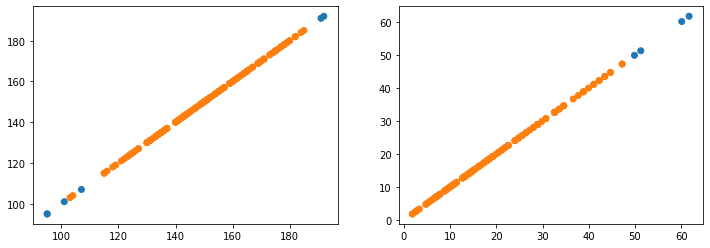

array: 87


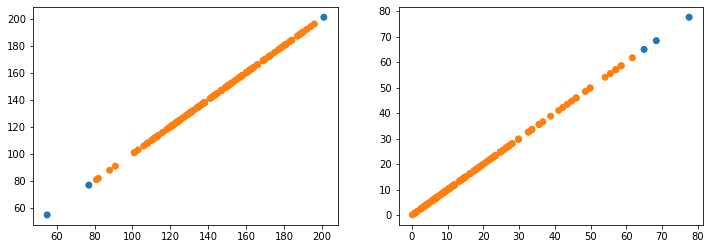

array: 88


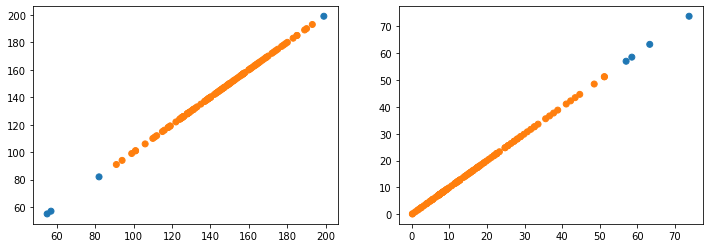

array: 89


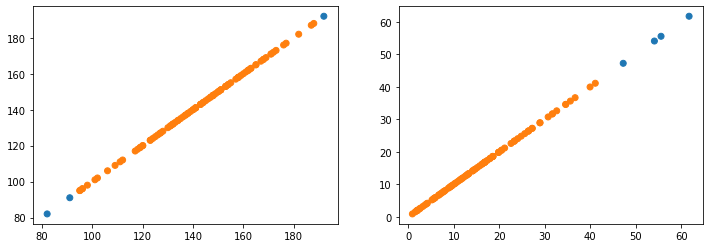

array: 90


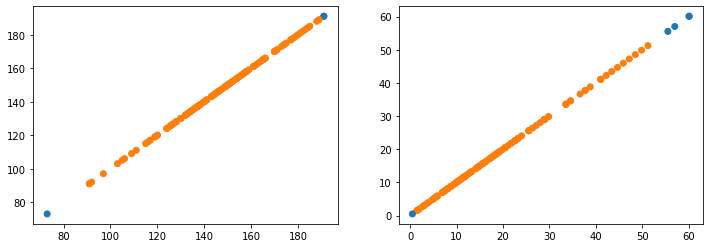

array: 91


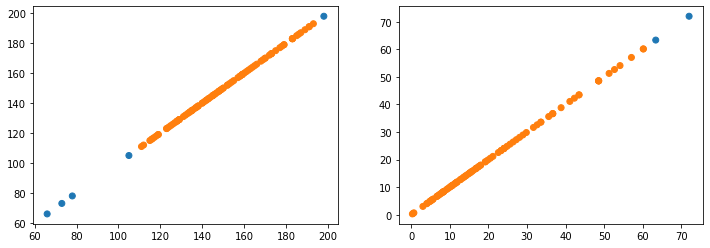

array: 92


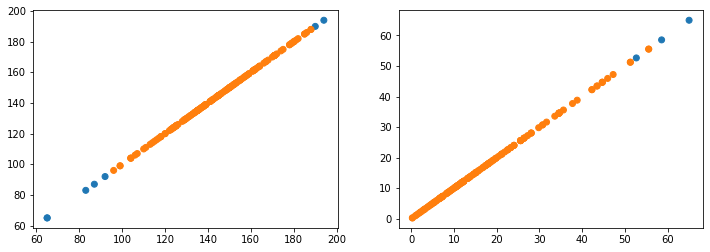

array: 93


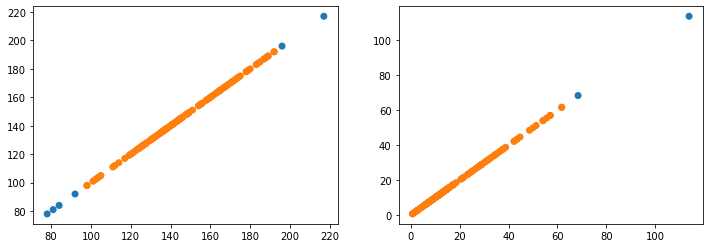

array: 94


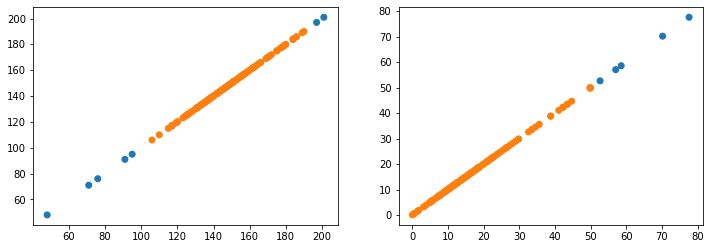

array: 95


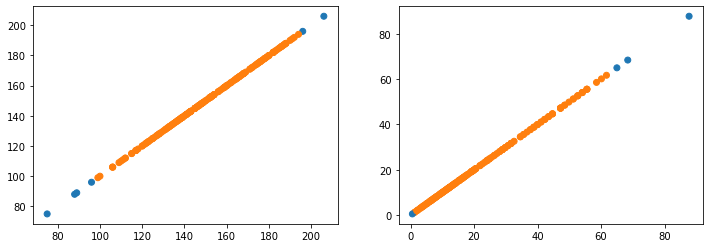

array: 96


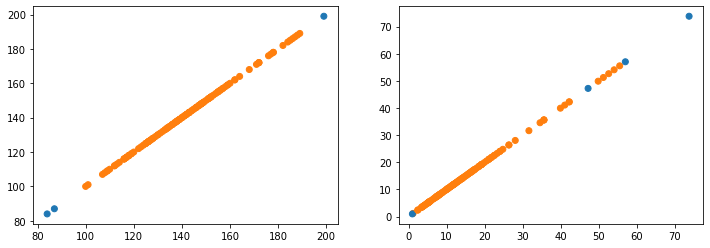

array: 97


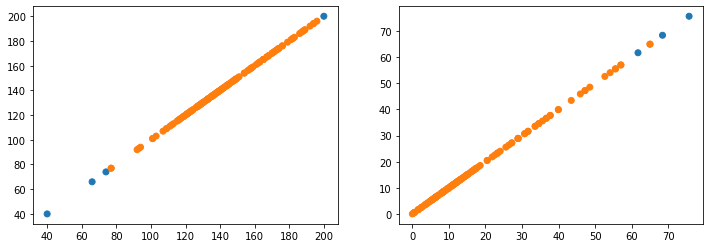

array: 98


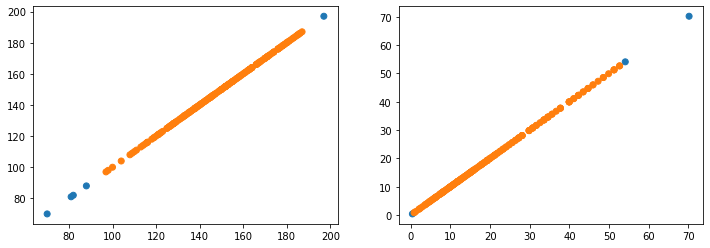

array: 99


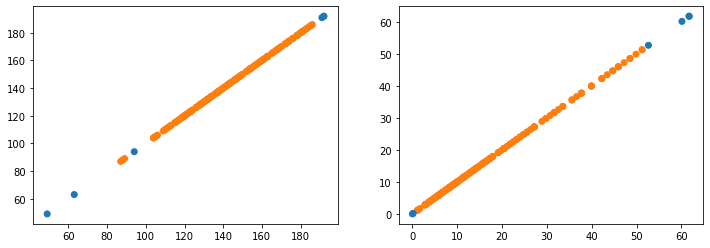

array: 100


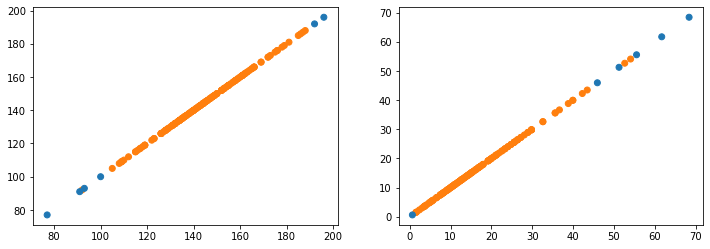

array: 101


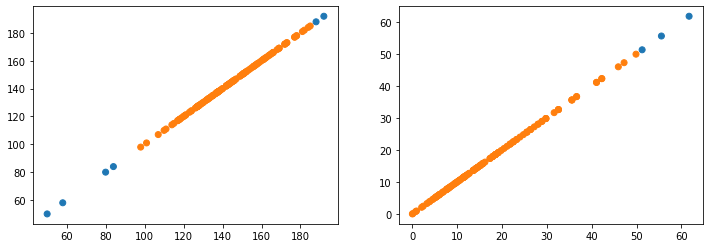

array: 102


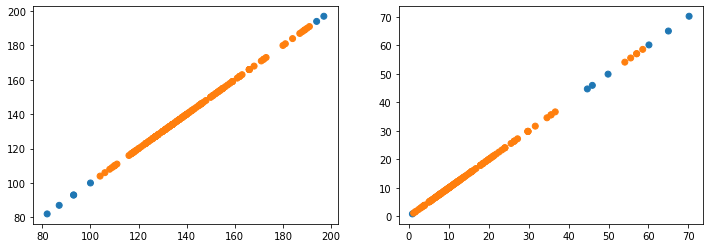

array: 103


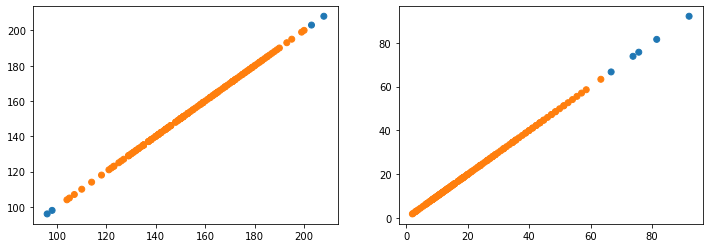

array: 104


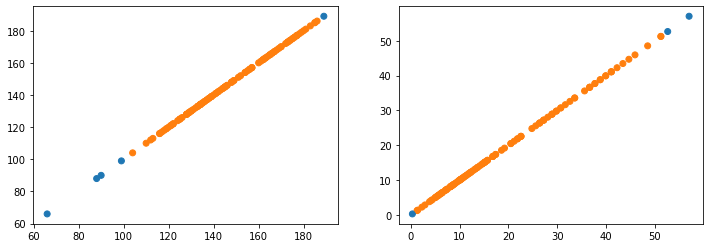

array: 105


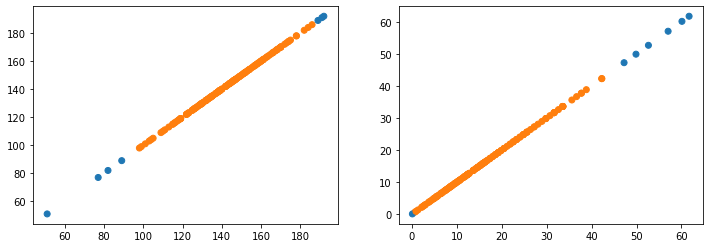

array: 106


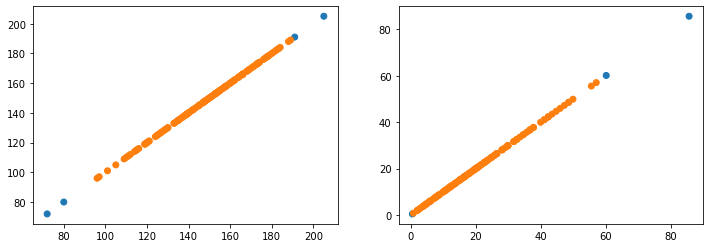

array: 107


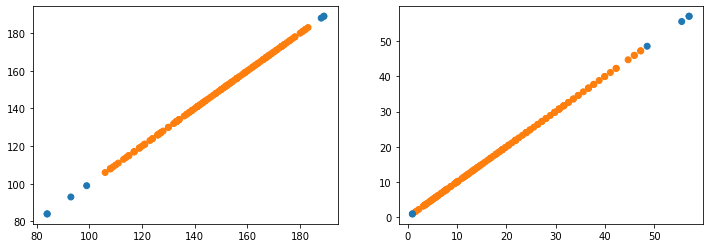

array: 108


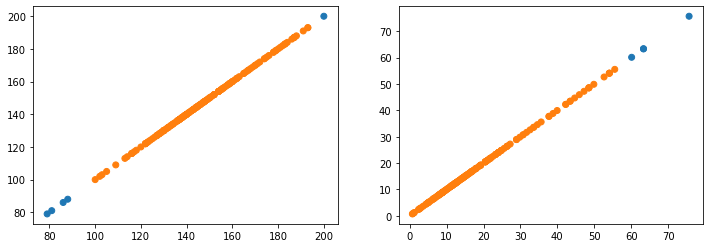

array: 109


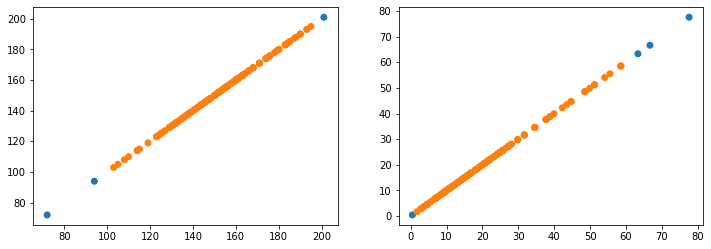

array: 110


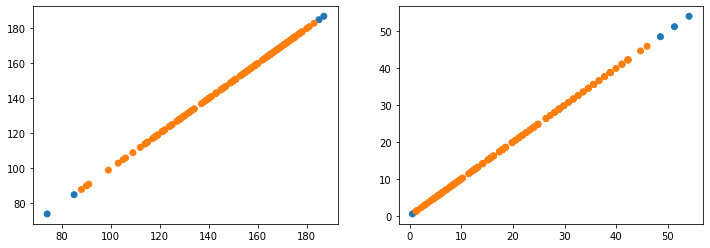

array: 111


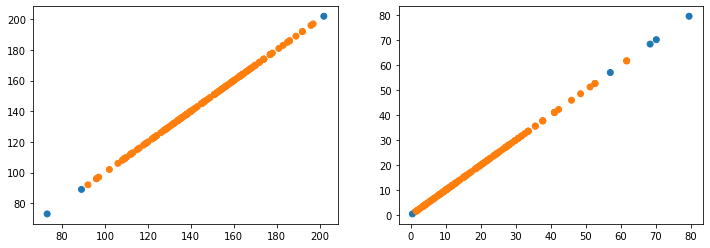

array: 112


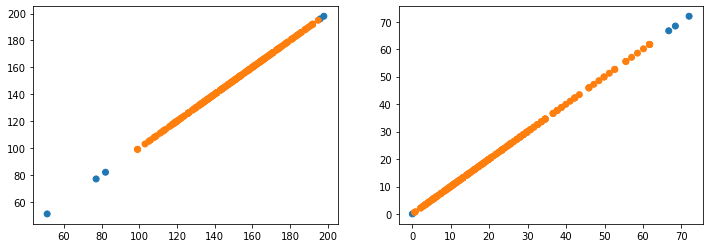

array: 113


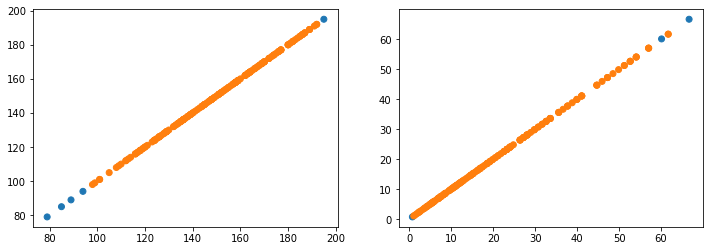

array: 114


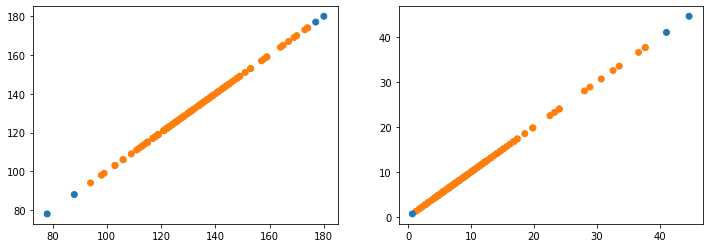

array: 115


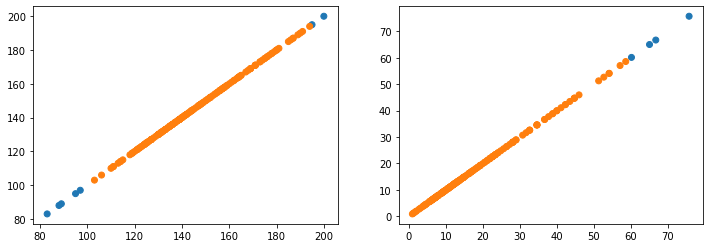

array: 116


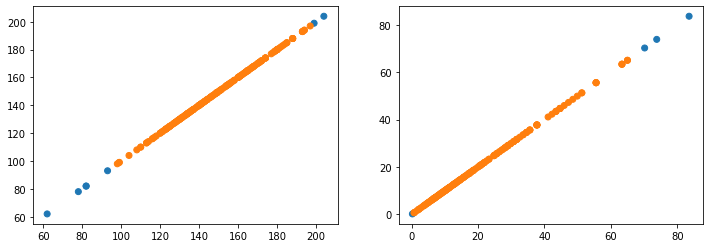

array: 117


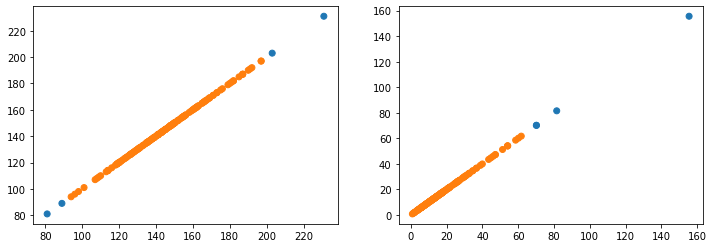

array: 118


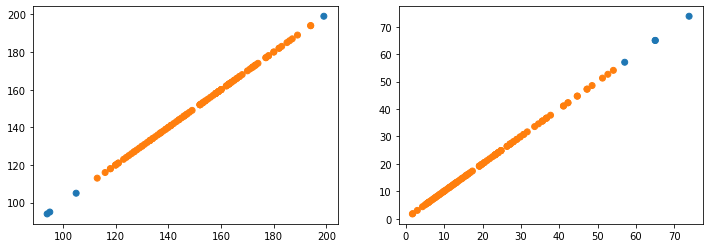

array: 119


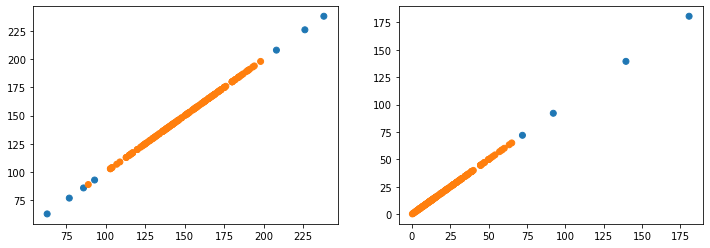

array: 120


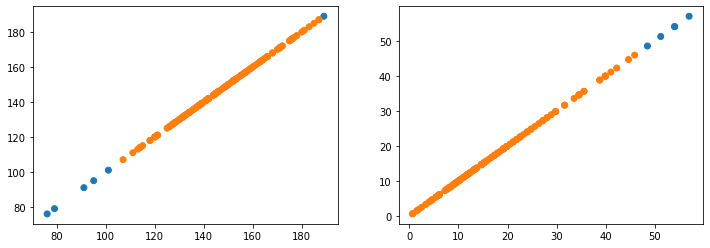

array: 121


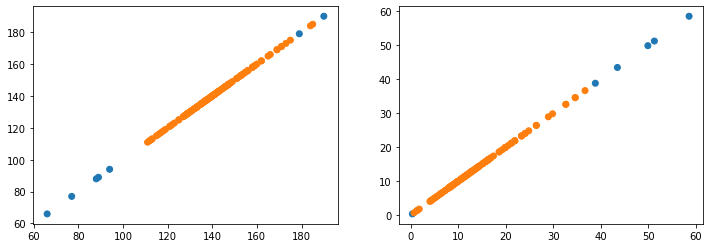

array: 122


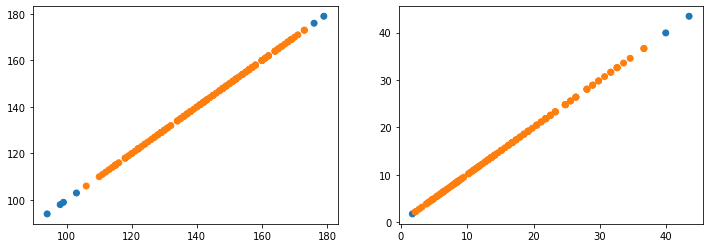

array: 123


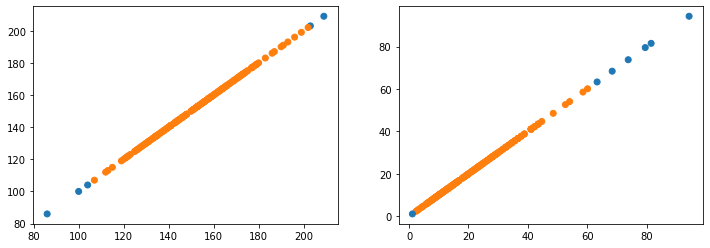

array: 124


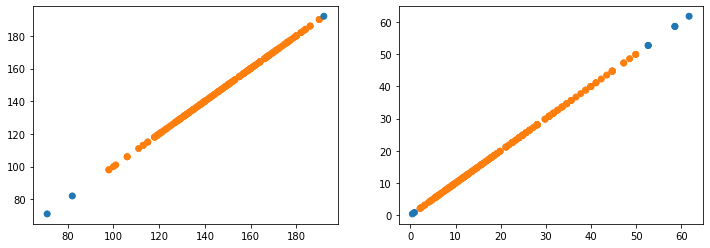

array: 125


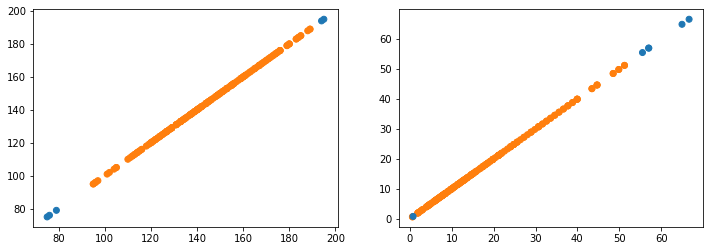

array: 126


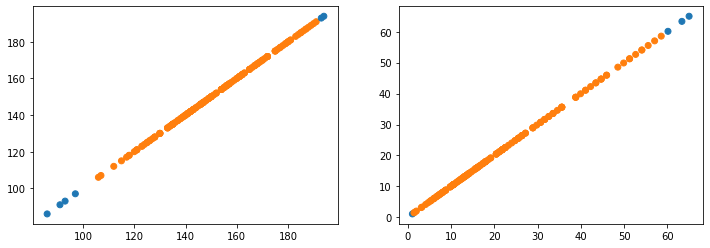

array: 127


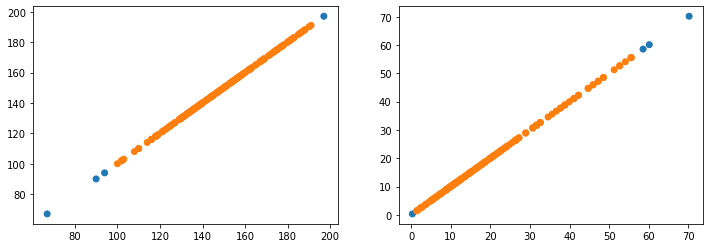

array: 128


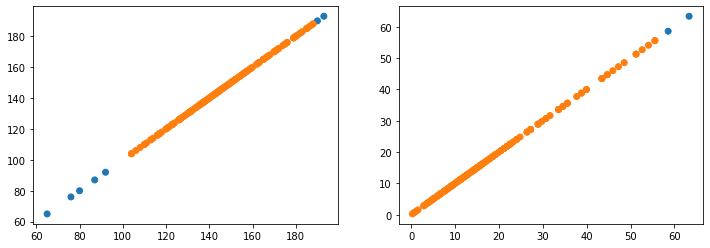

array: 129


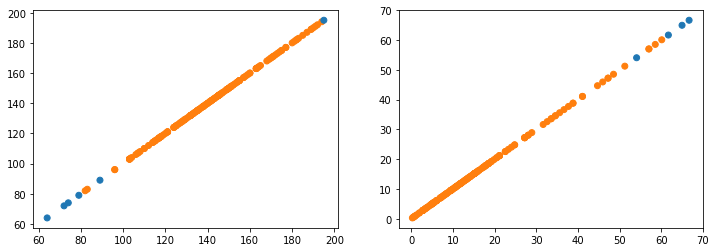

array: 130


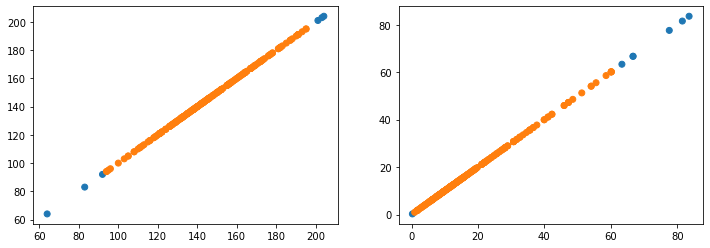

array: 131


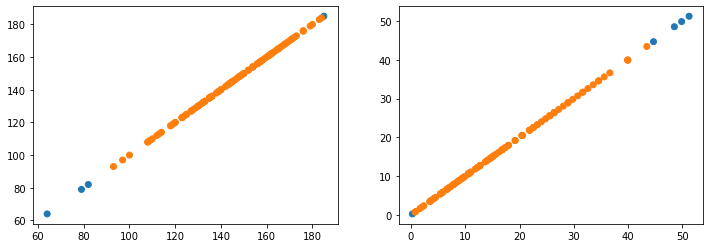

array: 132


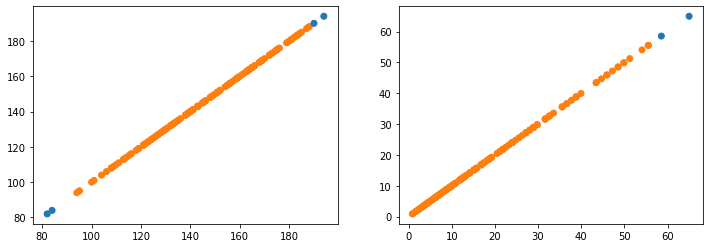

array: 133


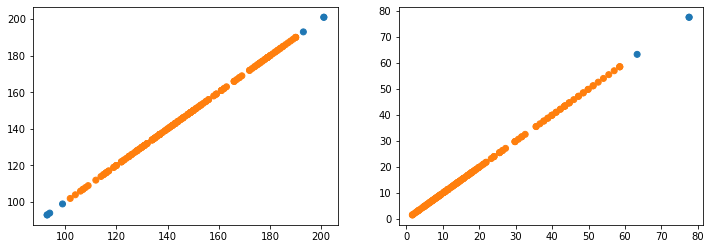

array: 134


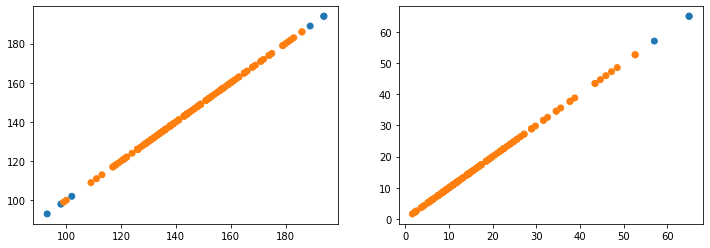

array: 135


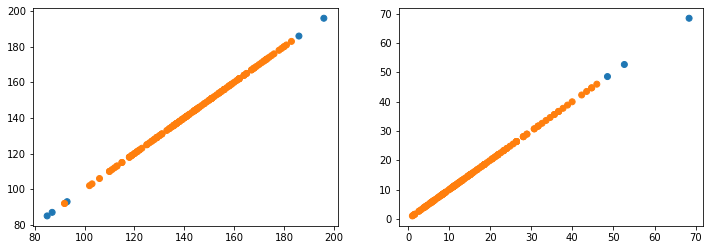

array: 136


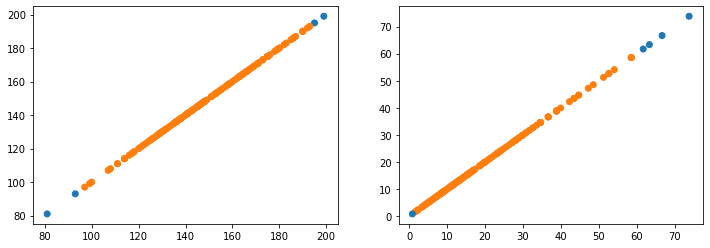

array: 137


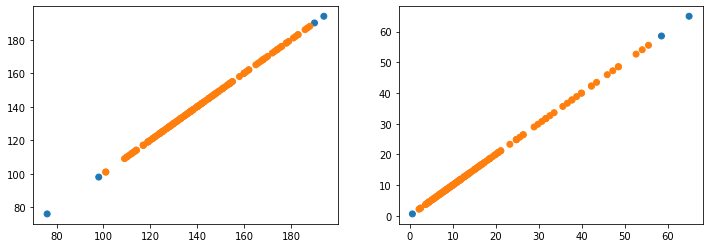

array: 138


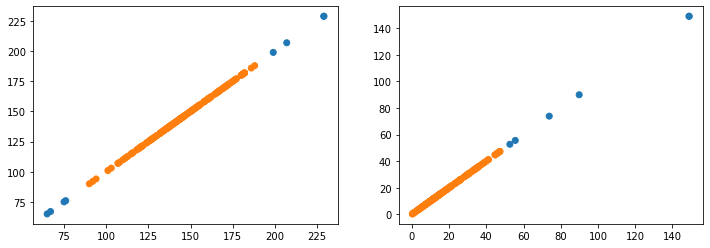

array: 139


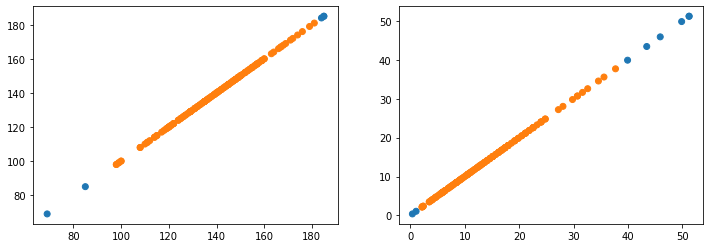

array: 140


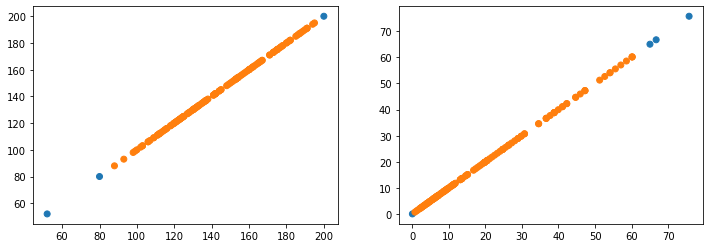

array: 141


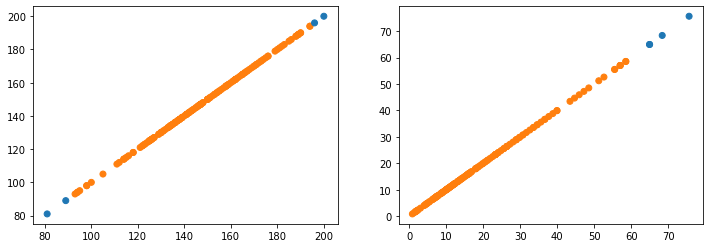

array: 142


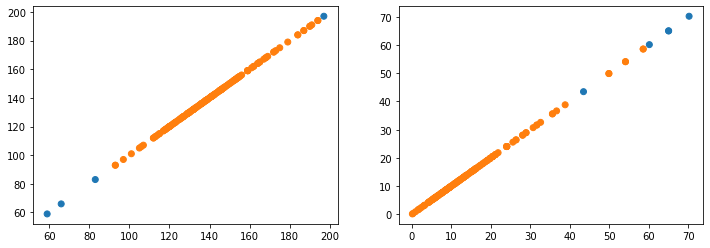

array: 143


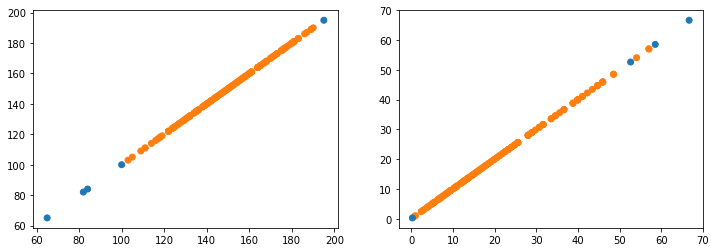

array: 144


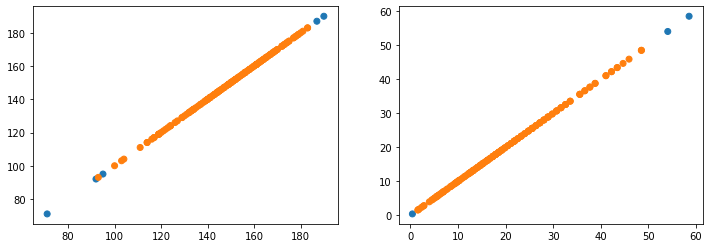

array: 145


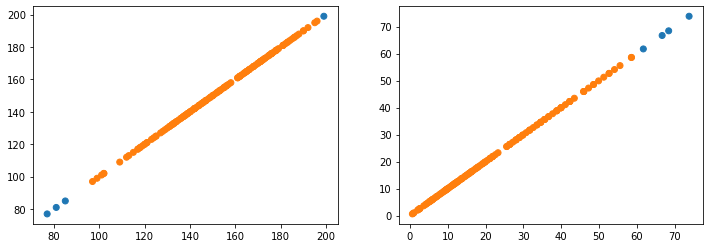

array: 146


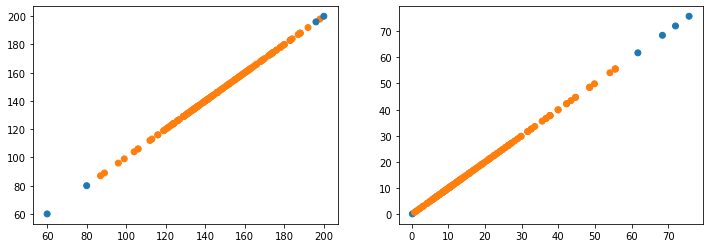

array: 147


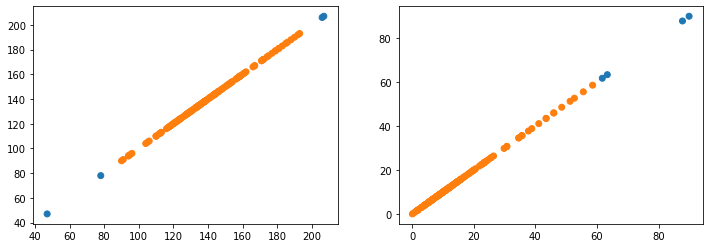

array: 148


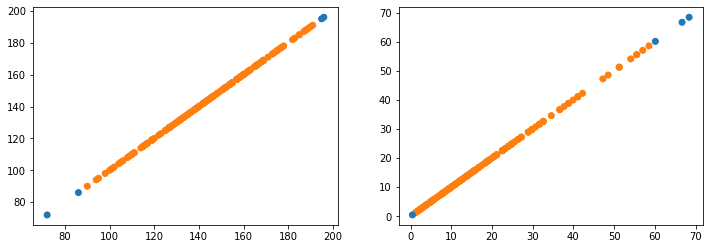

array: 149


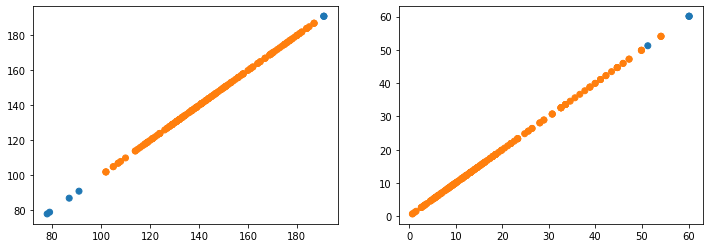

array: 150


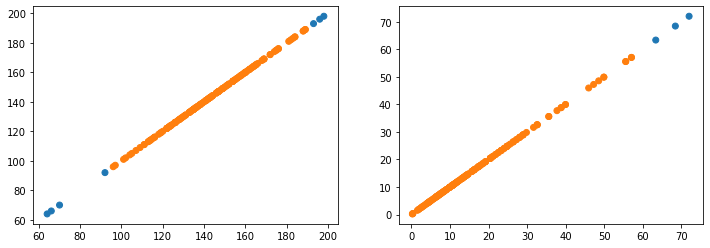

array: 151


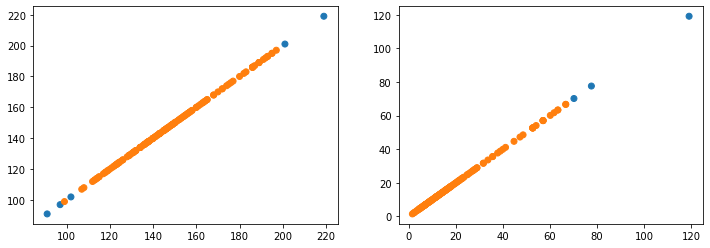

array: 152


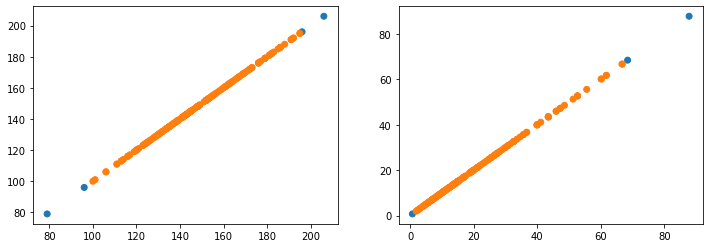

array: 153


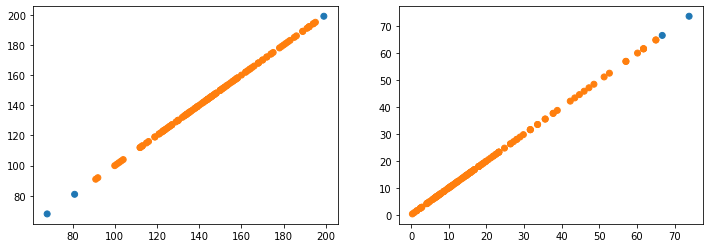

array: 154


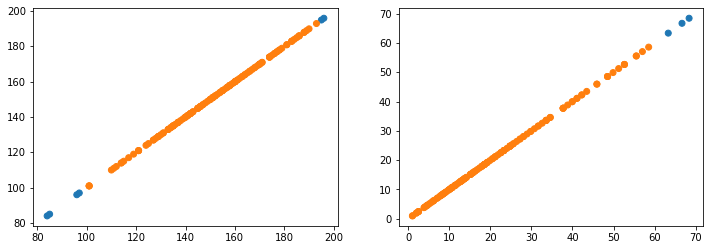

array: 155


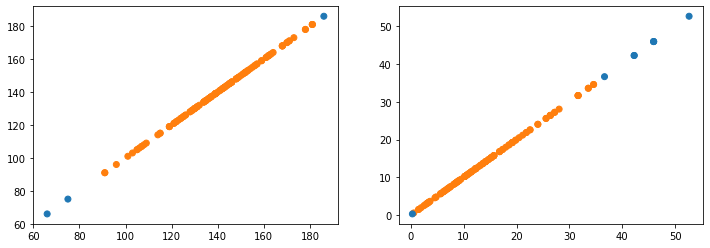

array: 156


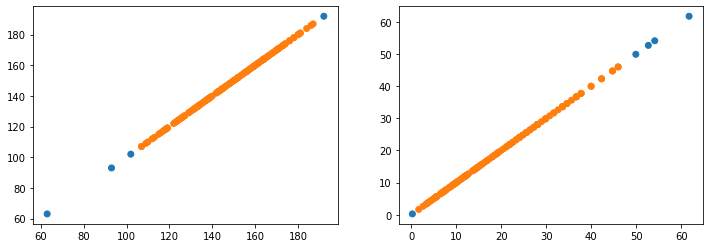

array: 157


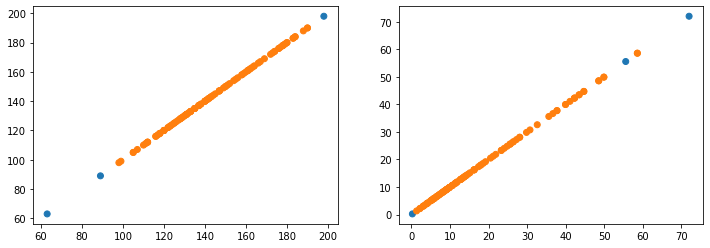

array: 158


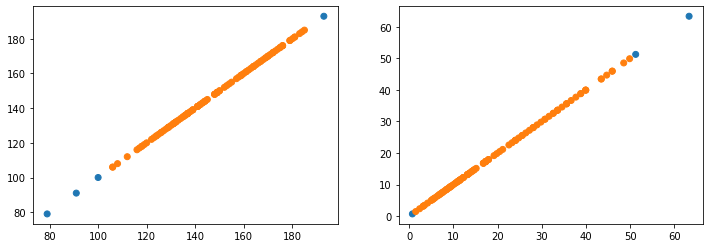

array: 159


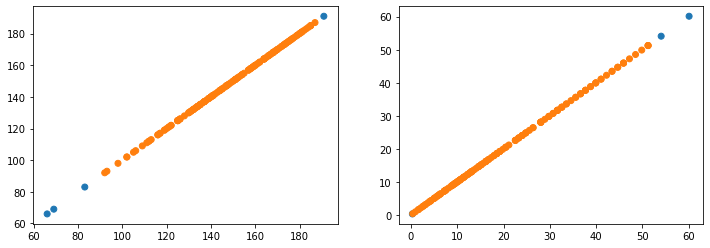

array: 160


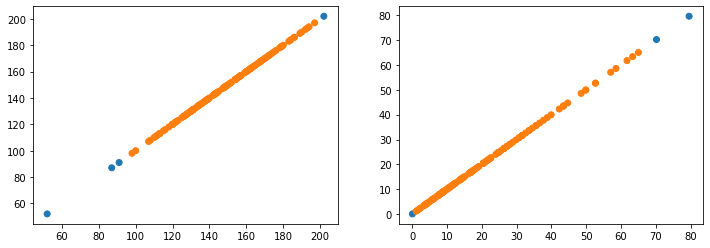

array: 161


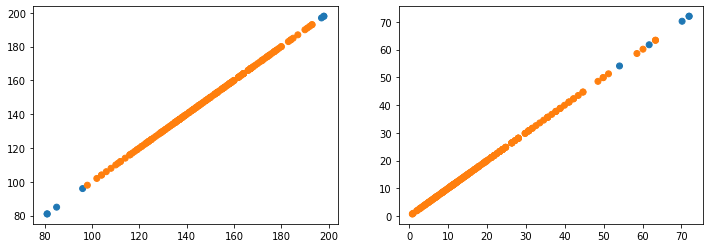

array: 162


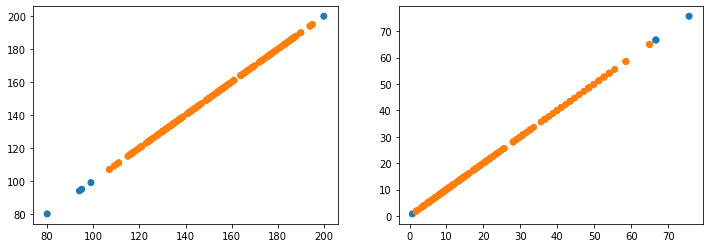

array: 163


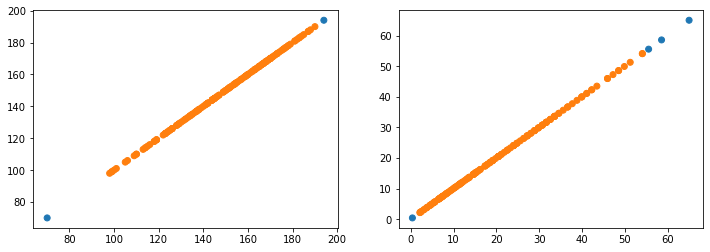

array: 164


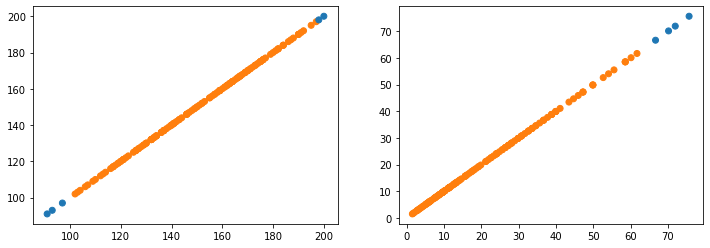

array: 165


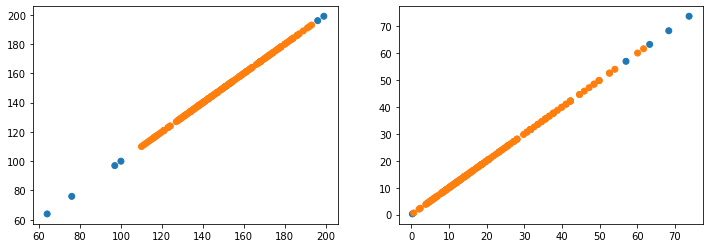

array: 166


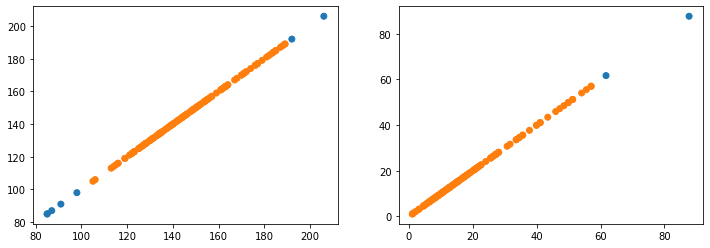

array: 167


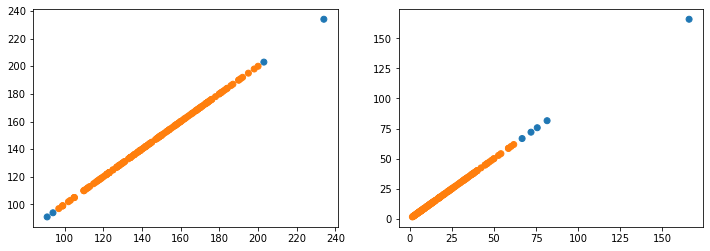

array: 168


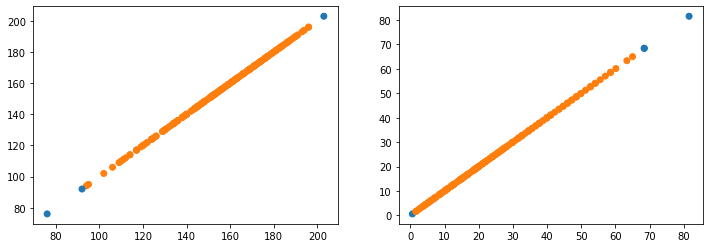

array: 169


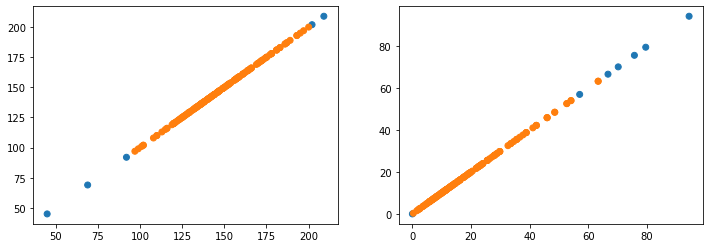

array: 170


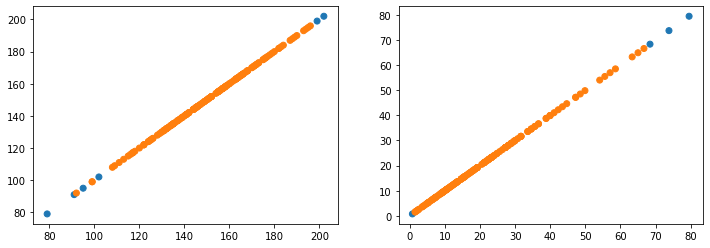

array: 171


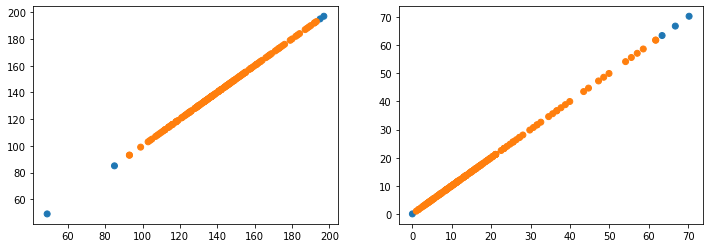

array: 172


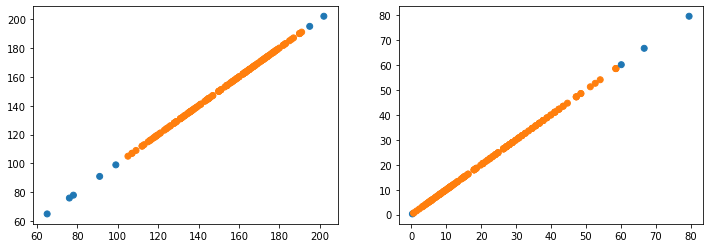

array: 173


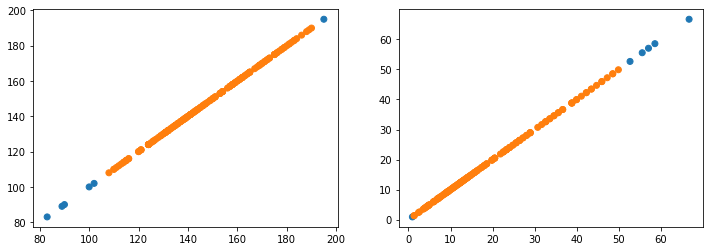

array: 174


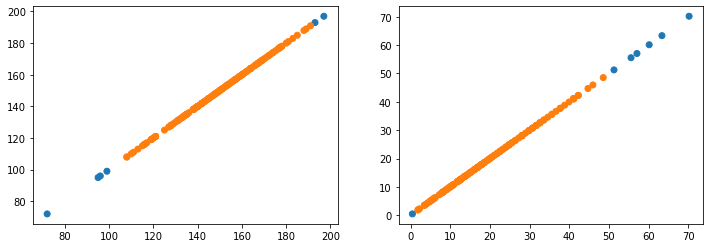

array: 175


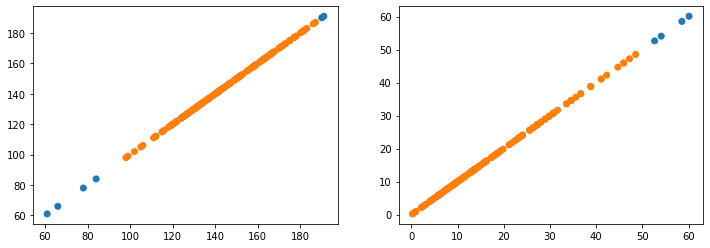

array: 176


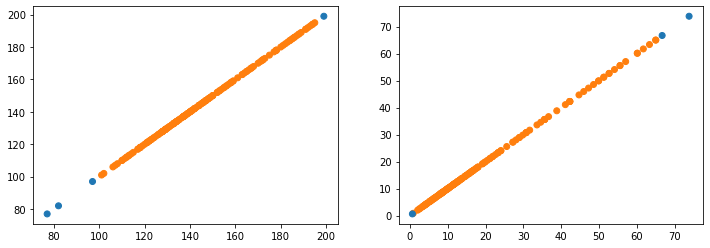

array: 177


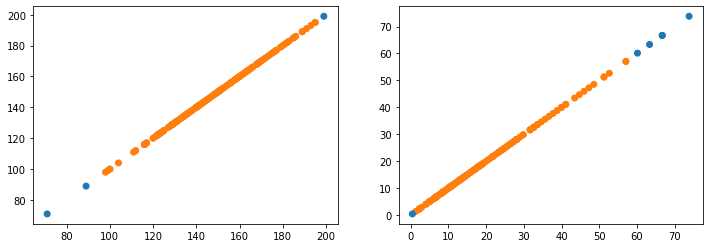

array: 178


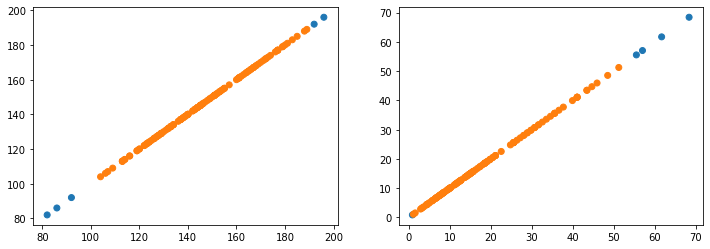

array: 179


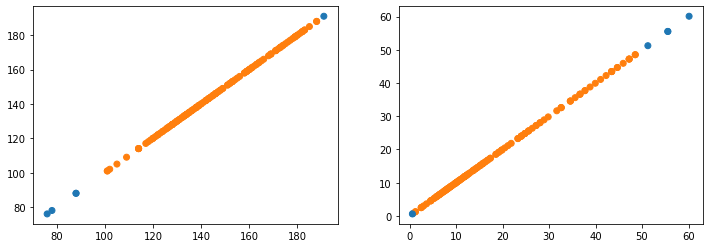

array: 180


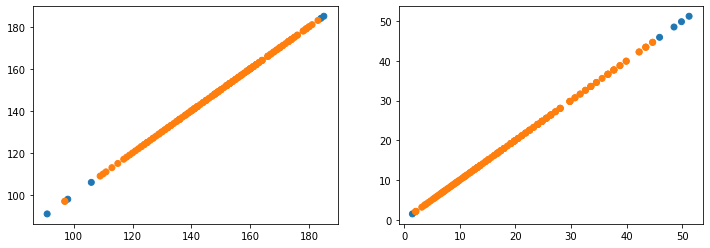

array: 181


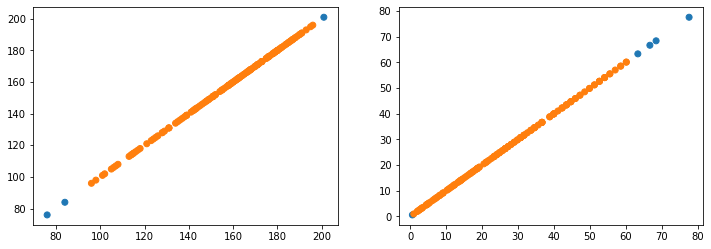

array: 182


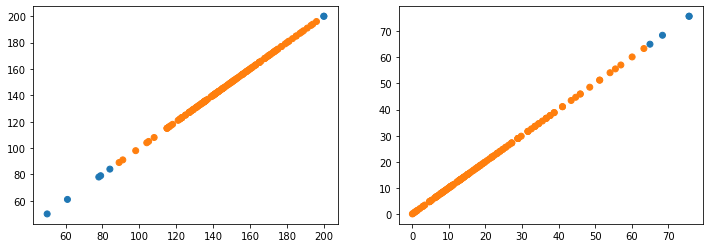

array: 183


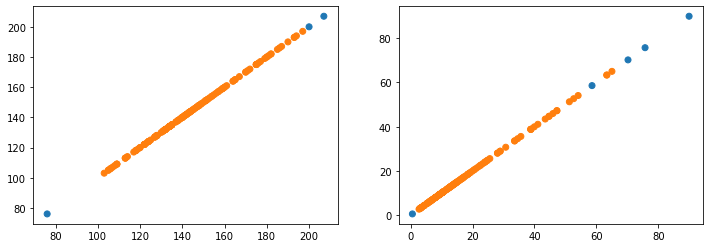

array: 184


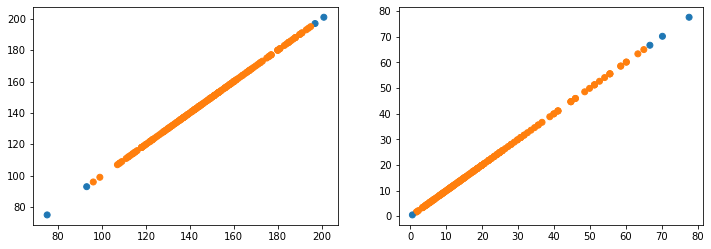

array: 185


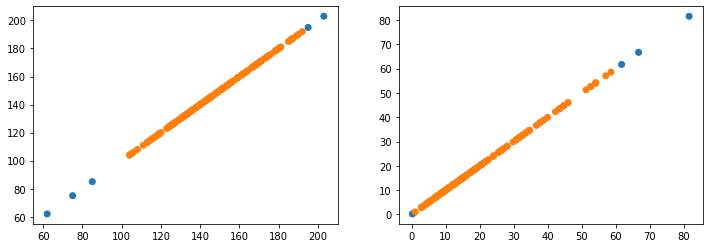

array: 186


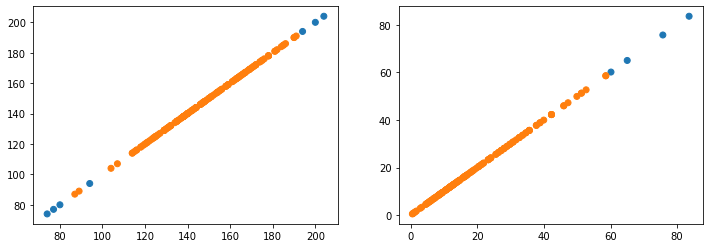

array: 187


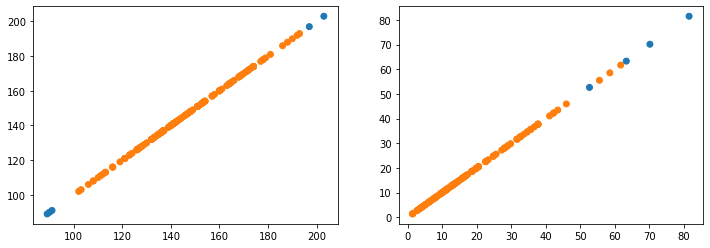

array: 188


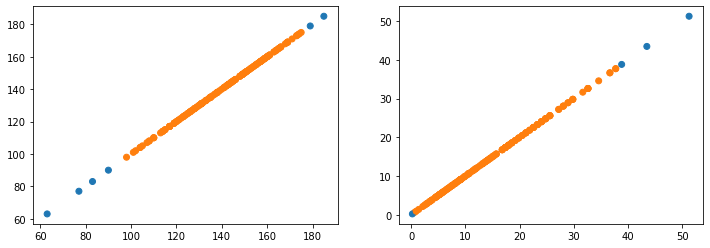

array: 189


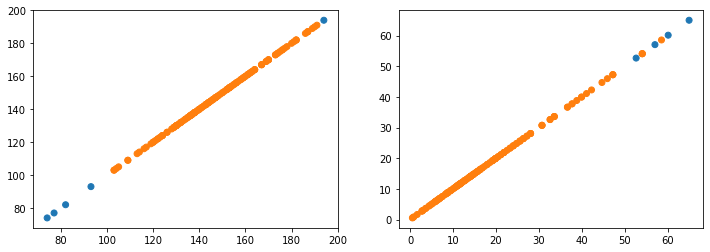

array: 190


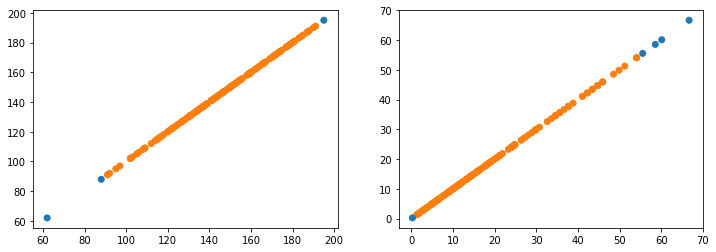

array: 191


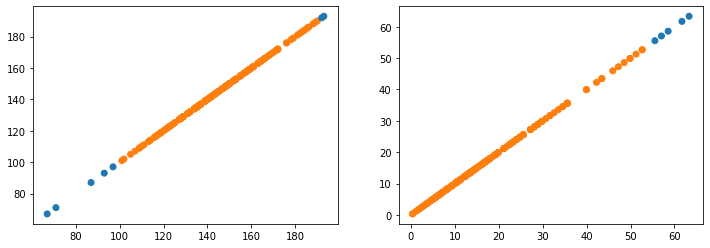

array: 192


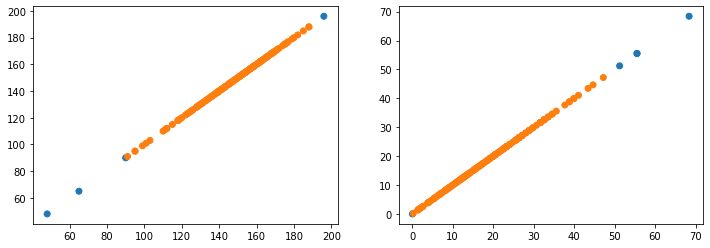

array: 193


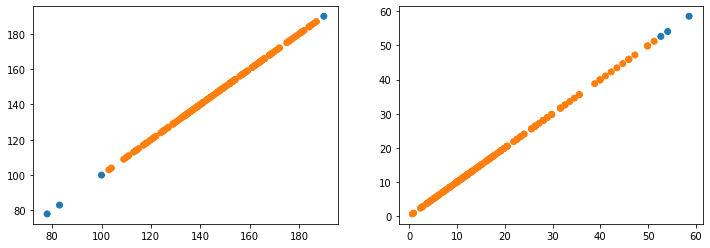

array: 194


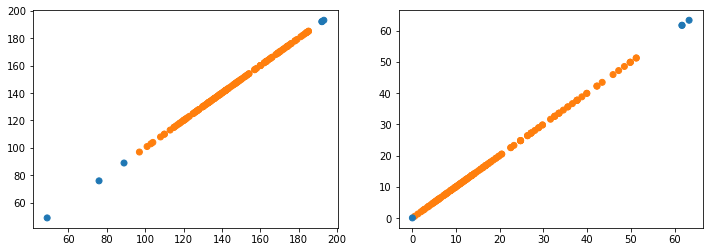

array: 195


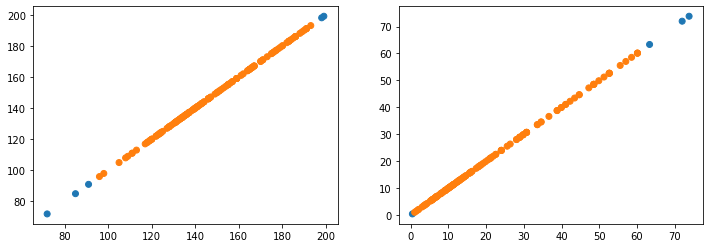

array: 196


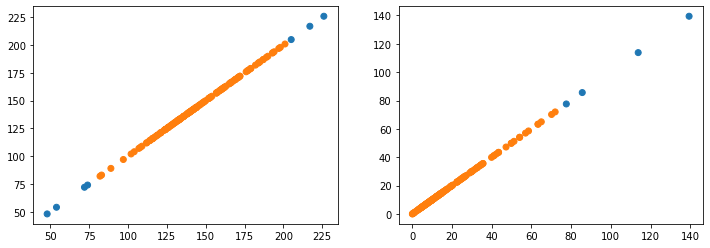

array: 197


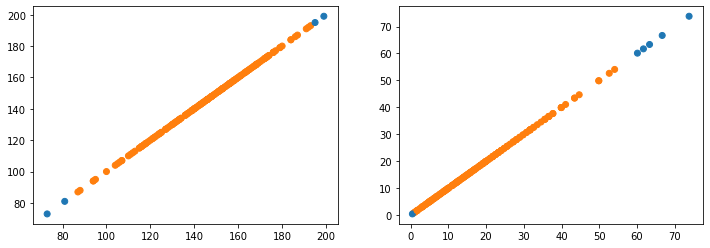

array: 198


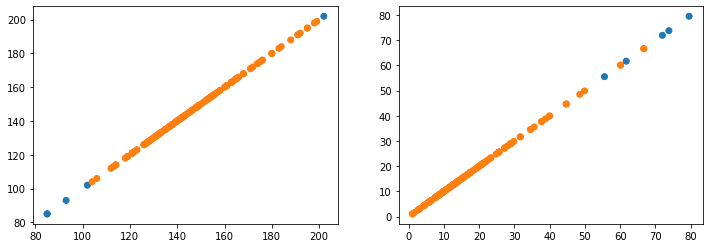

array: 199


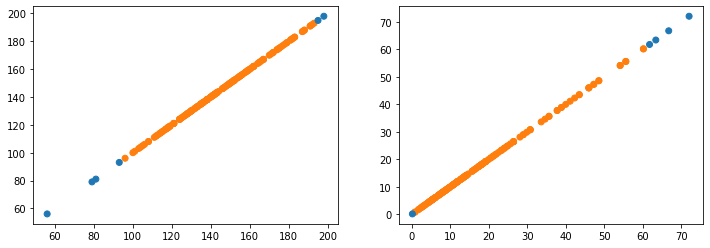

array: 200


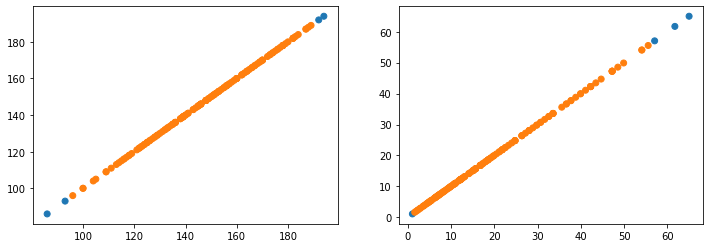

array: 201


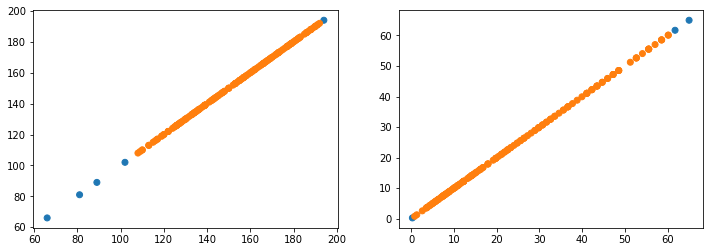

array: 202


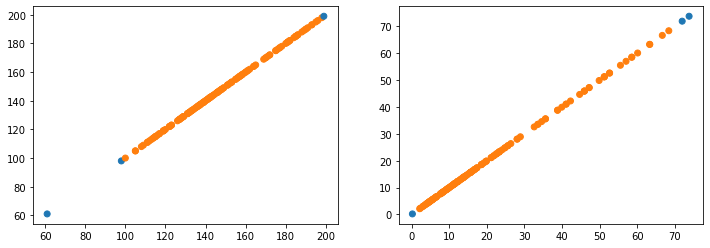

array: 203


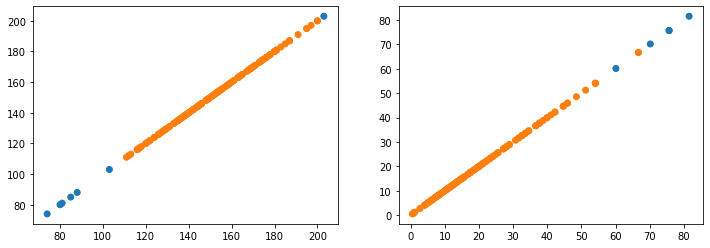

array: 204


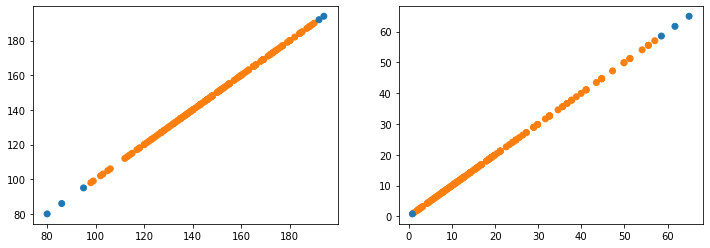

array: 205


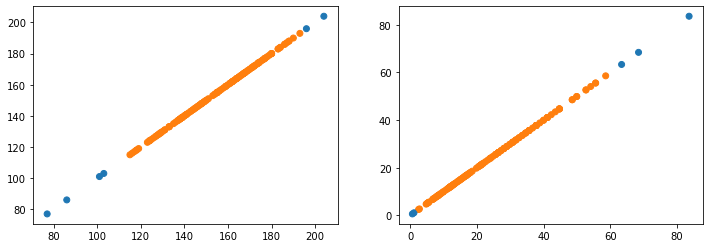

array: 206


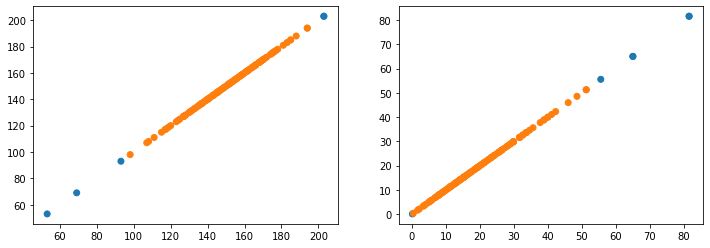

array: 207


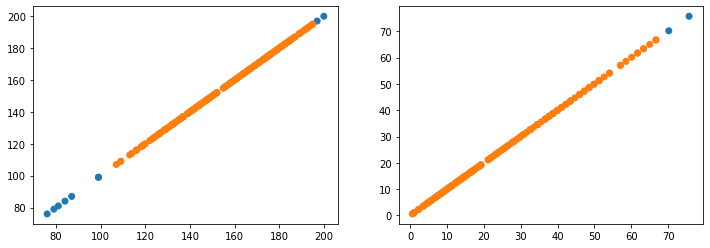

array: 208


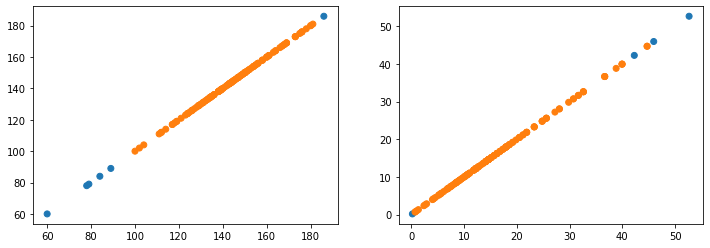

array: 209


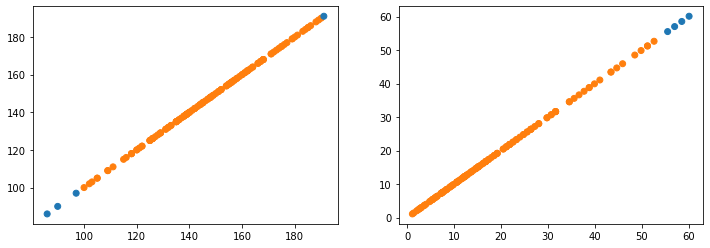

array: 210


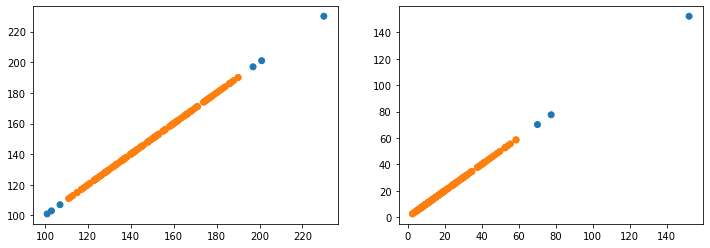

array: 211


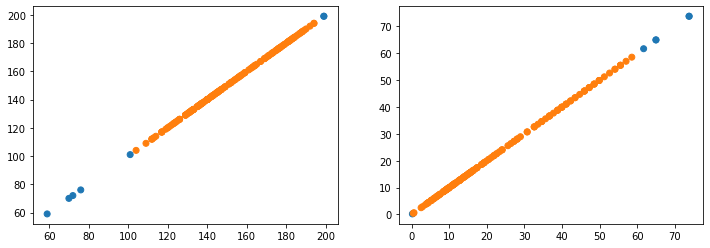

array: 212


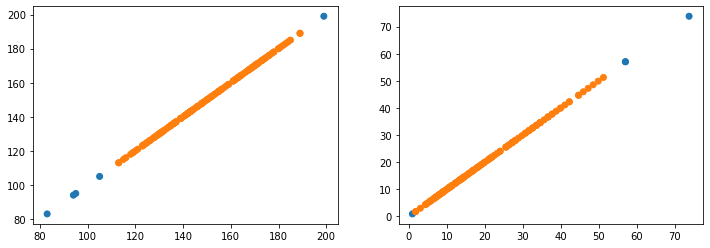

array: 213


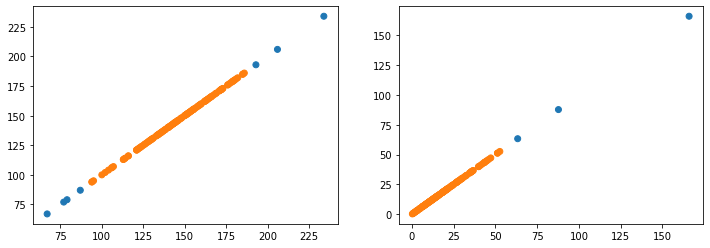

array: 214


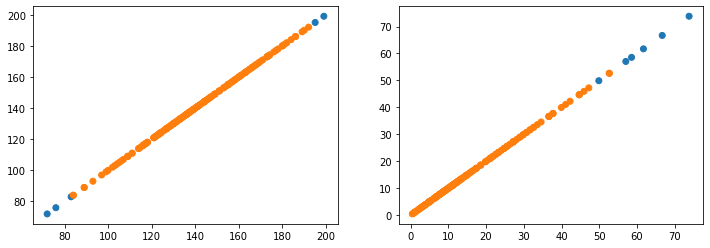

array: 215


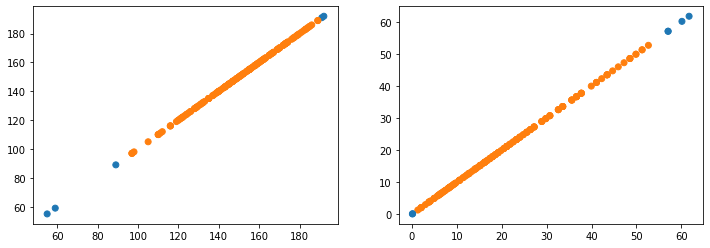

array: 216


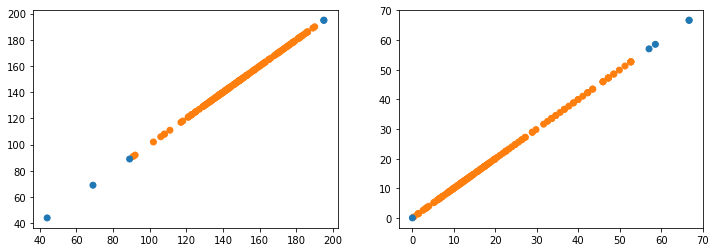

array: 217


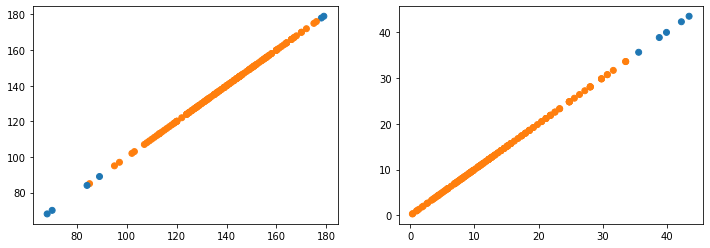

array: 218


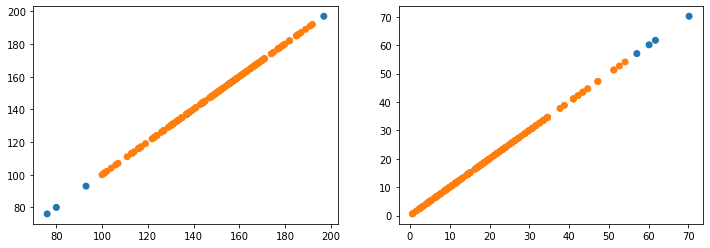

array: 219


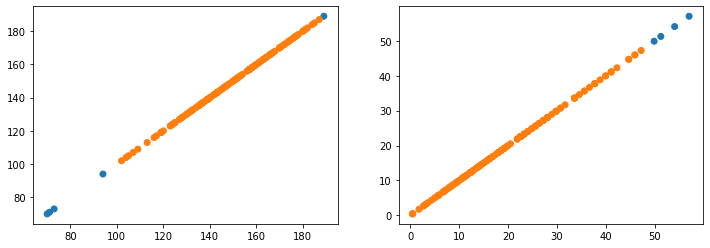

array: 220


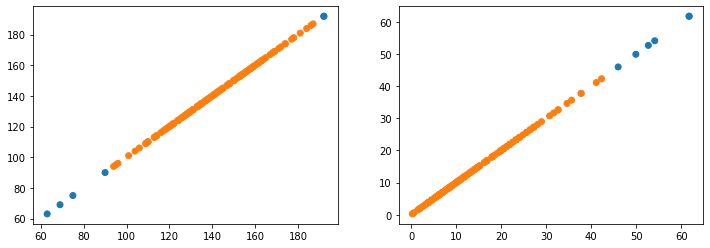

array: 221


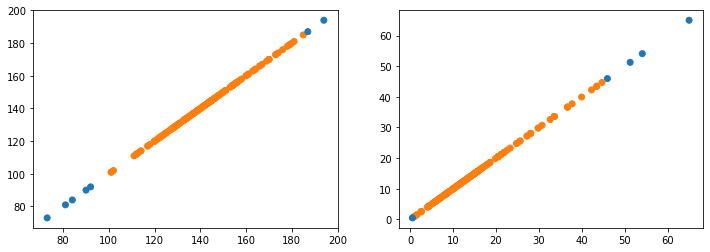

array: 222


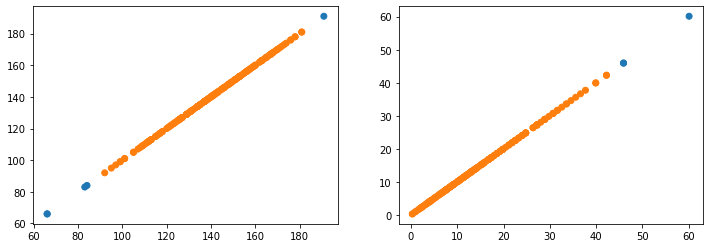

array: 223


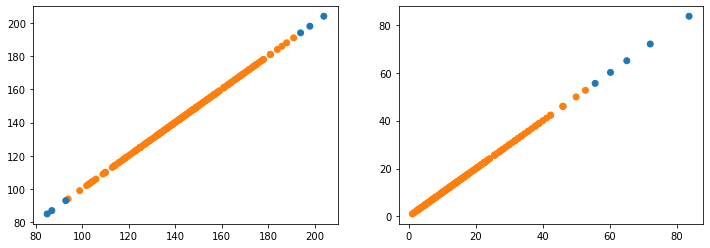

array: 224


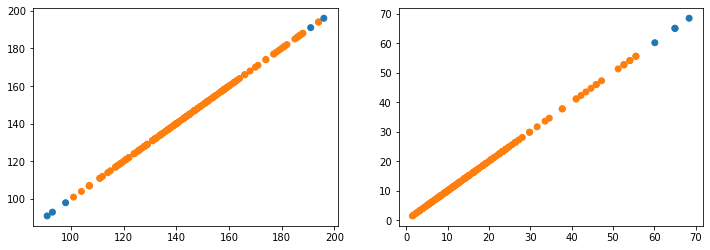

array: 225


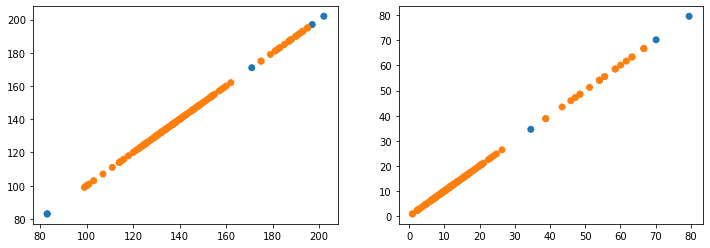

array: 226


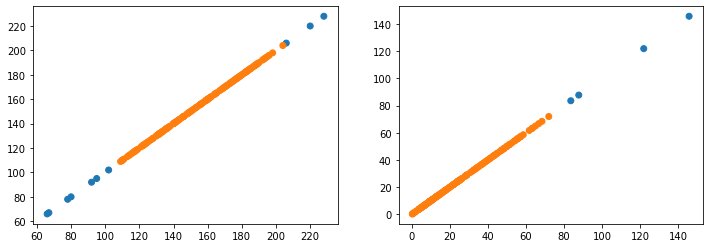

array: 227


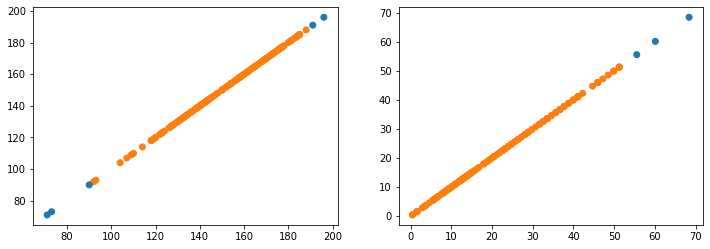

array: 228


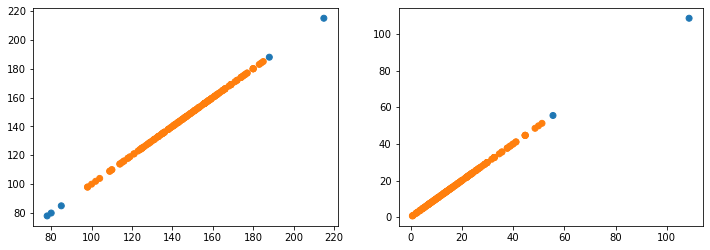

array: 229


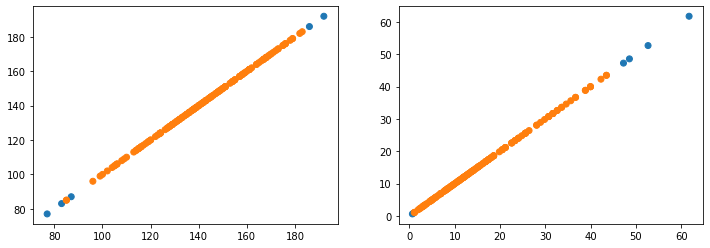

array: 230


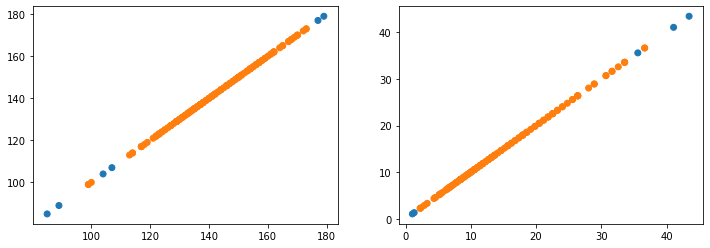

array: 231


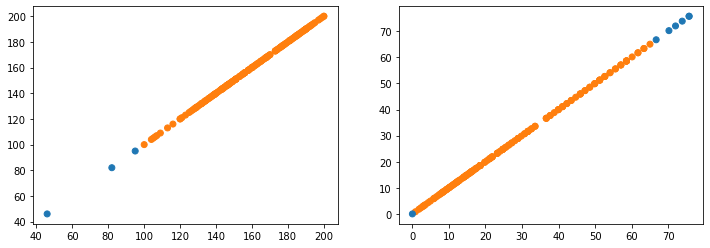

array: 232


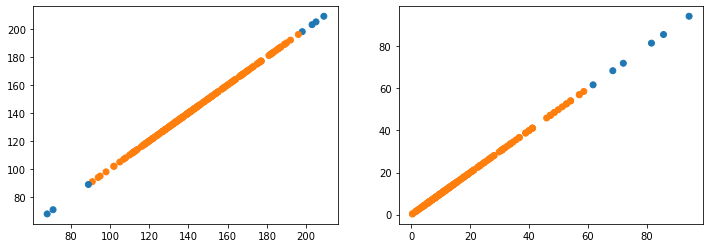

array: 233


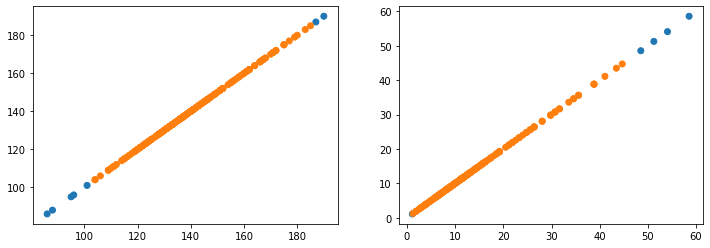

array: 234


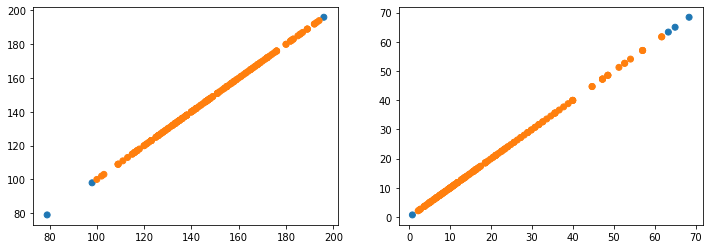

array: 235


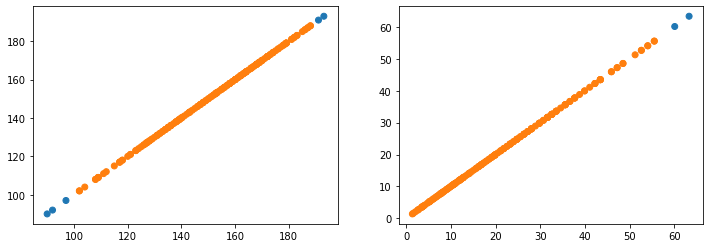

In [270]:
check_outliers(array_isof, array_isof_gamma)

In [105]:
#for k, v in data_array.items():
#    print("module label:",k)
#    display.display_distributions(v.all_temperature, 
#                              filepath = "hist_all_temperature.jpg")
#    display.display_distributions(v.scaled_all_temperature, 
#                              filepath = "hist_scaled_all_temperature.jpg")        
#    display.display_distributions(array_scaler[k].transform(v.all_temperature), 
#                              filepath = "hist_transformed_all_temperature.jpg")

異常タイプの確認テスト

In [106]:
def get_hotspots_in_array(transformed_clusters_temperature, img_file, log=False):
    # -- hot cluster --
    hot_clusters = (transformed_clusters_temperature.mean(axis=1) > 2.0)
    # -- hot pixcel --
    hot_pixels = np.array([c in np.where(hot_clusters==True)[0] for c in clusters.labels])
    hot_pixels = hot_pixels.reshape(*img_file.shape[:2],1)      
    if log:
        print("Hot cluster labels in array:",hot_clusters)
        print("Hotspot weights in array:",hot_pixels.mean())
    return hot_pixels, hot_clusters

In [107]:
def get_hotspots_in_module(
    scaled_clusters_temperature, transformed_clusters_temperature, img_file, log=False):
    # -- hot cluster --
    hot_clusters = (scaled_clusters_temperature.mean(axis=1) > 2.5) \
    & (transformed_clusters_temperature.mean(axis=1) > 0)
    # -- hot pixcel --
    hot_pixels = np.array([c in np.where(hot_clusters==True)[0] for c in clusters.labels])
    hot_pixels = hot_pixels.reshape(*img_file.shape[:2],1)      
    if log:
        print("Hot cluster labels in module:",hot_clusters)
        print("Hotspot weights in module:",hot_pixels.mean())
    return hot_pixels, hot_clusters

In [243]:
def get_hotspots_by_models(
    original_clusters_temperature, transformed_clusters_temperature, model, img_file, log=False):
    hot_clusters = (model.predict(original_clusters_temperature) < 0) \
    & (transformed_clusters_temperature.mean(axis=1) > 0)
    #print(model.score_samples(original_clusters_temperature))
    #print(model.offset_)
    hot_pixels = np.array([c in np.where(hot_clusters==True)[0] for c in clusters.labels])
    hot_pixels = hot_pixels.reshape(*img_file.shape[:2],1) 
    return hot_pixels, hot_clusters

2114.jpg Multi-Hotspots


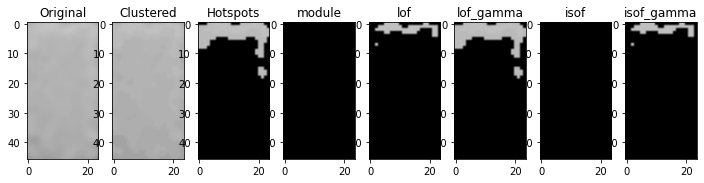

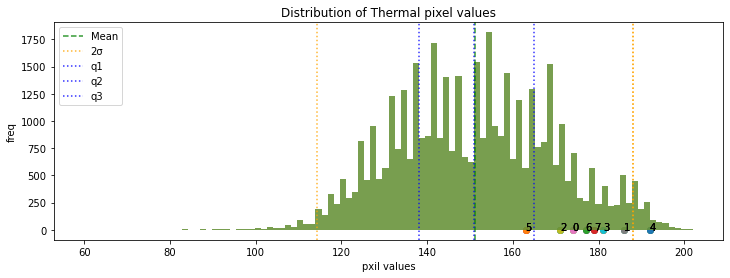

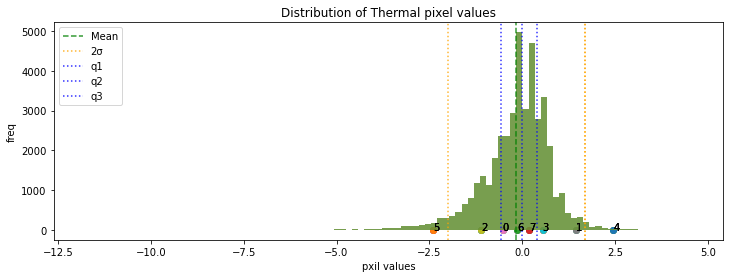

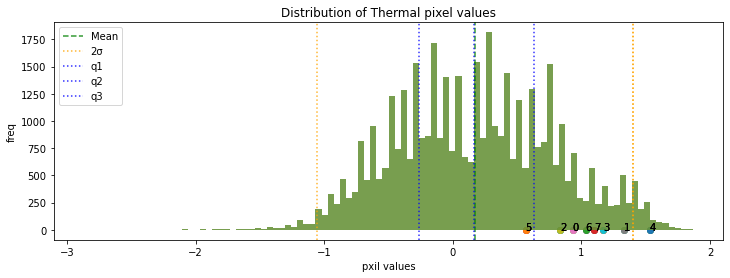

In [ ]:
anomaly_modules= {}
os.makedirs(input_dir_path+"/hist/",exist_ok=True)
for n, k in enumerate(list(thermal_img_files)[:100]):
#for n, k in enumerate(list(thermal_img_files)[:200]):    
#for n, k in enumerate(list(thermal_img_files)):    
    # -- module label --
    l = module_labels[n]
    if l == -1:
        pass
    else:
        # -- cluster temperature ---
        clusters = clustering.TemperatureClusters(
            data_array[l].scaled_temperature_with_index[k], method=clustering_method)  
        # -- original cluster --
        sliced_data = clusters.get_clusters_data(data_array[l].temperature[k])    
        original_clusters_temperature = np.stack([np.uint8(t.mean(axis=0)) for t in sliced_data])
        # -- scaled cluster --
        sliced_data = clusters.get_clusters_data(data_array[l].scaled_temperature[k])
        scaled_clusters_temperature = np.stack([t.mean(axis=0) for t in sliced_data ])
        # -- transformed temperature --
        transformed_clusters_temperature = array_zscaler[l].transform(original_clusters_temperature)
        gamma_clusters_temperature = gamma_correction(
            original_clusters_temperature, gamma=gamma)
        # -- anomaly detection --    
        hot_pixels_in_array, hot_clusters_in_array = get_hotspots_in_array(
            transformed_clusters_temperature, thermal_img_files[k], log=False) 
        hot_pixels_in_module, hot_clusters_in_module = get_hotspots_in_module(
            scaled_clusters_temperature, transformed_clusters_temperature, 
            thermal_img_files[k], log=False)
        hot_pixcels_lof, hot_clusters_lof = get_hotspots_by_models(
            original_clusters_temperature, transformed_clusters_temperature,
            array_lof[l], thermal_img_files[k], log=False)
        hot_pixcels_lof_gamma, hot_clusters_lof_gamma = get_hotspots_by_models(
            gamma_clusters_temperature, transformed_clusters_temperature,
            array_lof_gamma[l], thermal_img_files[k], log=False)
        hot_pixcels_isof, hot_clusters_isof = get_hotspots_by_models(
            original_clusters_temperature, transformed_clusters_temperature,
            array_isof[l], thermal_img_files[k], log=False)
        hot_pixcels_isof_gamma, hot_clusters_isof_gamma = get_hotspots_by_models(
            gamma_clusters_temperature, transformed_clusters_temperature,
            array_isof_gamma[l], thermal_img_files[k], log=False)
        hot_pixels = (hot_pixels_in_array 
                      | hot_pixels_in_module 
                      | hot_pixcels_lof_gamma 
                      | hot_pixcels_isof_gamma)
        hot_clusters = (hot_clusters_in_array 
                        | hot_clusters_in_module 
                        | hot_clusters_lof_gamma
                        | hot_clusters_isof_gamma)
        module_type = anomaly_detection.detect_module_type(hot_clusters, hot_pixels)
        # -- save anomaly modules --
        if module_type not in anomaly_modules:
            anomaly_modules[module_type] = [k]
        else:
            anomaly_modules[module_type].append(k)
        # -- display -- 
        img_clustered = original_clusters_temperature[clusters.labels].reshape(thermal_img_files[k].shape)
        img_hotspots = img_clustered * hot_pixels
        img_hotspots_in_array = img_clustered * hot_pixels_in_array
        img_hotspots_in_module = img_clustered * hot_pixels_in_module
        img_hotspots_lof = img_clustered * hot_pixcels_lof
        img_hotspots_lof_gamma = img_clustered * hot_pixcels_lof_gamma
        img_hotspots_isof = img_clustered * hot_pixcels_isof
        img_hotspots_isof_gamma = img_clustered * hot_pixcels_isof_gamma
        if module_type != "Normal":
            print(k, module_type)
            display.display_modules({
                "Original": thermal_img_files[k], 
                "Clustered": img_clustered,
                "Hotspots": img_hotspots,
                #"Hotspots(array)": img_hotspots_in_array,
                "module": img_hotspots_in_module,
                "lof": img_hotspots_lof,
                "lof_gamma": img_hotspots_lof_gamma,
                "isof": img_hotspots_isof,
                "isof_gamma": img_hotspots_isof_gamma
            })
            display.display_distributions(
                data_array[l].all_temperature,            
                filepath = input_dir_path+"/hist/hist_original_" + k,
                cluster_centers = original_clusters_temperature
            )
            display.display_distributions(
                data_array[l].scaled_all_temperature, 
                filepath = input_dir_path+"/hist/hist_scaled_" + k,
                cluster_centers = scaled_clusters_temperature
            )    
            display.display_distributions(
                array_zscaler[l].transform(data_array[l].all_temperature),
                filepath = input_dir_path+"/hist/hist_transformed_" + k,
                cluster_centers = transformed_clusters_temperature
            )    

In [83]:
list_anomaly_modules = [
    "190.jpg", 
    "320.jpg", 
    "351.jpg ",
    "737.jpg",     
    "899.jpg", 
    "923.jpg", 
    "1270.jpg", 
    "1408.jpg", 
    "1561.jpg"
    "1991.jpg", 
    "2078.jpg", 
    "2139.jpg",     
    "2195.jpg",     
    "3672.jpg", 
    "3752.jpg", 
]

In [71]:
list_other_modules = [
    "4148.jpg",
    "4174.jpg",
    "1813.jpg",
    "1755.jpg",
]

3752.jpg
3752.jpg Single-Hotspot


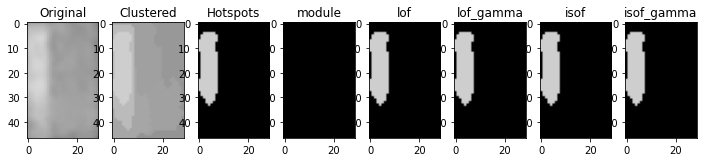

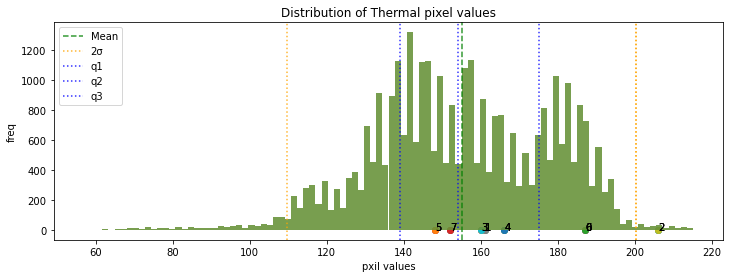

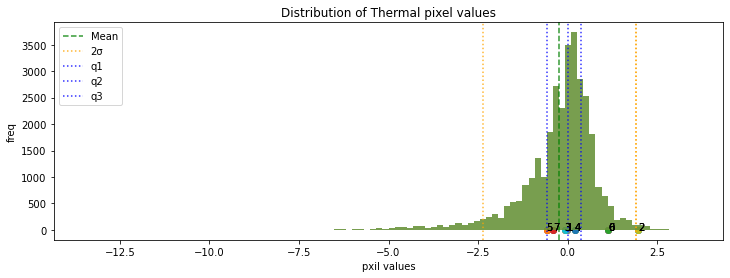

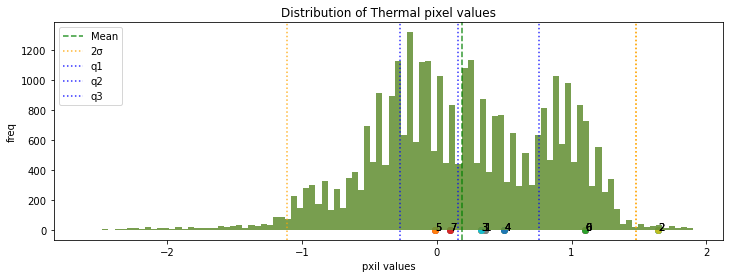

4148.jpg
4148.jpg Multi-Hotspots


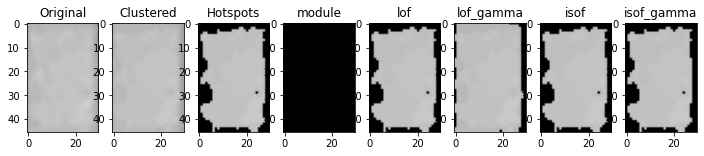

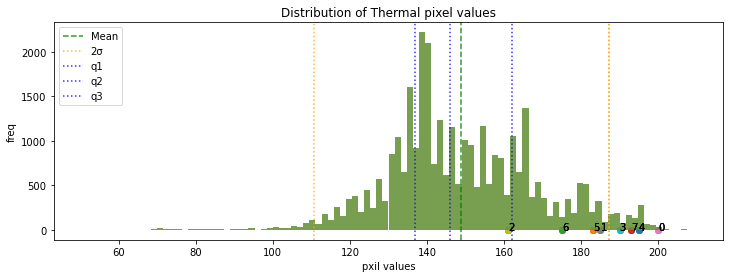

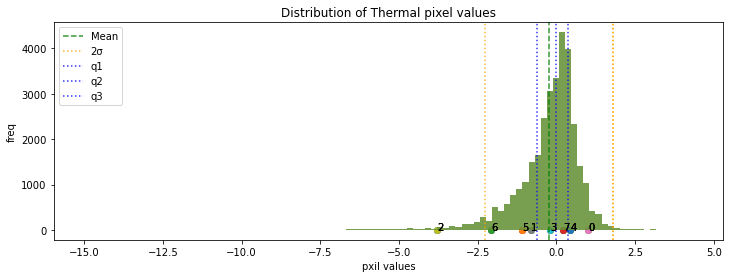

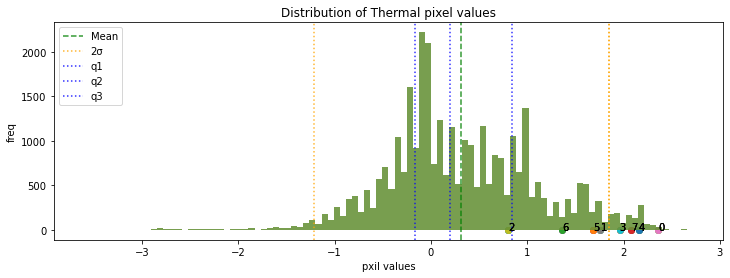

4174.jpg
4174.jpg Single-Hotspot


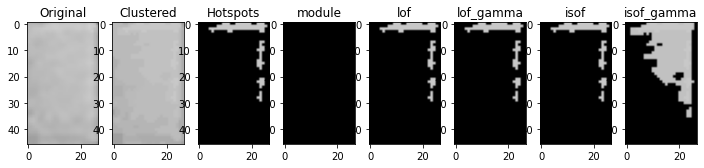

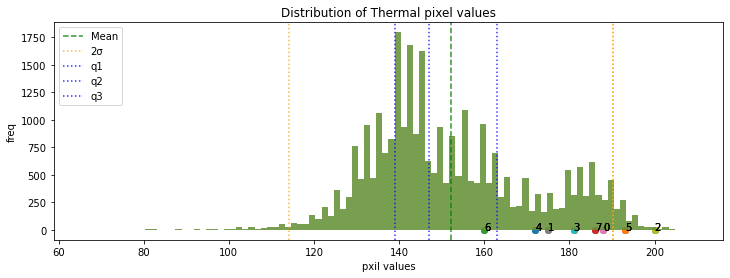

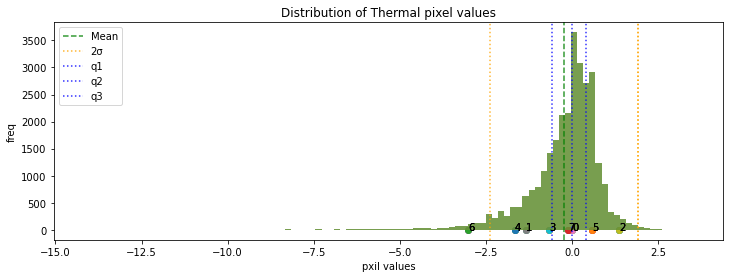

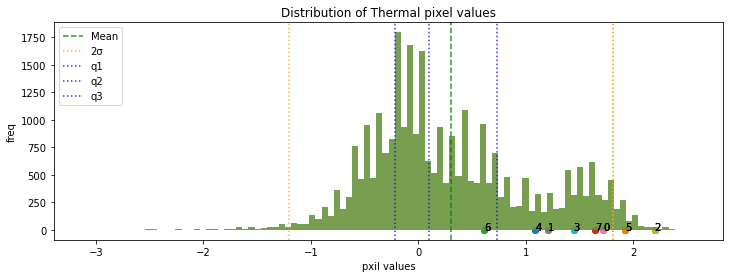

1408.jpg
1408.jpg Multi-Hotspots


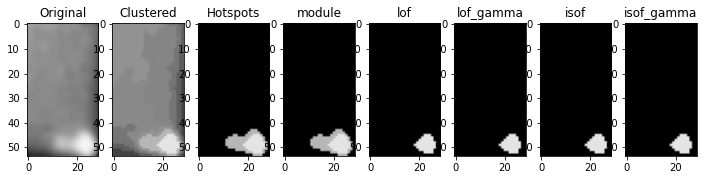

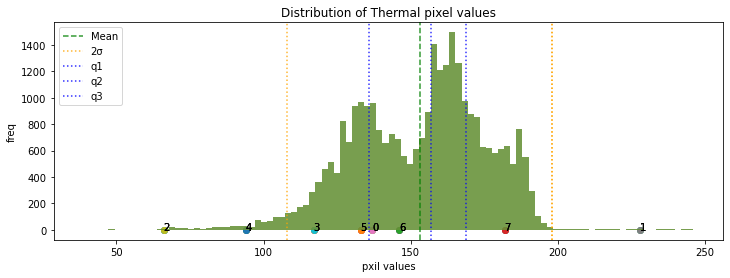

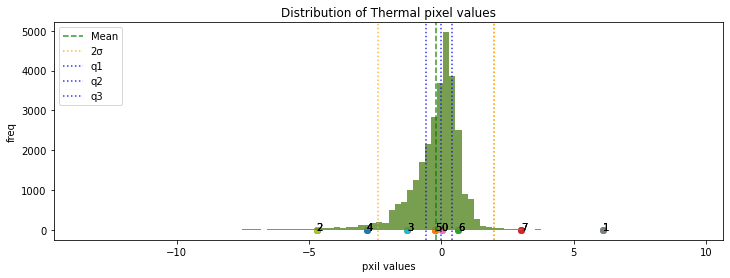

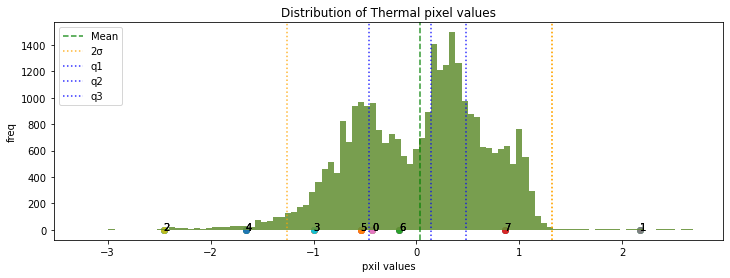

1813.jpg
1813.jpg Module-Anomaly


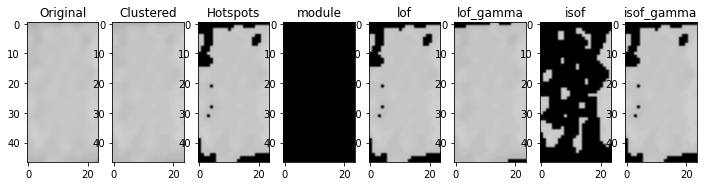

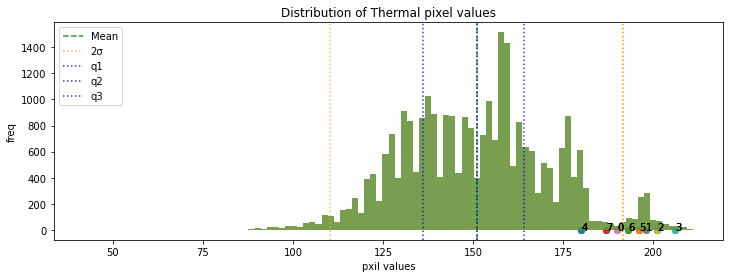

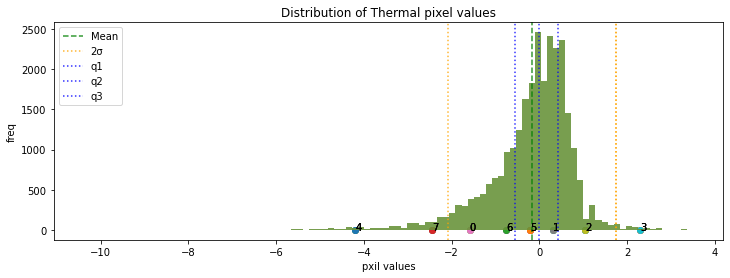

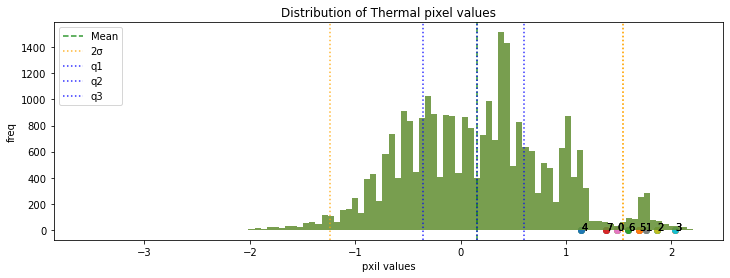

1755.jpg
1755.jpg Module-Anomaly


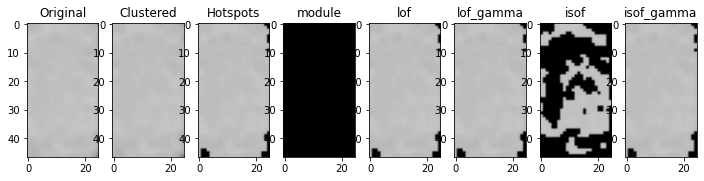

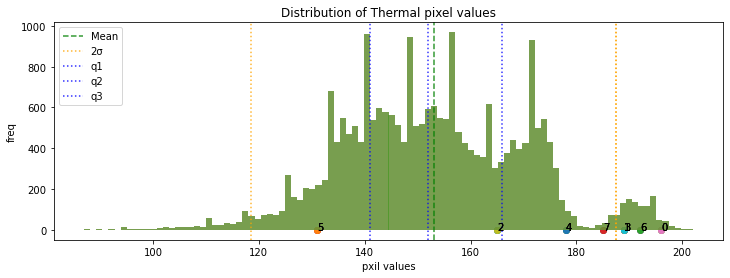

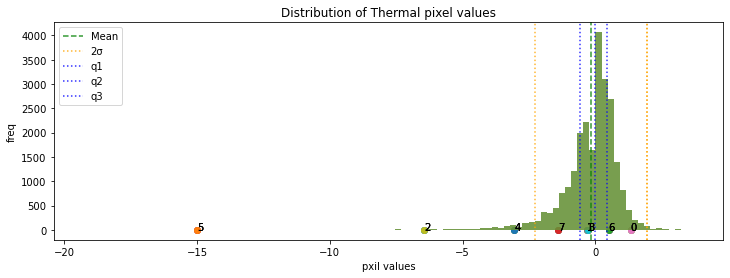

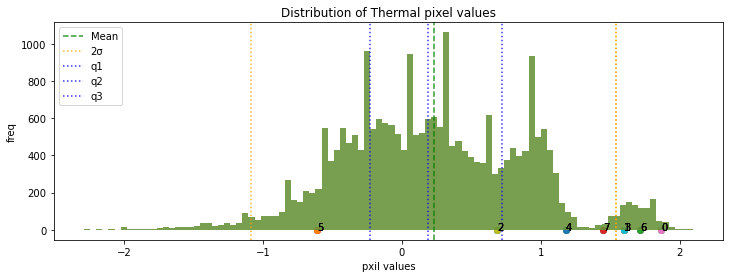

923.jpg
923.jpg Single-Hotspot


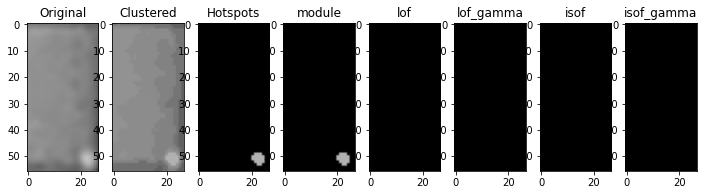

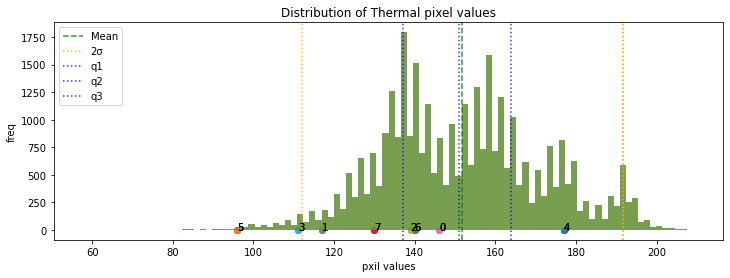

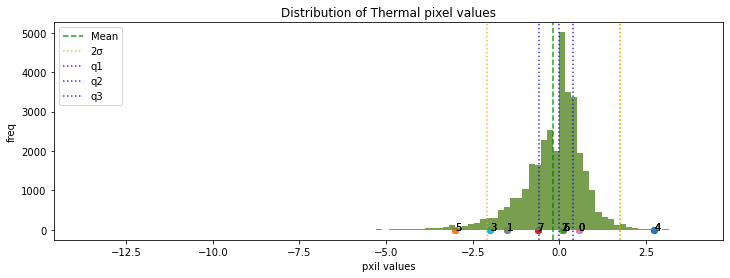

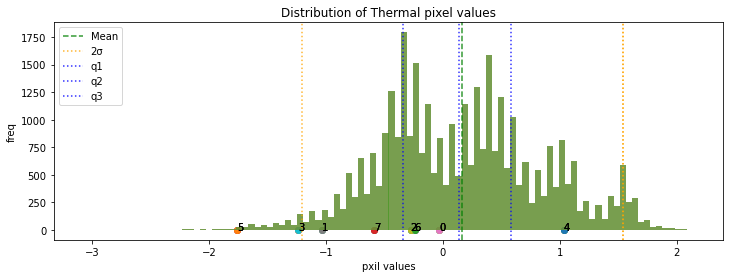

2195.jpg
2195.jpg Normal


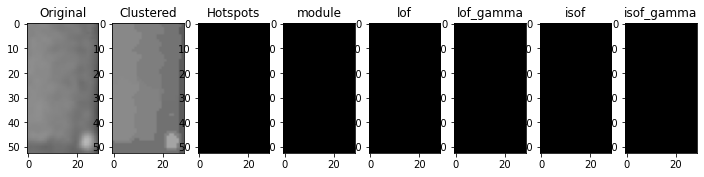

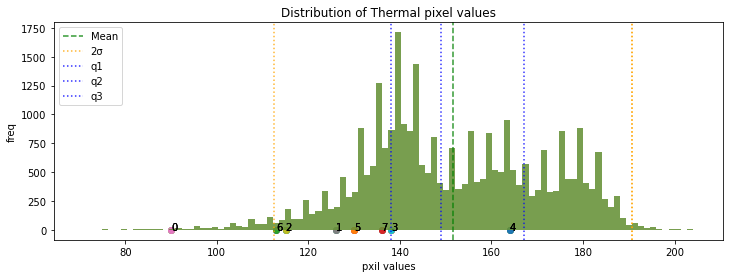

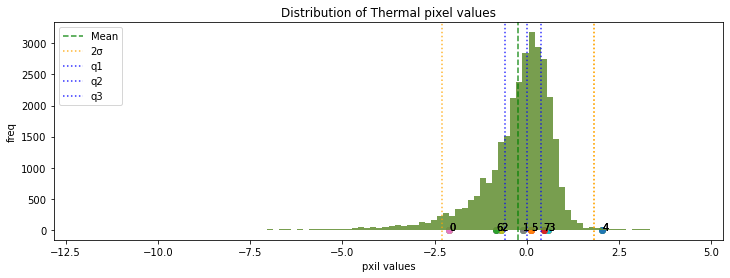

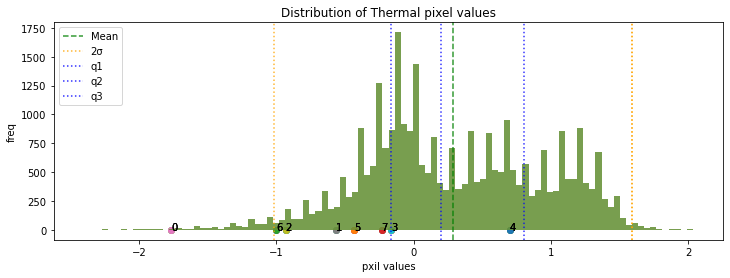

1270.jpg
1270.jpg Multi-Hotspots


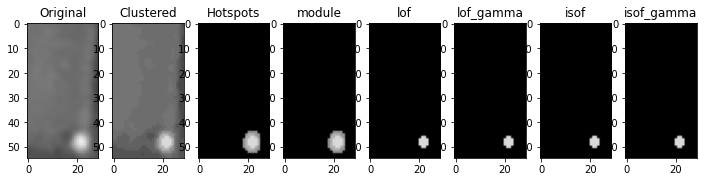

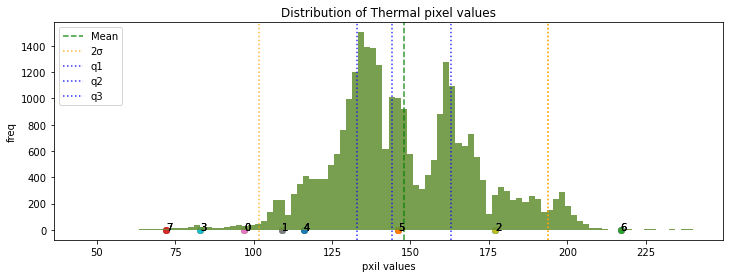

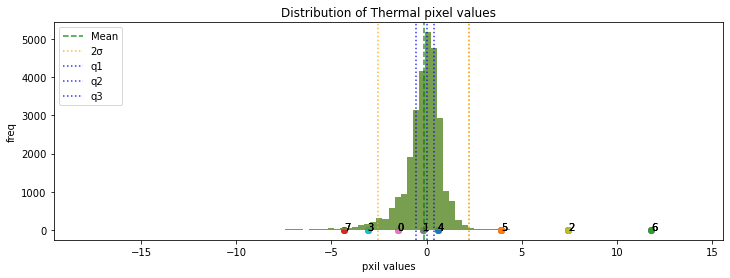

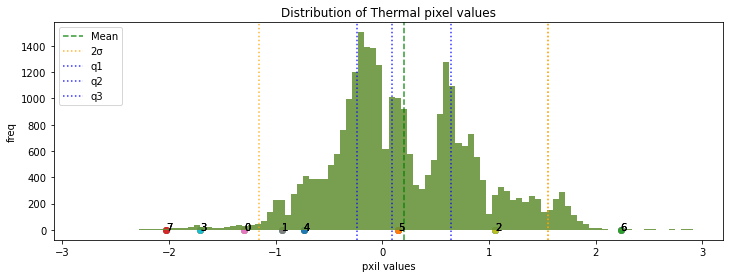

3672.jpg
3672.jpg Multi-Hotspots


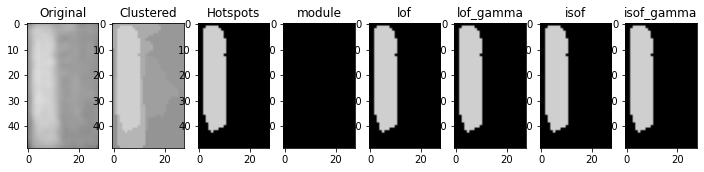

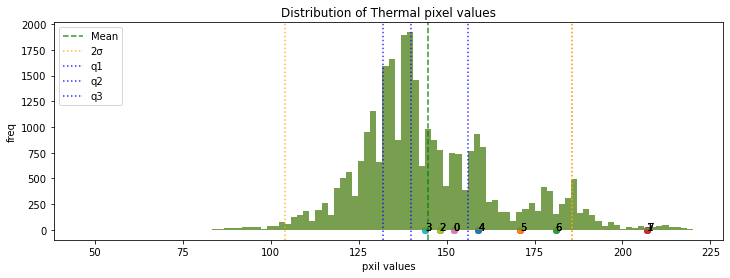

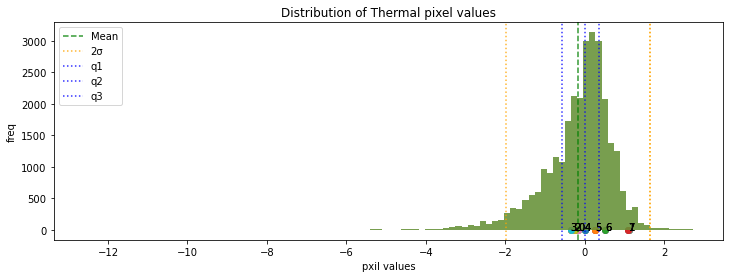

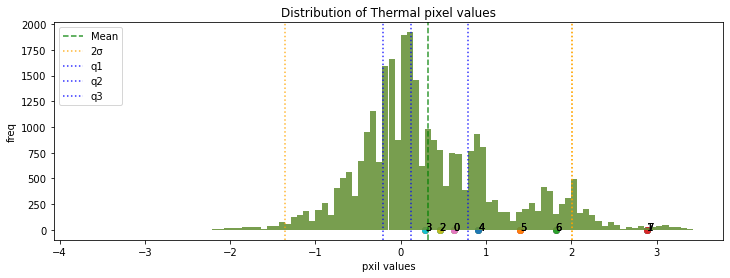

320.jpg
320.jpg Single-Hotspot


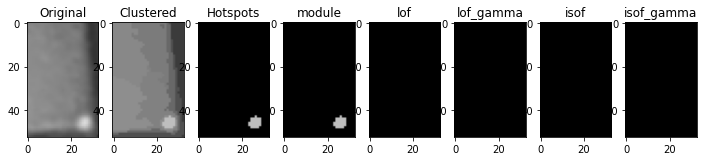

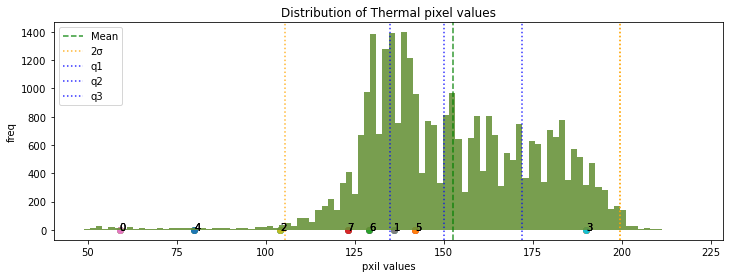

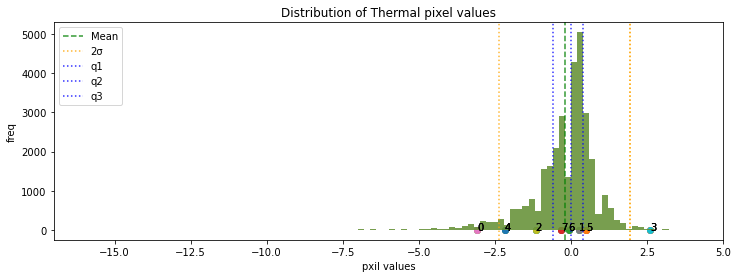

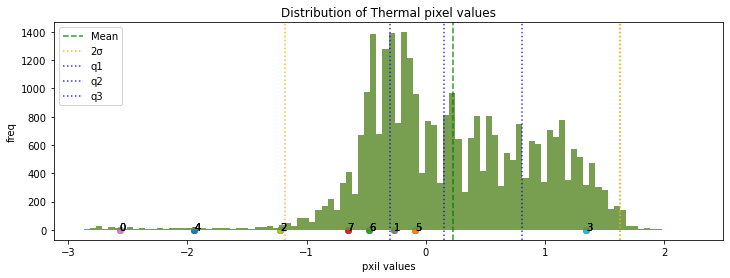

899.jpg
899.jpg Single-Hotspot


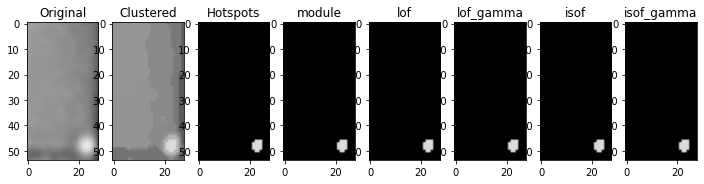

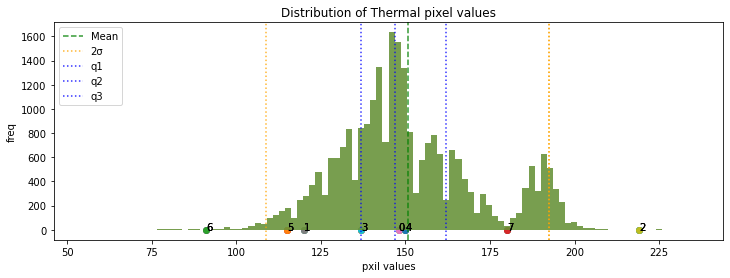

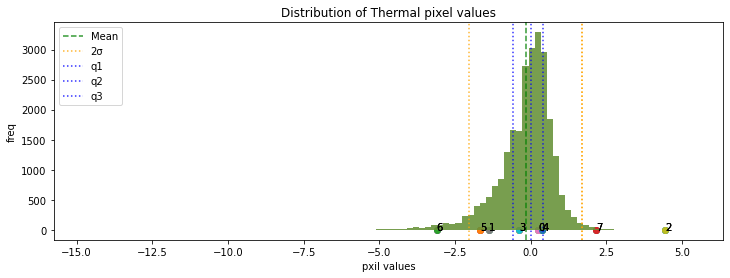

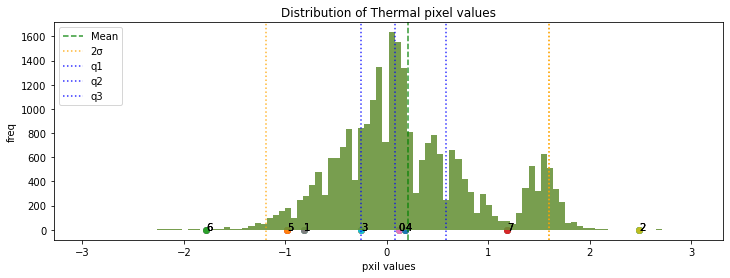

737.jpg
737.jpg Single-Hotspot


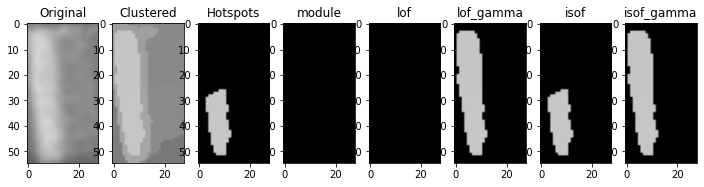

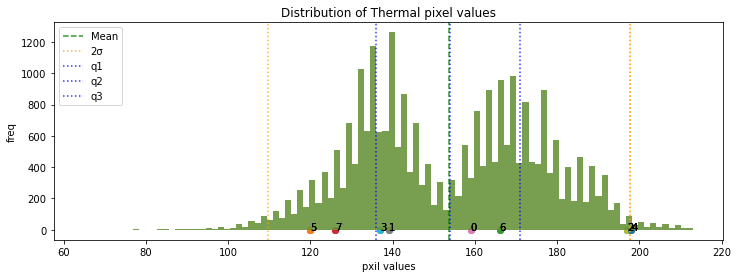

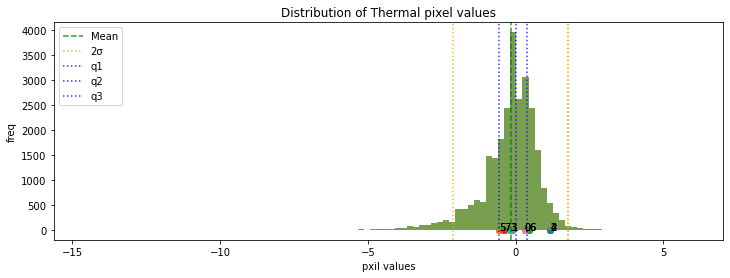

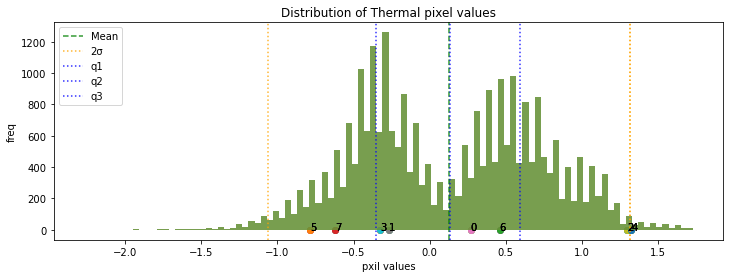

2136.jpg
2136.jpg Multi-Hotspots


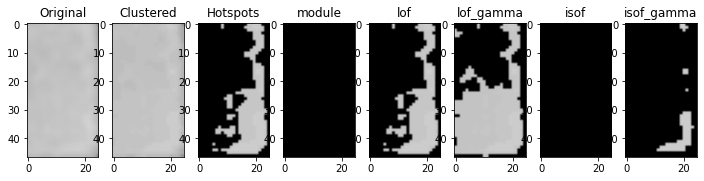

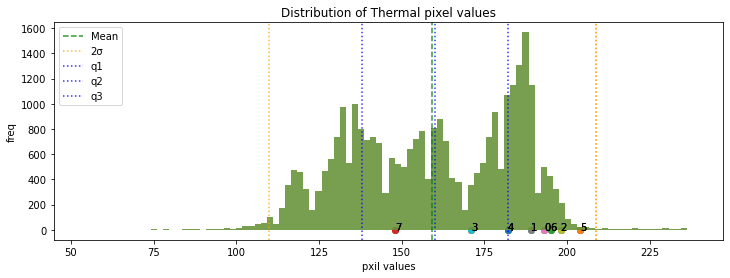

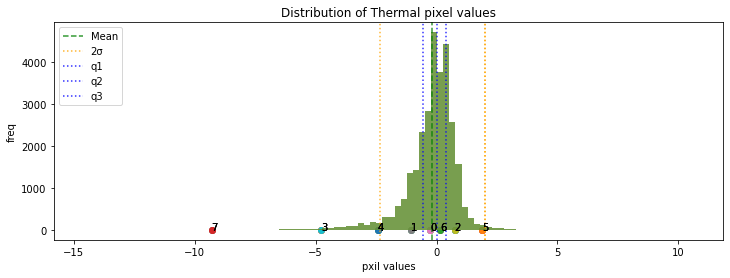

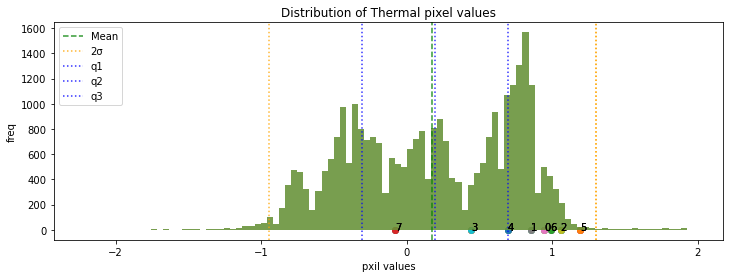

2078.jpg
2078.jpg Single-Hotspot


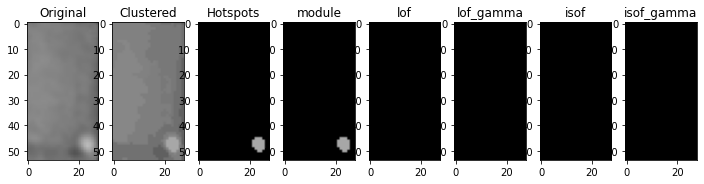

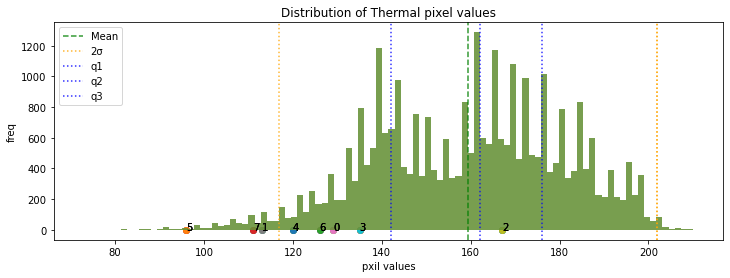

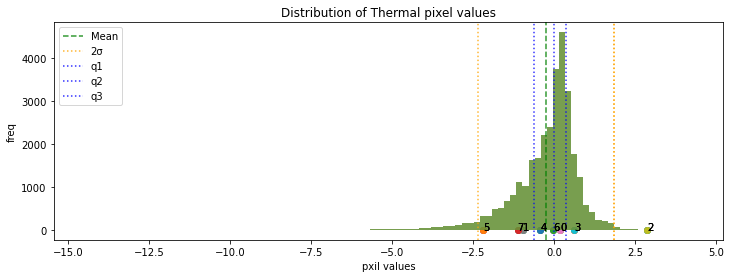

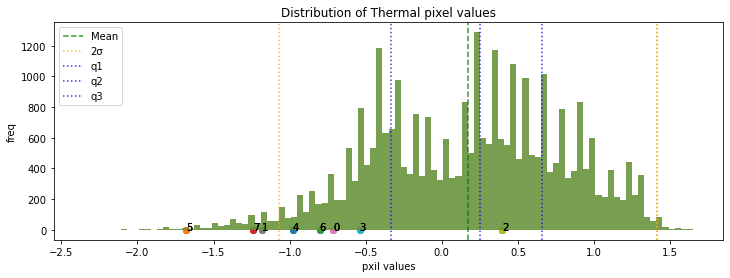

190.jpg
190.jpg Single-Hotspot


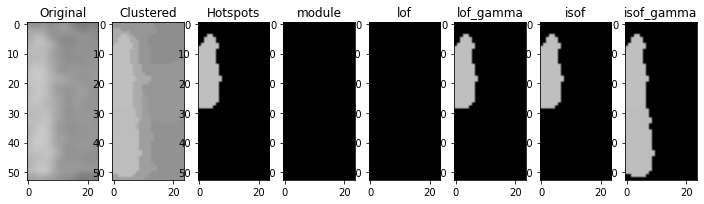

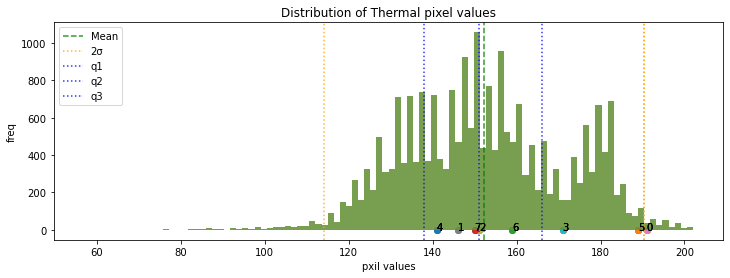

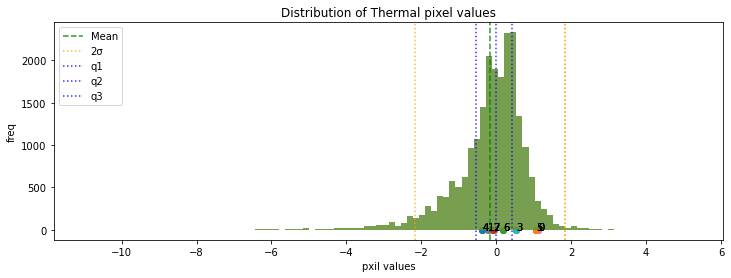

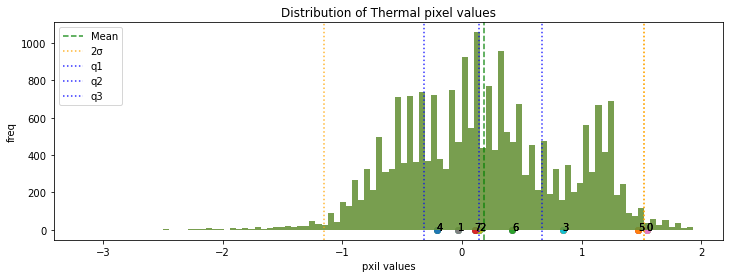

In [276]:
for n, k in enumerate(list(thermal_img_files)):    
    # -- module label --
    l = module_labels[n]
    if l == -1:
        pass
    elif k in list_anomaly_modules + list_other_modules:
        print(k)
        # -- cluster temperature ---
        clusters = clustering.TemperatureClusters(
            data_array[l].scaled_temperature_with_index[k], method=clustering_method)  
        # -- original cluster --
        sliced_data = clusters.get_clusters_data(data_array[l].temperature[k])    
        original_clusters_temperature = np.stack([np.uint8(t.mean(axis=0)) for t in sliced_data])
        # -- scaled cluster --
        sliced_data = clusters.get_clusters_data(data_array[l].scaled_temperature[k])
        scaled_clusters_temperature = np.stack([t.mean(axis=0) for t in sliced_data ])
        # -- transformed temperature --
        transformed_clusters_temperature = array_zscaler[l].transform(original_clusters_temperature)
        #transformed_clusters_temperature = np.log(transformed_clusters_temperature)
        #transformed_clusters_temperature = np.log(transformed_clusters_temperature / np.median(transformed_clusters_temperature ))
        gamma_clusters_temperature = gamma_correction(
            original_clusters_temperature, gamma=gamma)
        # -- anomaly detection --    
        hot_pixels_in_array, hot_clusters_in_array = get_hotspots_in_array(
            transformed_clusters_temperature, thermal_img_files[k], log=False) 
        hot_pixels_in_module, hot_clusters_in_module = get_hotspots_in_module(
            scaled_clusters_temperature, transformed_clusters_temperature, 
            thermal_img_files[k], log=False)
        hot_pixcels_lof, hot_clusters_lof = get_hotspots_by_models(
            original_clusters_temperature, transformed_clusters_temperature,
            array_lof[l], thermal_img_files[k], log=False)
        hot_pixcels_lof_gamma, hot_clusters_lof_gamma = get_hotspots_by_models(
            gamma_clusters_temperature, transformed_clusters_temperature,
            array_lof_gamma[l], thermal_img_files[k], log=False)
        hot_pixcels_isof, hot_clusters_isof = get_hotspots_by_models(
            original_clusters_temperature, transformed_clusters_temperature,
            array_isof[l], thermal_img_files[k], log=False)
        hot_pixcels_isof_gamma, hot_clusters_isof_gamma = get_hotspots_by_models(
            gamma_clusters_temperature, transformed_clusters_temperature,
            array_isof_gamma[l], thermal_img_files[k], log=False)
        hot_pixels = (hot_pixels_in_array 
                      | hot_pixels_in_module 
                      | hot_pixcels_lof_gamma 
                      | hot_pixcels_isof_gamma)
        hot_clusters = (hot_clusters_in_array 
                        | hot_clusters_in_module 
                        | hot_clusters_lof_gamma
                        | hot_clusters_isof_gamma) 
        module_type = anomaly_detection.detect_module_type(hot_clusters, hot_pixels)
        # -- save anomaly modules --
        if module_type not in anomaly_modules:
            anomaly_modules[module_type] = [k]
        else:
            anomaly_modules[module_type].append(k)
        # -- display -- 
        img_clustered = original_clusters_temperature[clusters.labels].reshape(thermal_img_files[k].shape)
        img_hotspots = img_clustered * hot_pixels
        img_hotspots_in_array = img_clustered * hot_pixels_in_array
        img_hotspots_in_module = img_clustered * hot_pixels_in_module
        img_hotspots_lof = img_clustered * hot_pixcels_lof
        img_hotspots_lof_gamma = img_clustered * hot_pixcels_lof_gamma
        img_hotspots_isof = img_clustered * hot_pixcels_isof
        img_hotspots_isof_gamma = img_clustered * hot_pixcels_isof_gamma
        print(k, module_type)
        display.display_modules({
            "Original": thermal_img_files[k], 
            "Clustered": img_clustered,
            "Hotspots": img_hotspots,
            #"Hotspots(array)": img_hotspots_in_array,
            "module": img_hotspots_in_module,
            "lof": img_hotspots_lof,
            "lof_gamma": img_hotspots_lof_gamma,
            "isof": img_hotspots_isof,
            "isof_gamma": img_hotspots_isof_gamma
        })
        display.display_distributions(
            data_array[l].all_temperature,            
            filepath = input_dir_path+"/hist/hist_original_" + k,
            cluster_centers = original_clusters_temperature
        )
        display.display_distributions(
            data_array[l].scaled_all_temperature, 
            filepath = input_dir_path+"/hist/hist_scaled_" + k,
            cluster_centers = scaled_clusters_temperature
            )    
        display.display_distributions(
            #array_zscaler[l].transform(array_clusters_temperature[l]),
            array_zscaler[l].transform(data_array[l].all_temperature),
            filepath = input_dir_path+"/hist/hist_transformed_" + k,
            cluster_centers = transformed_clusters_temperature
        )    

異常モジュールデータの保存

In [ ]:
import json
with open(input_dir_path+"/anomaly_modules.json", "w") as f:
    json.dump(anomaly_modules, f, indent=4, sort_keys=True, separators=(',', ': '))

In [ ]:
with open(input_dir_path+"/anomaly_modules.json", "r") as f:
    anomaly_modules = json.load(f)

モジュール可視化

In [ ]:
modules = Modules(module_contours)

In [ ]:
img_con_index = modules.get_img_contours(img_org, index=True)
module_extraction.show_img({"extracted modules":img_con_index},cmap="gray",figsize=(30,30))

In [ ]:
img_con = modules.get_img_contours(img_org, index=False)
img_mask = cv2.bitwise_and(img_org, img_con)
img_mask_index = modules.add_index(img_mask)
module_extraction.show_img({"extracted modules (overlay)":img_mask_index},cmap="gray",figsize=(30,30))

異常モジュール可視化

In [ ]:
anomaly_contours = modules.get_anomaly_contours(anomaly_modules)

In [ ]:
import copy
color_list = {
    "Single-Hotspot": (0,255,255), # aqua
    "Multi-Hotspots": (0,255,0), # green
    "Cluster-Anomaly": (255,255,0), # yellow
    "Module-Anomaly": (255,165,0), # orange
    "String-Anomaly": (238,130,238) # violet
}
img_target_index = copy.deepcopy(img_mask_index)
for k, v in anomaly_contours.items():
    if k == "Normal":
        continue
    else:
        img_target_index = modules.get_img_target_contours(
            img_target_index, v, index=True, color=color_list[k])
module_extraction.show_img(
    {"highlighted modules":img_target_index}, cmap="gray", figsize=(30,30)
)

In [ ]:
img_write = cv2.cvtColor(img_target_index, cv2.COLOR_BGR2RGB)
cv2.imwrite(input_dir_path+'/img_target_index.png',img_write)

ストリング異常を含めた異常モジュール可視化

In [ ]:
if "Module-Anomaly" in anomaly_contours:
    string_anomaly_labels = modules.get_dbscan_labels(anomaly_contours["Module-Anomaly"])
    string_anomaly_modules = np.array(anomaly_modules["Module-Anomaly"])[string_anomaly_labels > 0]
    anomaly_modules["String-Anomaly"] = list(string_anomaly_modules )

In [ ]:
anomaly_contours = modules.get_anomaly_contours(anomaly_modules)

In [ ]:
img_target_index = copy.deepcopy(img_mask_index)
for k, v in anomaly_contours.items():
    if k == "Normal":
        continue
    else:
        img_target_index = modules.get_img_target_contours(
            img_target_index, v, index=True, color=color_list[k])
module_extraction.show_img(
    {"highlighted modules":img_target_index}, cmap="gray", figsize=(30,30)
)

In [ ]:
img_write = cv2.cvtColor(img_target_index, cv2.COLOR_BGR2RGB)
cv2.imwrite(input_dir_path+'/img_target_w_string_index.png',img_write)

In [ ]:
with open(input_dir_path+"/anomaly_modules.json", "w") as f:
    json.dump(anomaly_modules, f, indent=4, sort_keys=True, separators=(',', ': '))